# Norman

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import rapids_singlecell as rsc
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

print(f"CUDA used: {torch.cuda.is_available()}")

CUDA used: True


In [3]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [4]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    adata_file_path = os.path.join(tardis.config.io_directories["processed"], "cpa_Norman2019_prep_new.h5ad")
    assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
    adata = ad.read_h5ad(adata_file_path)
    adata.X = adata.layers["counts"].copy()
    del adata.layers
    gc.collect()
adata

AnnData object with n_obs × n_vars = 108497 × 5000
    obs: 'cov_drug_dose_name', 'dose_val', 'control', 'condition', 'guide_identity', 'drug_dose_name', 'cell_type', 'split', 'split1', 'split2', 'split3', 'split4', 'split5', 'split6', 'split7', 'split8', 'split9', 'split10', 'split11', 'split12', 'split13', 'split14', 'split15', 'split16', 'split17', 'split18', 'split19', 'split20', 'split21', 'split22', 'split23', 'split24', 'split25'
    var: 'gene_symbols', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'rank_genes_groups_cov'

## Train

In [5]:
warmup_epoch_range = [12, 48]
dtc_w1 = 400
dtc_w2 = 40

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "condition",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [6]:
n_epochs_kl_warmup = 400

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(12 + 12 * len(disentenglement_targets_configurations)), 
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.1,
    include_auxillary_loss = True,
    deeply_inject_disentengled_latents = False,
    encode_covariates=False
)

train_params = dict(
    max_epochs=1000,
    train_size=0.8,
    batch_size=512,
    check_val_every_n_epoch=10,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=True,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-3,
        weight_decay=1e-6,
        # optimizer="AdamW"
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

CUDA backend failed to initialize: Found cuDNN version 8700, but JAX was built against version 8907, which is newer. The copy of cuDNN that is installed must be at least as new as the version against which JAX was built. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: nfkyl8z7
Name: visionary-glade-617
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/nfkyl8z7
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240507_115223-nfkyl8z7/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
You are using a CUDA device ('NVIDIA A100-PCIE-40GB MIG 3g.20gb') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [MIG-0de29bde-f76b-595f-a0fb-97c2b800da3a]


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/1000 [00:00<?, ?it/s]

Epoch 1/1000:   0%|          | 0/1000 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `training` set. Number of elements in each group: 221,378,454,193,394,319,540,136,478,365,423,374,233,285,52,202,466,285,276,523,247,262,142,46,329,151,102,305,101,88,175,191,51,325,214,174,271,147,87,182,368,453,335,984,126,376,171,187,291,315,227,146,373,262,254,382,314,644,300,291,234,603,243,154,256,332,281,740,349,340,255,352,357,362,136,224,222,148,63,118,203,498,309,277,364,215,152,235,394,176,132,96,260,393,156,168,421,68,155,302,180,382,98,239,188,226,326,130,142,293,295,115,116,344,342,336,260,41,47,203,223,268,77,202,322,249,191,243,296,209,986,279,189,525,312,150,495,337,500,457,209,470,471,276,366,231,370,244,282,283,269,245,254,404,400,245,241,192,155,615,245,250,145,153,176,171,519,254,385,216,279,408,613,405,285,260,235,240,184,177,205,193,193,241,618,354,336,364,374,7073,421,281,194,177,342,179,277,261,154,328

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `validation` set. Number of elements in each group: 55,103,104,39,101,60,147,39,104,98,110,90,68,73,7,62,96,80,72,140,59,73,46,18,81,33,32,59,25,19,55,54,13,87,72,37,60,33,27,55,100,113,80,235,53,99,44,54,64,83,58,32,97,66,75,96,73,143,82,75,56,128,54,29,66,93,73,165,92,105,69,107,94,83,23,60,55,43,8,33,44,132,73,68,62,57,40,60,85,40,43,34,69,101,36,32,131,28,38,66,35,81,28,64,49,48,84,37,41,75,54,25,25,101,85,108,67,13,12,63,55,61,19,52,73,62,46,55,65,54,211,58,52,122,63,42,128,95,126,124,52,101,108,62,85,69,74,58,81,83,70,57,65,96,97,68,57,45,37,155,65,43,31,33,39,31,148,61,95,53,66,104,137,108,87,62,49,51,34,45,59,43,62,64,145,80,76,82,89,1834,109,68,51,34,104,38,54,71,46,75,37,63,62,76,67,116,73,56,107,31,13,38,52,83,19,63,71,78,31,42,60,68,61,57,65,54,67,69,49,67,77,97,49,69,10,50,47,123,129,134,101,68,61,46,218,110,34,57

Epoch 1/1000:   0%|          | 1/1000 [00:20<5:47:32, 20.87s/it]

Epoch 1/1000:   0%|          | 1/1000 [00:20<5:47:32, 20.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=135]

Epoch 2/1000:   0%|          | 1/1000 [00:20<5:47:32, 20.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=135]

Epoch 2/1000:   0%|          | 2/1000 [00:29<3:49:58, 13.83s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=135]

Epoch 2/1000:   0%|          | 2/1000 [00:29<3:49:58, 13.83s/it, v_num=z7_1, total_loss_train=1.31e+3, kl_local_train=58.1]

Epoch 3/1000:   0%|          | 2/1000 [00:29<3:49:58, 13.83s/it, v_num=z7_1, total_loss_train=1.31e+3, kl_local_train=58.1]

Epoch 3/1000:   0%|          | 3/1000 [00:38<3:08:26, 11.34s/it, v_num=z7_1, total_loss_train=1.31e+3, kl_local_train=58.1]

Epoch 3/1000:   0%|          | 3/1000 [00:38<3:08:26, 11.34s/it, v_num=z7_1, total_loss_train=1.3e+3, kl_local_train=5.12] 

Epoch 4/1000:   0%|          | 3/1000 [00:38<3:08:26, 11.34s/it, v_num=z7_1, total_loss_train=1.3e+3, kl_local_train=5.12]

Epoch 4/1000:   0%|          | 4/1000 [00:46<2:50:13, 10.25s/it, v_num=z7_1, total_loss_train=1.3e+3, kl_local_train=5.12]

Epoch 4/1000:   0%|          | 4/1000 [00:46<2:50:13, 10.25s/it, v_num=z7_1, total_loss_train=1.29e+3, kl_local_train=3.31]

Epoch 5/1000:   0%|          | 4/1000 [00:46<2:50:13, 10.25s/it, v_num=z7_1, total_loss_train=1.29e+3, kl_local_train=3.31]

Epoch 5/1000:   0%|          | 5/1000 [00:55<2:42:26,  9.80s/it, v_num=z7_1, total_loss_train=1.29e+3, kl_local_train=3.31]

Epoch 5/1000:   0%|          | 5/1000 [00:55<2:42:26,  9.80s/it, v_num=z7_1, total_loss_train=1.27e+3, kl_local_train=36.7]

Epoch 6/1000:   0%|          | 5/1000 [00:55<2:42:26,  9.80s/it, v_num=z7_1, total_loss_train=1.27e+3, kl_local_train=36.7]

Epoch 6/1000:   1%|          | 6/1000 [01:04<2:37:33,  9.51s/it, v_num=z7_1, total_loss_train=1.27e+3, kl_local_train=36.7]

Epoch 6/1000:   1%|          | 6/1000 [01:04<2:37:33,  9.51s/it, v_num=z7_1, total_loss_train=1.26e+3, kl_local_train=31.5]

Epoch 7/1000:   1%|          | 6/1000 [01:04<2:37:33,  9.51s/it, v_num=z7_1, total_loss_train=1.26e+3, kl_local_train=31.5]

Epoch 7/1000:   1%|          | 7/1000 [01:13<2:36:09,  9.44s/it, v_num=z7_1, total_loss_train=1.26e+3, kl_local_train=31.5]

Epoch 7/1000:   1%|          | 7/1000 [01:13<2:36:09,  9.44s/it, v_num=z7_1, total_loss_train=1.24e+3, kl_local_train=32.5]

Epoch 8/1000:   1%|          | 7/1000 [01:13<2:36:09,  9.44s/it, v_num=z7_1, total_loss_train=1.24e+3, kl_local_train=32.5]

Epoch 8/1000:   1%|          | 8/1000 [01:22<2:32:17,  9.21s/it, v_num=z7_1, total_loss_train=1.24e+3, kl_local_train=32.5]

Epoch 8/1000:   1%|          | 8/1000 [01:22<2:32:17,  9.21s/it, v_num=z7_1, total_loss_train=1.23e+3, kl_local_train=36.4]

Epoch 9/1000:   1%|          | 8/1000 [01:22<2:32:17,  9.21s/it, v_num=z7_1, total_loss_train=1.23e+3, kl_local_train=36.4]

Epoch 9/1000:   1%|          | 9/1000 [01:32<2:32:40,  9.24s/it, v_num=z7_1, total_loss_train=1.23e+3, kl_local_train=36.4]

Epoch 9/1000:   1%|          | 9/1000 [01:32<2:32:40,  9.24s/it, v_num=z7_1, total_loss_train=1.22e+3, kl_local_train=35.9]

Epoch 10/1000:   1%|          | 9/1000 [01:32<2:32:40,  9.24s/it, v_num=z7_1, total_loss_train=1.22e+3, kl_local_train=35.9]

Epoch 10/1000:   1%|          | 10/1000 [01:40<2:31:01,  9.15s/it, v_num=z7_1, total_loss_train=1.22e+3, kl_local_train=35.9]

Epoch 10/1000:   1%|          | 10/1000 [01:40<2:31:01,  9.15s/it, v_num=z7_1, total_loss_train=1.21e+3, kl_local_train=36]  

Epoch 11/1000:   1%|          | 10/1000 [01:40<2:31:01,  9.15s/it, v_num=z7_1, total_loss_train=1.21e+3, kl_local_train=36]

Epoch 11/1000:   1%|          | 11/1000 [01:50<2:30:32,  9.13s/it, v_num=z7_1, total_loss_train=1.21e+3, kl_local_train=36]

Epoch 11/1000:   1%|          | 11/1000 [01:50<2:30:32,  9.13s/it, v_num=z7_1, total_loss_train=1.2e+3, kl_local_train=39] 

Epoch 12/1000:   1%|          | 11/1000 [01:50<2:30:32,  9.13s/it, v_num=z7_1, total_loss_train=1.2e+3, kl_local_train=39]

Epoch 12/1000:   1%|          | 12/1000 [01:58<2:28:33,  9.02s/it, v_num=z7_1, total_loss_train=1.2e+3, kl_local_train=39]

Epoch 12/1000:   1%|          | 12/1000 [01:58<2:28:33,  9.02s/it, v_num=z7_1, total_loss_train=1.19e+3, kl_local_train=40.3]

Epoch 13/1000:   1%|          | 12/1000 [01:58<2:28:33,  9.02s/it, v_num=z7_1, total_loss_train=1.19e+3, kl_local_train=40.3]

Epoch 13/1000:   1%|▏         | 13/1000 [02:07<2:27:18,  8.96s/it, v_num=z7_1, total_loss_train=1.19e+3, kl_local_train=40.3]

Epoch 13/1000:   1%|▏         | 13/1000 [02:07<2:27:18,  8.96s/it, v_num=z7_1, total_loss_train=1.18e+3, kl_local_train=42.4]

Epoch 14/1000:   1%|▏         | 13/1000 [02:07<2:27:18,  8.96s/it, v_num=z7_1, total_loss_train=1.18e+3, kl_local_train=42.4]

Epoch 14/1000:   1%|▏         | 14/1000 [02:16<2:26:50,  8.94s/it, v_num=z7_1, total_loss_train=1.18e+3, kl_local_train=42.4]

Epoch 14/1000:   1%|▏         | 14/1000 [02:16<2:26:50,  8.94s/it, v_num=z7_1, total_loss_train=1.19e+3, kl_local_train=43.2]

Epoch 15/1000:   1%|▏         | 14/1000 [02:16<2:26:50,  8.94s/it, v_num=z7_1, total_loss_train=1.19e+3, kl_local_train=43.2]

Epoch 15/1000:   2%|▏         | 15/1000 [02:25<2:28:10,  9.03s/it, v_num=z7_1, total_loss_train=1.19e+3, kl_local_train=43.2]

Epoch 15/1000:   2%|▏         | 15/1000 [02:25<2:28:10,  9.03s/it, v_num=z7_1, total_loss_train=1.19e+3, kl_local_train=44.9]

Epoch 16/1000:   2%|▏         | 15/1000 [02:25<2:28:10,  9.03s/it, v_num=z7_1, total_loss_train=1.19e+3, kl_local_train=44.9]

Epoch 16/1000:   2%|▏         | 16/1000 [02:34<2:28:38,  9.06s/it, v_num=z7_1, total_loss_train=1.19e+3, kl_local_train=44.9]

Epoch 16/1000:   2%|▏         | 16/1000 [02:34<2:28:38,  9.06s/it, v_num=z7_1, total_loss_train=1.2e+3, kl_local_train=46.9] 

Epoch 17/1000:   2%|▏         | 16/1000 [02:34<2:28:38,  9.06s/it, v_num=z7_1, total_loss_train=1.2e+3, kl_local_train=46.9]

Epoch 17/1000:   2%|▏         | 17/1000 [02:43<2:26:40,  8.95s/it, v_num=z7_1, total_loss_train=1.2e+3, kl_local_train=46.9]

Epoch 17/1000:   2%|▏         | 17/1000 [02:43<2:26:40,  8.95s/it, v_num=z7_1, total_loss_train=1.21e+3, kl_local_train=48.8]

Epoch 18/1000:   2%|▏         | 17/1000 [02:43<2:26:40,  8.95s/it, v_num=z7_1, total_loss_train=1.21e+3, kl_local_train=48.8]

Epoch 18/1000:   2%|▏         | 18/1000 [02:52<2:28:00,  9.04s/it, v_num=z7_1, total_loss_train=1.21e+3, kl_local_train=48.8]

Epoch 18/1000:   2%|▏         | 18/1000 [02:52<2:28:00,  9.04s/it, v_num=z7_1, total_loss_train=1.21e+3, kl_local_train=51.4]

Epoch 19/1000:   2%|▏         | 18/1000 [02:52<2:28:00,  9.04s/it, v_num=z7_1, total_loss_train=1.21e+3, kl_local_train=51.4]

Epoch 19/1000:   2%|▏         | 19/1000 [03:01<2:26:51,  8.98s/it, v_num=z7_1, total_loss_train=1.21e+3, kl_local_train=51.4]

Epoch 19/1000:   2%|▏         | 19/1000 [03:01<2:26:51,  8.98s/it, v_num=z7_1, total_loss_train=1.22e+3, kl_local_train=54]  

Epoch 20/1000:   2%|▏         | 19/1000 [03:01<2:26:51,  8.98s/it, v_num=z7_1, total_loss_train=1.22e+3, kl_local_train=54]

Epoch 20/1000:   2%|▏         | 20/1000 [03:10<2:25:38,  8.92s/it, v_num=z7_1, total_loss_train=1.22e+3, kl_local_train=54]

Epoch 20/1000:   2%|▏         | 20/1000 [03:10<2:25:38,  8.92s/it, v_num=z7_1, total_loss_train=1.23e+3, kl_local_train=57.3]

Epoch 21/1000:   2%|▏         | 20/1000 [03:10<2:25:38,  8.92s/it, v_num=z7_1, total_loss_train=1.23e+3, kl_local_train=57.3]

Epoch 21/1000:   2%|▏         | 21/1000 [03:19<2:27:39,  9.05s/it, v_num=z7_1, total_loss_train=1.23e+3, kl_local_train=57.3]

Epoch 21/1000:   2%|▏         | 21/1000 [03:19<2:27:39,  9.05s/it, v_num=z7_1, total_loss_train=1.24e+3, kl_local_train=59.7]

Epoch 22/1000:   2%|▏         | 21/1000 [03:19<2:27:39,  9.05s/it, v_num=z7_1, total_loss_train=1.24e+3, kl_local_train=59.7]

Epoch 22/1000:   2%|▏         | 22/1000 [03:28<2:28:00,  9.08s/it, v_num=z7_1, total_loss_train=1.24e+3, kl_local_train=59.7]

Epoch 22/1000:   2%|▏         | 22/1000 [03:28<2:28:00,  9.08s/it, v_num=z7_1, total_loss_train=1.24e+3, kl_local_train=64.9]

Epoch 23/1000:   2%|▏         | 22/1000 [03:28<2:28:00,  9.08s/it, v_num=z7_1, total_loss_train=1.24e+3, kl_local_train=64.9]

Epoch 23/1000:   2%|▏         | 23/1000 [03:38<2:29:06,  9.16s/it, v_num=z7_1, total_loss_train=1.24e+3, kl_local_train=64.9]

Epoch 23/1000:   2%|▏         | 23/1000 [03:38<2:29:06,  9.16s/it, v_num=z7_1, total_loss_train=1.25e+3, kl_local_train=66.8]

Epoch 24/1000:   2%|▏         | 23/1000 [03:38<2:29:06,  9.16s/it, v_num=z7_1, total_loss_train=1.25e+3, kl_local_train=66.8]

Epoch 24/1000:   2%|▏         | 24/1000 [03:47<2:28:36,  9.14s/it, v_num=z7_1, total_loss_train=1.25e+3, kl_local_train=66.8]

Epoch 24/1000:   2%|▏         | 24/1000 [03:47<2:28:36,  9.14s/it, v_num=z7_1, total_loss_train=1.26e+3, kl_local_train=68.9]

Epoch 25/1000:   2%|▏         | 24/1000 [03:47<2:28:36,  9.14s/it, v_num=z7_1, total_loss_train=1.26e+3, kl_local_train=68.9]

Epoch 25/1000:   2%|▎         | 25/1000 [03:56<2:27:52,  9.10s/it, v_num=z7_1, total_loss_train=1.26e+3, kl_local_train=68.9]

Epoch 25/1000:   2%|▎         | 25/1000 [03:56<2:27:52,  9.10s/it, v_num=z7_1, total_loss_train=1.27e+3, kl_local_train=72.4]

Epoch 26/1000:   2%|▎         | 25/1000 [03:56<2:27:52,  9.10s/it, v_num=z7_1, total_loss_train=1.27e+3, kl_local_train=72.4]

Epoch 26/1000:   3%|▎         | 26/1000 [04:05<2:28:27,  9.15s/it, v_num=z7_1, total_loss_train=1.27e+3, kl_local_train=72.4]

Epoch 26/1000:   3%|▎         | 26/1000 [04:05<2:28:27,  9.15s/it, v_num=z7_1, total_loss_train=1.28e+3, kl_local_train=77.3]

Epoch 27/1000:   3%|▎         | 26/1000 [04:05<2:28:27,  9.15s/it, v_num=z7_1, total_loss_train=1.28e+3, kl_local_train=77.3]

Epoch 27/1000:   3%|▎         | 27/1000 [04:14<2:29:03,  9.19s/it, v_num=z7_1, total_loss_train=1.28e+3, kl_local_train=77.3]

Epoch 27/1000:   3%|▎         | 27/1000 [04:14<2:29:03,  9.19s/it, v_num=z7_1, total_loss_train=1.29e+3, kl_local_train=77.4]

Epoch 28/1000:   3%|▎         | 27/1000 [04:14<2:29:03,  9.19s/it, v_num=z7_1, total_loss_train=1.29e+3, kl_local_train=77.4]

Epoch 28/1000:   3%|▎         | 28/1000 [04:23<2:27:44,  9.12s/it, v_num=z7_1, total_loss_train=1.29e+3, kl_local_train=77.4]

Epoch 28/1000:   3%|▎         | 28/1000 [04:23<2:27:44,  9.12s/it, v_num=z7_1, total_loss_train=1.3e+3, kl_local_train=81.4] 

Epoch 29/1000:   3%|▎         | 28/1000 [04:23<2:27:44,  9.12s/it, v_num=z7_1, total_loss_train=1.3e+3, kl_local_train=81.4]

Epoch 29/1000:   3%|▎         | 29/1000 [04:33<2:28:01,  9.15s/it, v_num=z7_1, total_loss_train=1.3e+3, kl_local_train=81.4]

Epoch 29/1000:   3%|▎         | 29/1000 [04:33<2:28:01,  9.15s/it, v_num=z7_1, total_loss_train=1.31e+3, kl_local_train=82.7]

Epoch 30/1000:   3%|▎         | 29/1000 [04:33<2:28:01,  9.15s/it, v_num=z7_1, total_loss_train=1.31e+3, kl_local_train=82.7]

Epoch 30/1000:   3%|▎         | 30/1000 [04:42<2:29:02,  9.22s/it, v_num=z7_1, total_loss_train=1.31e+3, kl_local_train=82.7]

Epoch 30/1000:   3%|▎         | 30/1000 [04:42<2:29:02,  9.22s/it, v_num=z7_1, total_loss_train=1.31e+3, kl_local_train=85.9]

Epoch 31/1000:   3%|▎         | 30/1000 [04:42<2:29:02,  9.22s/it, v_num=z7_1, total_loss_train=1.31e+3, kl_local_train=85.9]

Epoch 31/1000:   3%|▎         | 31/1000 [04:51<2:28:00,  9.16s/it, v_num=z7_1, total_loss_train=1.31e+3, kl_local_train=85.9]

Epoch 31/1000:   3%|▎         | 31/1000 [04:51<2:28:00,  9.16s/it, v_num=z7_1, total_loss_train=1.32e+3, kl_local_train=87.7]

Epoch 32/1000:   3%|▎         | 31/1000 [04:51<2:28:00,  9.16s/it, v_num=z7_1, total_loss_train=1.32e+3, kl_local_train=87.7]

Epoch 32/1000:   3%|▎         | 32/1000 [05:00<2:25:30,  9.02s/it, v_num=z7_1, total_loss_train=1.32e+3, kl_local_train=87.7]

Epoch 32/1000:   3%|▎         | 32/1000 [05:00<2:25:30,  9.02s/it, v_num=z7_1, total_loss_train=1.33e+3, kl_local_train=91.1]

Epoch 33/1000:   3%|▎         | 32/1000 [05:00<2:25:30,  9.02s/it, v_num=z7_1, total_loss_train=1.33e+3, kl_local_train=91.1]

Epoch 33/1000:   3%|▎         | 33/1000 [05:09<2:27:00,  9.12s/it, v_num=z7_1, total_loss_train=1.33e+3, kl_local_train=91.1]

Epoch 33/1000:   3%|▎         | 33/1000 [05:09<2:27:00,  9.12s/it, v_num=z7_1, total_loss_train=1.34e+3, kl_local_train=93.6]

Epoch 34/1000:   3%|▎         | 33/1000 [05:09<2:27:00,  9.12s/it, v_num=z7_1, total_loss_train=1.34e+3, kl_local_train=93.6]

Epoch 34/1000:   3%|▎         | 34/1000 [05:19<2:28:34,  9.23s/it, v_num=z7_1, total_loss_train=1.34e+3, kl_local_train=93.6]

Epoch 34/1000:   3%|▎         | 34/1000 [05:19<2:28:34,  9.23s/it, v_num=z7_1, total_loss_train=1.35e+3, kl_local_train=91.5]

Epoch 35/1000:   3%|▎         | 34/1000 [05:19<2:28:34,  9.23s/it, v_num=z7_1, total_loss_train=1.35e+3, kl_local_train=91.5]

Epoch 35/1000:   4%|▎         | 35/1000 [05:28<2:28:56,  9.26s/it, v_num=z7_1, total_loss_train=1.35e+3, kl_local_train=91.5]

Epoch 35/1000:   4%|▎         | 35/1000 [05:28<2:28:56,  9.26s/it, v_num=z7_1, total_loss_train=1.36e+3, kl_local_train=90.8]

Epoch 36/1000:   4%|▎         | 35/1000 [05:28<2:28:56,  9.26s/it, v_num=z7_1, total_loss_train=1.36e+3, kl_local_train=90.8]

Epoch 36/1000:   4%|▎         | 36/1000 [05:37<2:28:07,  9.22s/it, v_num=z7_1, total_loss_train=1.36e+3, kl_local_train=90.8]

Epoch 36/1000:   4%|▎         | 36/1000 [05:37<2:28:07,  9.22s/it, v_num=z7_1, total_loss_train=1.37e+3, kl_local_train=95.8]

Epoch 37/1000:   4%|▎         | 36/1000 [05:37<2:28:07,  9.22s/it, v_num=z7_1, total_loss_train=1.37e+3, kl_local_train=95.8]

Epoch 37/1000:   4%|▎         | 37/1000 [05:46<2:26:08,  9.11s/it, v_num=z7_1, total_loss_train=1.37e+3, kl_local_train=95.8]

Epoch 37/1000:   4%|▎         | 37/1000 [05:46<2:26:08,  9.11s/it, v_num=z7_1, total_loss_train=1.38e+3, kl_local_train=96.6]

Epoch 38/1000:   4%|▎         | 37/1000 [05:46<2:26:08,  9.11s/it, v_num=z7_1, total_loss_train=1.38e+3, kl_local_train=96.6]

Epoch 38/1000:   4%|▍         | 38/1000 [05:55<2:24:33,  9.02s/it, v_num=z7_1, total_loss_train=1.38e+3, kl_local_train=96.6]

Epoch 38/1000:   4%|▍         | 38/1000 [05:55<2:24:33,  9.02s/it, v_num=z7_1, total_loss_train=1.39e+3, kl_local_train=96.7]

Epoch 39/1000:   4%|▍         | 38/1000 [05:55<2:24:33,  9.02s/it, v_num=z7_1, total_loss_train=1.39e+3, kl_local_train=96.7]

Epoch 39/1000:   4%|▍         | 39/1000 [06:04<2:23:39,  8.97s/it, v_num=z7_1, total_loss_train=1.39e+3, kl_local_train=96.7]

Epoch 39/1000:   4%|▍         | 39/1000 [06:04<2:23:39,  8.97s/it, v_num=z7_1, total_loss_train=1.4e+3, kl_local_train=97.8] 

Epoch 40/1000:   4%|▍         | 39/1000 [06:04<2:23:39,  8.97s/it, v_num=z7_1, total_loss_train=1.4e+3, kl_local_train=97.8]

Epoch 40/1000:   4%|▍         | 40/1000 [06:12<2:22:45,  8.92s/it, v_num=z7_1, total_loss_train=1.4e+3, kl_local_train=97.8]

Epoch 40/1000:   4%|▍         | 40/1000 [06:12<2:22:45,  8.92s/it, v_num=z7_1, total_loss_train=1.41e+3, kl_local_train=95.3]

Epoch 41/1000:   4%|▍         | 40/1000 [06:12<2:22:45,  8.92s/it, v_num=z7_1, total_loss_train=1.41e+3, kl_local_train=95.3]

Epoch 41/1000:   4%|▍         | 41/1000 [06:21<2:22:16,  8.90s/it, v_num=z7_1, total_loss_train=1.41e+3, kl_local_train=95.3]

Epoch 41/1000:   4%|▍         | 41/1000 [06:21<2:22:16,  8.90s/it, v_num=z7_1, total_loss_train=1.42e+3, kl_local_train=93]  

Epoch 42/1000:   4%|▍         | 41/1000 [06:21<2:22:16,  8.90s/it, v_num=z7_1, total_loss_train=1.42e+3, kl_local_train=93]

Epoch 42/1000:   4%|▍         | 42/1000 [06:30<2:21:51,  8.89s/it, v_num=z7_1, total_loss_train=1.42e+3, kl_local_train=93]

Epoch 42/1000:   4%|▍         | 42/1000 [06:30<2:21:51,  8.89s/it, v_num=z7_1, total_loss_train=1.43e+3, kl_local_train=94.7]

Epoch 43/1000:   4%|▍         | 42/1000 [06:30<2:21:51,  8.89s/it, v_num=z7_1, total_loss_train=1.43e+3, kl_local_train=94.7]

Epoch 43/1000:   4%|▍         | 43/1000 [06:39<2:21:12,  8.85s/it, v_num=z7_1, total_loss_train=1.43e+3, kl_local_train=94.7]

Epoch 43/1000:   4%|▍         | 43/1000 [06:39<2:21:12,  8.85s/it, v_num=z7_1, total_loss_train=1.44e+3, kl_local_train=99.4]

Epoch 44/1000:   4%|▍         | 43/1000 [06:39<2:21:12,  8.85s/it, v_num=z7_1, total_loss_train=1.44e+3, kl_local_train=99.4]

Epoch 44/1000:   4%|▍         | 44/1000 [06:48<2:23:57,  9.03s/it, v_num=z7_1, total_loss_train=1.44e+3, kl_local_train=99.4]

Epoch 44/1000:   4%|▍         | 44/1000 [06:48<2:23:57,  9.03s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=103] 

Epoch 45/1000:   4%|▍         | 44/1000 [06:48<2:23:57,  9.03s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=103]

Epoch 45/1000:   4%|▍         | 45/1000 [06:58<2:24:57,  9.11s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=103]

Epoch 45/1000:   4%|▍         | 45/1000 [06:58<2:24:57,  9.11s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=107]

Epoch 46/1000:   4%|▍         | 45/1000 [06:58<2:24:57,  9.11s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=107]

Epoch 46/1000:   5%|▍         | 46/1000 [07:06<2:24:00,  9.06s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=107]

Epoch 46/1000:   5%|▍         | 46/1000 [07:06<2:24:00,  9.06s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=100]

Epoch 47/1000:   5%|▍         | 46/1000 [07:06<2:24:00,  9.06s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=100]

Epoch 47/1000:   5%|▍         | 47/1000 [07:16<2:25:25,  9.16s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=100]

Epoch 47/1000:   5%|▍         | 47/1000 [07:16<2:25:25,  9.16s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=106]

Epoch 48/1000:   5%|▍         | 47/1000 [07:16<2:25:25,  9.16s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=106]

Epoch 48/1000:   5%|▍         | 48/1000 [07:25<2:25:10,  9.15s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=106]

Epoch 48/1000:   5%|▍         | 48/1000 [07:25<2:25:10,  9.15s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=103]

Epoch 49/1000:   5%|▍         | 48/1000 [07:25<2:25:10,  9.15s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=103]

Epoch 49/1000:   5%|▍         | 49/1000 [07:34<2:24:27,  9.11s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=103]

Epoch 49/1000:   5%|▍         | 49/1000 [07:34<2:24:27,  9.11s/it, v_num=z7_1, total_loss_train=1.5e+3, kl_local_train=106] 

Epoch 50/1000:   5%|▍         | 49/1000 [07:34<2:24:27,  9.11s/it, v_num=z7_1, total_loss_train=1.5e+3, kl_local_train=106]

Epoch 50/1000:   5%|▌         | 50/1000 [07:43<2:22:32,  9.00s/it, v_num=z7_1, total_loss_train=1.5e+3, kl_local_train=106]

Epoch 50/1000:   5%|▌         | 50/1000 [07:43<2:22:32,  9.00s/it, v_num=z7_1, total_loss_train=1.51e+3, kl_local_train=107]

Epoch 51/1000:   5%|▌         | 50/1000 [07:43<2:22:32,  9.00s/it, v_num=z7_1, total_loss_train=1.51e+3, kl_local_train=107]

Epoch 51/1000:   5%|▌         | 51/1000 [07:52<2:21:22,  8.94s/it, v_num=z7_1, total_loss_train=1.51e+3, kl_local_train=107]

Epoch 51/1000:   5%|▌         | 51/1000 [07:52<2:21:22,  8.94s/it, v_num=z7_1, total_loss_train=1.51e+3, kl_local_train=109]

Epoch 52/1000:   5%|▌         | 51/1000 [07:52<2:21:22,  8.94s/it, v_num=z7_1, total_loss_train=1.51e+3, kl_local_train=109]

Epoch 52/1000:   5%|▌         | 52/1000 [08:00<2:20:34,  8.90s/it, v_num=z7_1, total_loss_train=1.51e+3, kl_local_train=109]

Epoch 52/1000:   5%|▌         | 52/1000 [08:00<2:20:34,  8.90s/it, v_num=z7_1, total_loss_train=1.51e+3, kl_local_train=102]

Epoch 53/1000:   5%|▌         | 52/1000 [08:00<2:20:34,  8.90s/it, v_num=z7_1, total_loss_train=1.51e+3, kl_local_train=102]

Epoch 53/1000:   5%|▌         | 53/1000 [08:10<2:22:39,  9.04s/it, v_num=z7_1, total_loss_train=1.51e+3, kl_local_train=102]

Epoch 53/1000:   5%|▌         | 53/1000 [08:10<2:22:39,  9.04s/it, v_num=z7_1, total_loss_train=1.51e+3, kl_local_train=96.5]

Epoch 54/1000:   5%|▌         | 53/1000 [08:10<2:22:39,  9.04s/it, v_num=z7_1, total_loss_train=1.51e+3, kl_local_train=96.5]

Epoch 54/1000:   5%|▌         | 54/1000 [08:19<2:22:58,  9.07s/it, v_num=z7_1, total_loss_train=1.51e+3, kl_local_train=96.5]

Epoch 54/1000:   5%|▌         | 54/1000 [08:19<2:22:58,  9.07s/it, v_num=z7_1, total_loss_train=1.51e+3, kl_local_train=92.7]

Epoch 55/1000:   5%|▌         | 54/1000 [08:19<2:22:58,  9.07s/it, v_num=z7_1, total_loss_train=1.51e+3, kl_local_train=92.7]

Epoch 55/1000:   6%|▌         | 55/1000 [08:28<2:21:12,  8.97s/it, v_num=z7_1, total_loss_train=1.51e+3, kl_local_train=92.7]

Epoch 55/1000:   6%|▌         | 55/1000 [08:28<2:21:12,  8.97s/it, v_num=z7_1, total_loss_train=1.51e+3, kl_local_train=97.1]

Epoch 56/1000:   6%|▌         | 55/1000 [08:28<2:21:12,  8.97s/it, v_num=z7_1, total_loss_train=1.51e+3, kl_local_train=97.1]

Epoch 56/1000:   6%|▌         | 56/1000 [08:37<2:22:48,  9.08s/it, v_num=z7_1, total_loss_train=1.51e+3, kl_local_train=97.1]

Epoch 56/1000:   6%|▌         | 56/1000 [08:37<2:22:48,  9.08s/it, v_num=z7_1, total_loss_train=1.51e+3, kl_local_train=97.5]

Epoch 57/1000:   6%|▌         | 56/1000 [08:37<2:22:48,  9.08s/it, v_num=z7_1, total_loss_train=1.51e+3, kl_local_train=97.5]

Epoch 57/1000:   6%|▌         | 57/1000 [08:46<2:22:04,  9.04s/it, v_num=z7_1, total_loss_train=1.51e+3, kl_local_train=97.5]

Epoch 57/1000:   6%|▌         | 57/1000 [08:46<2:22:04,  9.04s/it, v_num=z7_1, total_loss_train=1.5e+3, kl_local_train=91.6] 

Epoch 58/1000:   6%|▌         | 57/1000 [08:46<2:22:04,  9.04s/it, v_num=z7_1, total_loss_train=1.5e+3, kl_local_train=91.6]

Epoch 58/1000:   6%|▌         | 58/1000 [08:55<2:21:47,  9.03s/it, v_num=z7_1, total_loss_train=1.5e+3, kl_local_train=91.6]

Epoch 58/1000:   6%|▌         | 58/1000 [08:55<2:21:47,  9.03s/it, v_num=z7_1, total_loss_train=1.5e+3, kl_local_train=94.4]

Epoch 59/1000:   6%|▌         | 58/1000 [08:55<2:21:47,  9.03s/it, v_num=z7_1, total_loss_train=1.5e+3, kl_local_train=94.4]

Epoch 59/1000:   6%|▌         | 59/1000 [09:04<2:21:17,  9.01s/it, v_num=z7_1, total_loss_train=1.5e+3, kl_local_train=94.4]

Epoch 59/1000:   6%|▌         | 59/1000 [09:04<2:21:17,  9.01s/it, v_num=z7_1, total_loss_train=1.5e+3, kl_local_train=90.1]

Epoch 60/1000:   6%|▌         | 59/1000 [09:04<2:21:17,  9.01s/it, v_num=z7_1, total_loss_train=1.5e+3, kl_local_train=90.1]

Epoch 60/1000:   6%|▌         | 60/1000 [09:13<2:20:38,  8.98s/it, v_num=z7_1, total_loss_train=1.5e+3, kl_local_train=90.1]

Epoch 60/1000:   6%|▌         | 60/1000 [09:13<2:20:38,  8.98s/it, v_num=z7_1, total_loss_train=1.5e+3, kl_local_train=89.9]

Epoch 61/1000:   6%|▌         | 60/1000 [09:13<2:20:38,  8.98s/it, v_num=z7_1, total_loss_train=1.5e+3, kl_local_train=89.9]

Epoch 61/1000:   6%|▌         | 61/1000 [09:22<2:20:52,  9.00s/it, v_num=z7_1, total_loss_train=1.5e+3, kl_local_train=89.9]

Epoch 61/1000:   6%|▌         | 61/1000 [09:22<2:20:52,  9.00s/it, v_num=z7_1, total_loss_train=1.5e+3, kl_local_train=86.5]

Epoch 62/1000:   6%|▌         | 61/1000 [09:22<2:20:52,  9.00s/it, v_num=z7_1, total_loss_train=1.5e+3, kl_local_train=86.5]

Epoch 62/1000:   6%|▌         | 62/1000 [09:31<2:20:44,  9.00s/it, v_num=z7_1, total_loss_train=1.5e+3, kl_local_train=86.5]

Epoch 62/1000:   6%|▌         | 62/1000 [09:31<2:20:44,  9.00s/it, v_num=z7_1, total_loss_train=1.5e+3, kl_local_train=84.1]

Epoch 63/1000:   6%|▌         | 62/1000 [09:31<2:20:44,  9.00s/it, v_num=z7_1, total_loss_train=1.5e+3, kl_local_train=84.1]

Epoch 63/1000:   6%|▋         | 63/1000 [09:40<2:23:13,  9.17s/it, v_num=z7_1, total_loss_train=1.5e+3, kl_local_train=84.1]

Epoch 63/1000:   6%|▋         | 63/1000 [09:40<2:23:13,  9.17s/it, v_num=z7_1, total_loss_train=1.5e+3, kl_local_train=82]  

Epoch 64/1000:   6%|▋         | 63/1000 [09:40<2:23:13,  9.17s/it, v_num=z7_1, total_loss_train=1.5e+3, kl_local_train=82]

Epoch 64/1000:   6%|▋         | 64/1000 [09:49<2:22:04,  9.11s/it, v_num=z7_1, total_loss_train=1.5e+3, kl_local_train=82]

Epoch 64/1000:   6%|▋         | 64/1000 [09:49<2:22:04,  9.11s/it, v_num=z7_1, total_loss_train=1.5e+3, kl_local_train=79.6]

Epoch 65/1000:   6%|▋         | 64/1000 [09:49<2:22:04,  9.11s/it, v_num=z7_1, total_loss_train=1.5e+3, kl_local_train=79.6]

Epoch 65/1000:   6%|▋         | 65/1000 [09:58<2:21:36,  9.09s/it, v_num=z7_1, total_loss_train=1.5e+3, kl_local_train=79.6]

Epoch 65/1000:   6%|▋         | 65/1000 [09:58<2:21:36,  9.09s/it, v_num=z7_1, total_loss_train=1.5e+3, kl_local_train=81.7]

Epoch 66/1000:   6%|▋         | 65/1000 [09:58<2:21:36,  9.09s/it, v_num=z7_1, total_loss_train=1.5e+3, kl_local_train=81.7]

Epoch 66/1000:   7%|▋         | 66/1000 [10:07<2:21:29,  9.09s/it, v_num=z7_1, total_loss_train=1.5e+3, kl_local_train=81.7]

Epoch 66/1000:   7%|▋         | 66/1000 [10:07<2:21:29,  9.09s/it, v_num=z7_1, total_loss_train=1.5e+3, kl_local_train=83]  

Epoch 67/1000:   7%|▋         | 66/1000 [10:07<2:21:29,  9.09s/it, v_num=z7_1, total_loss_train=1.5e+3, kl_local_train=83]

Epoch 67/1000:   7%|▋         | 67/1000 [10:17<2:23:19,  9.22s/it, v_num=z7_1, total_loss_train=1.5e+3, kl_local_train=83]

Epoch 67/1000:   7%|▋         | 67/1000 [10:17<2:23:19,  9.22s/it, v_num=z7_1, total_loss_train=1.5e+3, kl_local_train=82.4]

Epoch 68/1000:   7%|▋         | 67/1000 [10:17<2:23:19,  9.22s/it, v_num=z7_1, total_loss_train=1.5e+3, kl_local_train=82.4]

Epoch 68/1000:   7%|▋         | 68/1000 [10:26<2:22:22,  9.17s/it, v_num=z7_1, total_loss_train=1.5e+3, kl_local_train=82.4]

Epoch 68/1000:   7%|▋         | 68/1000 [10:26<2:22:22,  9.17s/it, v_num=z7_1, total_loss_train=1.5e+3, kl_local_train=81.5]

Epoch 69/1000:   7%|▋         | 68/1000 [10:26<2:22:22,  9.17s/it, v_num=z7_1, total_loss_train=1.5e+3, kl_local_train=81.5]

Epoch 69/1000:   7%|▋         | 69/1000 [10:35<2:22:42,  9.20s/it, v_num=z7_1, total_loss_train=1.5e+3, kl_local_train=81.5]

Epoch 69/1000:   7%|▋         | 69/1000 [10:35<2:22:42,  9.20s/it, v_num=z7_1, total_loss_train=1.5e+3, kl_local_train=78.1]

Epoch 70/1000:   7%|▋         | 69/1000 [10:35<2:22:42,  9.20s/it, v_num=z7_1, total_loss_train=1.5e+3, kl_local_train=78.1]

Epoch 70/1000:   7%|▋         | 70/1000 [10:44<2:22:05,  9.17s/it, v_num=z7_1, total_loss_train=1.5e+3, kl_local_train=78.1]

Epoch 70/1000:   7%|▋         | 70/1000 [10:44<2:22:05,  9.17s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=76.1]

Epoch 71/1000:   7%|▋         | 70/1000 [10:44<2:22:05,  9.17s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=76.1]

Epoch 71/1000:   7%|▋         | 71/1000 [10:53<2:20:19,  9.06s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=76.1]

Epoch 71/1000:   7%|▋         | 71/1000 [10:53<2:20:19,  9.06s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=77.5]

Epoch 72/1000:   7%|▋         | 71/1000 [10:53<2:20:19,  9.06s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=77.5]

Epoch 72/1000:   7%|▋         | 72/1000 [11:02<2:20:49,  9.10s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=77.5]

Epoch 72/1000:   7%|▋         | 72/1000 [11:02<2:20:49,  9.10s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=77.9]

Epoch 73/1000:   7%|▋         | 72/1000 [11:02<2:20:49,  9.10s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=77.9]

Epoch 73/1000:   7%|▋         | 73/1000 [11:11<2:18:34,  8.97s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=77.9]

Epoch 73/1000:   7%|▋         | 73/1000 [11:11<2:18:34,  8.97s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=76.5]

Epoch 74/1000:   7%|▋         | 73/1000 [11:11<2:18:34,  8.97s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=76.5]

Epoch 74/1000:   7%|▋         | 74/1000 [11:20<2:17:31,  8.91s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=76.5]

Epoch 74/1000:   7%|▋         | 74/1000 [11:20<2:17:31,  8.91s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=75.1]

Epoch 75/1000:   7%|▋         | 74/1000 [11:20<2:17:31,  8.91s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=75.1]

Epoch 75/1000:   8%|▊         | 75/1000 [11:29<2:16:44,  8.87s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=75.1]

Epoch 75/1000:   8%|▊         | 75/1000 [11:29<2:16:44,  8.87s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=73.5]

Epoch 76/1000:   8%|▊         | 75/1000 [11:29<2:16:44,  8.87s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=73.5]

Epoch 76/1000:   8%|▊         | 76/1000 [11:37<2:15:56,  8.83s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=73.5]

Epoch 76/1000:   8%|▊         | 76/1000 [11:37<2:15:56,  8.83s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=72.8]

Epoch 77/1000:   8%|▊         | 76/1000 [11:37<2:15:56,  8.83s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=72.8]

Epoch 77/1000:   8%|▊         | 77/1000 [11:47<2:17:45,  8.95s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=72.8]

Epoch 77/1000:   8%|▊         | 77/1000 [11:47<2:17:45,  8.95s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=71.7]

Epoch 78/1000:   8%|▊         | 77/1000 [11:47<2:17:45,  8.95s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=71.7]

Epoch 78/1000:   8%|▊         | 78/1000 [11:56<2:19:12,  9.06s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=71.7]

Epoch 78/1000:   8%|▊         | 78/1000 [11:56<2:19:12,  9.06s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=70.2]

Epoch 79/1000:   8%|▊         | 78/1000 [11:56<2:19:12,  9.06s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=70.2]

Epoch 79/1000:   8%|▊         | 79/1000 [12:05<2:20:49,  9.17s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=70.2]

Epoch 79/1000:   8%|▊         | 79/1000 [12:05<2:20:49,  9.17s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=70]  

Epoch 80/1000:   8%|▊         | 79/1000 [12:05<2:20:49,  9.17s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=70]

Epoch 80/1000:   8%|▊         | 80/1000 [12:14<2:20:19,  9.15s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=70]

Epoch 80/1000:   8%|▊         | 80/1000 [12:14<2:20:19,  9.15s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=70.1]

Epoch 81/1000:   8%|▊         | 80/1000 [12:14<2:20:19,  9.15s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=70.1]

Epoch 81/1000:   8%|▊         | 81/1000 [12:23<2:18:30,  9.04s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=70.1]

Epoch 81/1000:   8%|▊         | 81/1000 [12:23<2:18:30,  9.04s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=67.8]

Epoch 82/1000:   8%|▊         | 81/1000 [12:23<2:18:30,  9.04s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=67.8]

Epoch 82/1000:   8%|▊         | 82/1000 [12:32<2:18:59,  9.08s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=67.8]

Epoch 82/1000:   8%|▊         | 82/1000 [12:32<2:18:59,  9.08s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=68.7]

Epoch 83/1000:   8%|▊         | 82/1000 [12:32<2:18:59,  9.08s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=68.7]

Epoch 83/1000:   8%|▊         | 83/1000 [12:41<2:18:23,  9.05s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=68.7]

Epoch 83/1000:   8%|▊         | 83/1000 [12:41<2:18:23,  9.05s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=68]  

Epoch 84/1000:   8%|▊         | 83/1000 [12:41<2:18:23,  9.05s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=68]

Epoch 84/1000:   8%|▊         | 84/1000 [12:50<2:18:22,  9.06s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=68]

Epoch 84/1000:   8%|▊         | 84/1000 [12:50<2:18:22,  9.06s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=67]

Epoch 85/1000:   8%|▊         | 84/1000 [12:51<2:18:22,  9.06s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=67]

Epoch 85/1000:   8%|▊         | 85/1000 [13:00<2:19:21,  9.14s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=67]

Epoch 85/1000:   8%|▊         | 85/1000 [13:00<2:19:21,  9.14s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=67.8]

Epoch 86/1000:   8%|▊         | 85/1000 [13:00<2:19:21,  9.14s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=67.8]

Epoch 86/1000:   9%|▊         | 86/1000 [13:09<2:19:59,  9.19s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=67.8]

Epoch 86/1000:   9%|▊         | 86/1000 [13:09<2:19:59,  9.19s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=66.2]

Epoch 87/1000:   9%|▊         | 86/1000 [13:09<2:19:59,  9.19s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=66.2]

Epoch 87/1000:   9%|▊         | 87/1000 [13:18<2:18:47,  9.12s/it, v_num=z7_1, total_loss_train=1.49e+3, kl_local_train=66.2]

Epoch 87/1000:   9%|▊         | 87/1000 [13:18<2:18:47,  9.12s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=65.4]

Epoch 88/1000:   9%|▊         | 87/1000 [13:18<2:18:47,  9.12s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=65.4]

Epoch 88/1000:   9%|▉         | 88/1000 [13:28<2:20:34,  9.25s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=65.4]

Epoch 88/1000:   9%|▉         | 88/1000 [13:28<2:20:34,  9.25s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=66.8]

Epoch 89/1000:   9%|▉         | 88/1000 [13:28<2:20:34,  9.25s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=66.8]

Epoch 89/1000:   9%|▉         | 89/1000 [13:37<2:21:35,  9.33s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=66.8]

Epoch 89/1000:   9%|▉         | 89/1000 [13:37<2:21:35,  9.33s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=65.7]

Epoch 90/1000:   9%|▉         | 89/1000 [13:37<2:21:35,  9.33s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=65.7]

Epoch 90/1000:   9%|▉         | 90/1000 [13:46<2:20:57,  9.29s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=65.7]

Epoch 90/1000:   9%|▉         | 90/1000 [13:46<2:20:57,  9.29s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=64.3]

Epoch 91/1000:   9%|▉         | 90/1000 [13:46<2:20:57,  9.29s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=64.3]

Epoch 91/1000:   9%|▉         | 91/1000 [13:55<2:20:01,  9.24s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=64.3]

Epoch 91/1000:   9%|▉         | 91/1000 [13:55<2:20:01,  9.24s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=63.4]

Epoch 92/1000:   9%|▉         | 91/1000 [13:55<2:20:01,  9.24s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=63.4]

Epoch 92/1000:   9%|▉         | 92/1000 [14:05<2:19:23,  9.21s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=63.4]

Epoch 92/1000:   9%|▉         | 92/1000 [14:05<2:19:23,  9.21s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=65.2]

Epoch 93/1000:   9%|▉         | 92/1000 [14:05<2:19:23,  9.21s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=65.2]

Epoch 93/1000:   9%|▉         | 93/1000 [14:14<2:19:21,  9.22s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=65.2]

Epoch 93/1000:   9%|▉         | 93/1000 [14:14<2:19:21,  9.22s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=64.7]

Epoch 94/1000:   9%|▉         | 93/1000 [14:14<2:19:21,  9.22s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=64.7]

Epoch 94/1000:   9%|▉         | 94/1000 [14:23<2:17:01,  9.07s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=64.7]

Epoch 94/1000:   9%|▉         | 94/1000 [14:23<2:17:01,  9.07s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=64.1]

Epoch 95/1000:   9%|▉         | 94/1000 [14:23<2:17:01,  9.07s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=64.1]

Epoch 95/1000:  10%|▉         | 95/1000 [14:32<2:17:43,  9.13s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=64.1]

Epoch 95/1000:  10%|▉         | 95/1000 [14:32<2:17:43,  9.13s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=62.6]

Epoch 96/1000:  10%|▉         | 95/1000 [14:32<2:17:43,  9.13s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=62.6]

Epoch 96/1000:  10%|▉         | 96/1000 [14:41<2:16:41,  9.07s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=62.6]

Epoch 96/1000:  10%|▉         | 96/1000 [14:41<2:16:41,  9.07s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=61.9]

Epoch 97/1000:  10%|▉         | 96/1000 [14:41<2:16:41,  9.07s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=61.9]

Epoch 97/1000:  10%|▉         | 97/1000 [14:50<2:16:11,  9.05s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=61.9]

Epoch 97/1000:  10%|▉         | 97/1000 [14:50<2:16:11,  9.05s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=61.2]

Epoch 98/1000:  10%|▉         | 97/1000 [14:50<2:16:11,  9.05s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=61.2]

Epoch 98/1000:  10%|▉         | 98/1000 [14:59<2:15:29,  9.01s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=61.2]

Epoch 98/1000:  10%|▉         | 98/1000 [14:59<2:15:29,  9.01s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=63.1]

Epoch 99/1000:  10%|▉         | 98/1000 [14:59<2:15:29,  9.01s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=63.1]

Epoch 99/1000:  10%|▉         | 99/1000 [15:08<2:15:16,  9.01s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=63.1]

Epoch 99/1000:  10%|▉         | 99/1000 [15:08<2:15:16,  9.01s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=62.2]

Epoch 100/1000:  10%|▉         | 99/1000 [15:08<2:15:16,  9.01s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=62.2]

Epoch 100/1000:  10%|█         | 100/1000 [15:17<2:16:42,  9.11s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=62.2]

Epoch 100/1000:  10%|█         | 100/1000 [15:17<2:16:42,  9.11s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=61.9]

Epoch 101/1000:  10%|█         | 100/1000 [15:17<2:16:42,  9.11s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=61.9]

Epoch 101/1000:  10%|█         | 101/1000 [15:26<2:14:48,  9.00s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=61.9]

Epoch 101/1000:  10%|█         | 101/1000 [15:26<2:14:48,  9.00s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=60.5]

Epoch 102/1000:  10%|█         | 101/1000 [15:26<2:14:48,  9.00s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=60.5]

Epoch 102/1000:  10%|█         | 102/1000 [15:35<2:16:05,  9.09s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=60.5]

Epoch 102/1000:  10%|█         | 102/1000 [15:35<2:16:05,  9.09s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=61.2]

Epoch 103/1000:  10%|█         | 102/1000 [15:35<2:16:05,  9.09s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=61.2]

Epoch 103/1000:  10%|█         | 103/1000 [15:44<2:16:41,  9.14s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=61.2]

Epoch 103/1000:  10%|█         | 103/1000 [15:44<2:16:41,  9.14s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=60.2]

Epoch 104/1000:  10%|█         | 103/1000 [15:44<2:16:41,  9.14s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=60.2]

Epoch 104/1000:  10%|█         | 104/1000 [15:53<2:14:36,  9.01s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=60.2]

Epoch 104/1000:  10%|█         | 104/1000 [15:53<2:14:36,  9.01s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=60.3]

Epoch 105/1000:  10%|█         | 104/1000 [15:53<2:14:36,  9.01s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=60.3]

Epoch 105/1000:  10%|█         | 105/1000 [16:02<2:15:25,  9.08s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=60.3]

Epoch 105/1000:  10%|█         | 105/1000 [16:02<2:15:25,  9.08s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=59.7]

Epoch 106/1000:  10%|█         | 105/1000 [16:02<2:15:25,  9.08s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=59.7]

Epoch 106/1000:  11%|█         | 106/1000 [16:12<2:17:15,  9.21s/it, v_num=z7_1, total_loss_train=1.48e+3, kl_local_train=59.7]

Epoch 106/1000:  11%|█         | 106/1000 [16:12<2:17:15,  9.21s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=59.6]

Epoch 107/1000:  11%|█         | 106/1000 [16:12<2:17:15,  9.21s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=59.6]

Epoch 107/1000:  11%|█         | 107/1000 [16:21<2:16:55,  9.20s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=59.6]

Epoch 107/1000:  11%|█         | 107/1000 [16:21<2:16:55,  9.20s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=58.5]

Epoch 108/1000:  11%|█         | 107/1000 [16:21<2:16:55,  9.20s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=58.5]

Epoch 108/1000:  11%|█         | 108/1000 [16:30<2:15:10,  9.09s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=58.5]

Epoch 108/1000:  11%|█         | 108/1000 [16:30<2:15:10,  9.09s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=59]  

Epoch 109/1000:  11%|█         | 108/1000 [16:30<2:15:10,  9.09s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=59]

Epoch 109/1000:  11%|█         | 109/1000 [16:39<2:13:26,  8.99s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=59]

Epoch 109/1000:  11%|█         | 109/1000 [16:39<2:13:26,  8.99s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=59.1]

Epoch 110/1000:  11%|█         | 109/1000 [16:39<2:13:26,  8.99s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=59.1]

Epoch 110/1000:  11%|█         | 110/1000 [16:48<2:14:08,  9.04s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=59.1]

Epoch 110/1000:  11%|█         | 110/1000 [16:48<2:14:08,  9.04s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=58.1]

Epoch 111/1000:  11%|█         | 110/1000 [16:48<2:14:08,  9.04s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=58.1]

Epoch 111/1000:  11%|█         | 111/1000 [16:57<2:15:00,  9.11s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=58.1]

Epoch 111/1000:  11%|█         | 111/1000 [16:57<2:15:00,  9.11s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=58.8]

Epoch 112/1000:  11%|█         | 111/1000 [16:57<2:15:00,  9.11s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=58.8]

Epoch 112/1000:  11%|█         | 112/1000 [17:06<2:15:00,  9.12s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=58.8]

Epoch 112/1000:  11%|█         | 112/1000 [17:06<2:15:00,  9.12s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=58.5]

Epoch 113/1000:  11%|█         | 112/1000 [17:06<2:15:00,  9.12s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=58.5]

Epoch 113/1000:  11%|█▏        | 113/1000 [17:15<2:15:29,  9.17s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=58.5]

Epoch 113/1000:  11%|█▏        | 113/1000 [17:15<2:15:29,  9.17s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=59.1]

Epoch 114/1000:  11%|█▏        | 113/1000 [17:15<2:15:29,  9.17s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=59.1]

Epoch 114/1000:  11%|█▏        | 114/1000 [17:24<2:14:45,  9.13s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=59.1]

Epoch 114/1000:  11%|█▏        | 114/1000 [17:24<2:14:45,  9.13s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=59.2]

Epoch 115/1000:  11%|█▏        | 114/1000 [17:24<2:14:45,  9.13s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=59.2]

Epoch 115/1000:  12%|█▏        | 115/1000 [17:33<2:13:53,  9.08s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=59.2]

Epoch 115/1000:  12%|█▏        | 115/1000 [17:33<2:13:53,  9.08s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=58.4]

Epoch 116/1000:  12%|█▏        | 115/1000 [17:33<2:13:53,  9.08s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=58.4]

Epoch 116/1000:  12%|█▏        | 116/1000 [17:42<2:12:09,  8.97s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=58.4]

Epoch 116/1000:  12%|█▏        | 116/1000 [17:42<2:12:09,  8.97s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=57.9]

Epoch 117/1000:  12%|█▏        | 116/1000 [17:42<2:12:09,  8.97s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=57.9]

Epoch 117/1000:  12%|█▏        | 117/1000 [17:51<2:12:56,  9.03s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=57.9]

Epoch 117/1000:  12%|█▏        | 117/1000 [17:51<2:12:56,  9.03s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=57.4]

Epoch 118/1000:  12%|█▏        | 117/1000 [17:51<2:12:56,  9.03s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=57.4]

Epoch 118/1000:  12%|█▏        | 118/1000 [18:00<2:13:04,  9.05s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=57.4]

Epoch 118/1000:  12%|█▏        | 118/1000 [18:00<2:13:04,  9.05s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=57.7]

Epoch 119/1000:  12%|█▏        | 118/1000 [18:00<2:13:04,  9.05s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=57.7]

Epoch 119/1000:  12%|█▏        | 119/1000 [18:09<2:11:40,  8.97s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=57.7]

Epoch 119/1000:  12%|█▏        | 119/1000 [18:09<2:11:40,  8.97s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=57.4]

Epoch 120/1000:  12%|█▏        | 119/1000 [18:09<2:11:40,  8.97s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=57.4]

Epoch 120/1000:  12%|█▏        | 120/1000 [18:18<2:10:31,  8.90s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=57.4]

Epoch 120/1000:  12%|█▏        | 120/1000 [18:18<2:10:31,  8.90s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=56.4]

Epoch 121/1000:  12%|█▏        | 120/1000 [18:18<2:10:31,  8.90s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=56.4]

Epoch 121/1000:  12%|█▏        | 121/1000 [18:27<2:09:58,  8.87s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=56.4]

Epoch 121/1000:  12%|█▏        | 121/1000 [18:27<2:09:58,  8.87s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=57.2]

Epoch 122/1000:  12%|█▏        | 121/1000 [18:27<2:09:58,  8.87s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=57.2]

Epoch 122/1000:  12%|█▏        | 122/1000 [18:36<2:09:28,  8.85s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=57.2]

Epoch 122/1000:  12%|█▏        | 122/1000 [18:36<2:09:28,  8.85s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=56.5]

Epoch 123/1000:  12%|█▏        | 122/1000 [18:36<2:09:28,  8.85s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=56.5]

Epoch 123/1000:  12%|█▏        | 123/1000 [18:45<2:10:44,  8.95s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=56.5]

Epoch 123/1000:  12%|█▏        | 123/1000 [18:45<2:10:44,  8.95s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=56.8]

Epoch 124/1000:  12%|█▏        | 123/1000 [18:45<2:10:44,  8.95s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=56.8]

Epoch 124/1000:  12%|█▏        | 124/1000 [18:53<2:09:50,  8.89s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=56.8]

Epoch 124/1000:  12%|█▏        | 124/1000 [18:53<2:09:50,  8.89s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=57]  

Epoch 125/1000:  12%|█▏        | 124/1000 [18:54<2:09:50,  8.89s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=57]

Epoch 125/1000:  12%|█▎        | 125/1000 [19:03<2:10:24,  8.94s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=57]

Epoch 125/1000:  12%|█▎        | 125/1000 [19:03<2:10:24,  8.94s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=56]

Epoch 126/1000:  12%|█▎        | 125/1000 [19:03<2:10:24,  8.94s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=56]

Epoch 126/1000:  13%|█▎        | 126/1000 [19:12<2:12:30,  9.10s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=56]

Epoch 126/1000:  13%|█▎        | 126/1000 [19:12<2:12:30,  9.10s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=55.9]

Epoch 127/1000:  13%|█▎        | 126/1000 [19:12<2:12:30,  9.10s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=55.9]

Epoch 127/1000:  13%|█▎        | 127/1000 [19:21<2:10:33,  8.97s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=55.9]

Epoch 127/1000:  13%|█▎        | 127/1000 [19:21<2:10:33,  8.97s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=56.1]

Epoch 128/1000:  13%|█▎        | 127/1000 [19:21<2:10:33,  8.97s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=56.1]

Epoch 128/1000:  13%|█▎        | 128/1000 [19:29<2:09:30,  8.91s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=56.1]

Epoch 128/1000:  13%|█▎        | 128/1000 [19:29<2:09:30,  8.91s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=56]  

Epoch 129/1000:  13%|█▎        | 128/1000 [19:29<2:09:30,  8.91s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=56]

Epoch 129/1000:  13%|█▎        | 129/1000 [19:38<2:09:28,  8.92s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=56]

Epoch 129/1000:  13%|█▎        | 129/1000 [19:38<2:09:28,  8.92s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=56.4]

Epoch 130/1000:  13%|█▎        | 129/1000 [19:38<2:09:28,  8.92s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=56.4]

Epoch 130/1000:  13%|█▎        | 130/1000 [19:47<2:09:44,  8.95s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=56.4]

Epoch 130/1000:  13%|█▎        | 130/1000 [19:47<2:09:44,  8.95s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=55.7]

Epoch 131/1000:  13%|█▎        | 130/1000 [19:47<2:09:44,  8.95s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=55.7]

Epoch 131/1000:  13%|█▎        | 131/1000 [19:56<2:08:59,  8.91s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=55.7]

Epoch 131/1000:  13%|█▎        | 131/1000 [19:56<2:08:59,  8.91s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=56.5]

Epoch 132/1000:  13%|█▎        | 131/1000 [19:56<2:08:59,  8.91s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=56.5]

Epoch 132/1000:  13%|█▎        | 132/1000 [20:05<2:07:41,  8.83s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=56.5]

Epoch 132/1000:  13%|█▎        | 132/1000 [20:05<2:07:41,  8.83s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=56.5]

Epoch 133/1000:  13%|█▎        | 132/1000 [20:05<2:07:41,  8.83s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=56.5]

Epoch 133/1000:  13%|█▎        | 133/1000 [20:14<2:08:34,  8.90s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=56.5]

Epoch 133/1000:  13%|█▎        | 133/1000 [20:14<2:08:34,  8.90s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=55.8]

Epoch 134/1000:  13%|█▎        | 133/1000 [20:14<2:08:34,  8.90s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=55.8]

Epoch 134/1000:  13%|█▎        | 134/1000 [20:23<2:08:04,  8.87s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=55.8]

Epoch 134/1000:  13%|█▎        | 134/1000 [20:23<2:08:04,  8.87s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=54.7]

Epoch 135/1000:  13%|█▎        | 134/1000 [20:23<2:08:04,  8.87s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=54.7]

Epoch 135/1000:  14%|█▎        | 135/1000 [20:32<2:08:50,  8.94s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=54.7]

Epoch 135/1000:  14%|█▎        | 135/1000 [20:32<2:08:50,  8.94s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=54.7]

Epoch 136/1000:  14%|█▎        | 135/1000 [20:32<2:08:50,  8.94s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=54.7]

Epoch 136/1000:  14%|█▎        | 136/1000 [20:41<2:10:26,  9.06s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=54.7]

Epoch 136/1000:  14%|█▎        | 136/1000 [20:41<2:10:26,  9.06s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=54.8]

Epoch 137/1000:  14%|█▎        | 136/1000 [20:41<2:10:26,  9.06s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=54.8]

Epoch 137/1000:  14%|█▎        | 137/1000 [20:50<2:10:49,  9.10s/it, v_num=z7_1, total_loss_train=1.47e+3, kl_local_train=54.8]

Epoch 137/1000:  14%|█▎        | 137/1000 [20:50<2:10:49,  9.10s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=54.8]

Epoch 138/1000:  14%|█▎        | 137/1000 [20:50<2:10:49,  9.10s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=54.8]

Epoch 138/1000:  14%|█▍        | 138/1000 [20:59<2:09:31,  9.02s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=54.8]

Epoch 138/1000:  14%|█▍        | 138/1000 [20:59<2:09:31,  9.02s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=54.4]

Epoch 139/1000:  14%|█▍        | 138/1000 [20:59<2:09:31,  9.02s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=54.4]

Epoch 139/1000:  14%|█▍        | 139/1000 [21:08<2:09:07,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=54.4]

Epoch 139/1000:  14%|█▍        | 139/1000 [21:08<2:09:07,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=54.6]

Epoch 140/1000:  14%|█▍        | 139/1000 [21:08<2:09:07,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=54.6]

Epoch 140/1000:  14%|█▍        | 140/1000 [21:17<2:09:07,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=54.6]

Epoch 140/1000:  14%|█▍        | 140/1000 [21:17<2:09:07,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=54.3]

Epoch 141/1000:  14%|█▍        | 140/1000 [21:17<2:09:07,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=54.3]

Epoch 141/1000:  14%|█▍        | 141/1000 [21:26<2:08:53,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=54.3]

Epoch 141/1000:  14%|█▍        | 141/1000 [21:26<2:08:53,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=54]  

Epoch 142/1000:  14%|█▍        | 141/1000 [21:26<2:08:53,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=54]

Epoch 142/1000:  14%|█▍        | 142/1000 [21:35<2:09:52,  9.08s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=54]

Epoch 142/1000:  14%|█▍        | 142/1000 [21:35<2:09:52,  9.08s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=54]

Epoch 143/1000:  14%|█▍        | 142/1000 [21:35<2:09:52,  9.08s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=54]

Epoch 143/1000:  14%|█▍        | 143/1000 [21:44<2:08:07,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=54]

Epoch 143/1000:  14%|█▍        | 143/1000 [21:44<2:08:07,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=54.1]

Epoch 144/1000:  14%|█▍        | 143/1000 [21:44<2:08:07,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=54.1]

Epoch 144/1000:  14%|█▍        | 144/1000 [21:53<2:08:59,  9.04s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=54.1]

Epoch 144/1000:  14%|█▍        | 144/1000 [21:53<2:08:59,  9.04s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=54.9]

Epoch 145/1000:  14%|█▍        | 144/1000 [21:53<2:08:59,  9.04s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=54.9]

Epoch 145/1000:  14%|█▍        | 145/1000 [22:02<2:08:15,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=54.9]

Epoch 145/1000:  14%|█▍        | 145/1000 [22:02<2:08:15,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=54.3]

Epoch 146/1000:  14%|█▍        | 145/1000 [22:02<2:08:15,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=54.3]

Epoch 146/1000:  15%|█▍        | 146/1000 [22:11<2:08:47,  9.05s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=54.3]

Epoch 146/1000:  15%|█▍        | 146/1000 [22:11<2:08:47,  9.05s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=54.3]

Epoch 147/1000:  15%|█▍        | 146/1000 [22:11<2:08:47,  9.05s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=54.3]

Epoch 147/1000:  15%|█▍        | 147/1000 [22:20<2:08:14,  9.02s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=54.3]

Epoch 147/1000:  15%|█▍        | 147/1000 [22:20<2:08:14,  9.02s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=54]  

Epoch 148/1000:  15%|█▍        | 147/1000 [22:20<2:08:14,  9.02s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=54]

Epoch 148/1000:  15%|█▍        | 148/1000 [22:29<2:07:04,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=54]

Epoch 148/1000:  15%|█▍        | 148/1000 [22:29<2:07:04,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=53.4]

Epoch 149/1000:  15%|█▍        | 148/1000 [22:29<2:07:04,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=53.4]

Epoch 149/1000:  15%|█▍        | 149/1000 [22:38<2:06:43,  8.94s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=53.4]

Epoch 149/1000:  15%|█▍        | 149/1000 [22:38<2:06:43,  8.94s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=53.8]

Epoch 150/1000:  15%|█▍        | 149/1000 [22:38<2:06:43,  8.94s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=53.8]

Epoch 150/1000:  15%|█▌        | 150/1000 [22:47<2:06:00,  8.90s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=53.8]

Epoch 150/1000:  15%|█▌        | 150/1000 [22:47<2:06:00,  8.90s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=53.8]

Epoch 151/1000:  15%|█▌        | 150/1000 [22:47<2:06:00,  8.90s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=53.8]

Epoch 151/1000:  15%|█▌        | 151/1000 [22:55<2:04:45,  8.82s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=53.8]

Epoch 151/1000:  15%|█▌        | 151/1000 [22:55<2:04:45,  8.82s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=53.5]

Epoch 152/1000:  15%|█▌        | 151/1000 [22:55<2:04:45,  8.82s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=53.5]

Epoch 152/1000:  15%|█▌        | 152/1000 [23:04<2:03:25,  8.73s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=53.5]

Epoch 152/1000:  15%|█▌        | 152/1000 [23:04<2:03:25,  8.73s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=53.2]

Epoch 153/1000:  15%|█▌        | 152/1000 [23:04<2:03:25,  8.73s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=53.2]

Epoch 153/1000:  15%|█▌        | 153/1000 [23:13<2:05:07,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=53.2]

Epoch 153/1000:  15%|█▌        | 153/1000 [23:13<2:05:07,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=53.2]

Epoch 154/1000:  15%|█▌        | 153/1000 [23:13<2:05:07,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=53.2]

Epoch 154/1000:  15%|█▌        | 154/1000 [23:22<2:03:17,  8.74s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=53.2]

Epoch 154/1000:  15%|█▌        | 154/1000 [23:22<2:03:17,  8.74s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=53.2]

Epoch 155/1000:  15%|█▌        | 154/1000 [23:22<2:03:17,  8.74s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=53.2]

Epoch 155/1000:  16%|█▌        | 155/1000 [23:31<2:03:51,  8.79s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=53.2]

Epoch 155/1000:  16%|█▌        | 155/1000 [23:31<2:03:51,  8.79s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=52.7]

Epoch 156/1000:  16%|█▌        | 155/1000 [23:31<2:03:51,  8.79s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=52.7]

Epoch 156/1000:  16%|█▌        | 156/1000 [23:39<2:04:04,  8.82s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=52.7]

Epoch 156/1000:  16%|█▌        | 156/1000 [23:39<2:04:04,  8.82s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=52.7]

Epoch 157/1000:  16%|█▌        | 156/1000 [23:39<2:04:04,  8.82s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=52.7]

Epoch 157/1000:  16%|█▌        | 157/1000 [23:48<2:02:49,  8.74s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=52.7]

Epoch 157/1000:  16%|█▌        | 157/1000 [23:48<2:02:49,  8.74s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=53]  

Epoch 158/1000:  16%|█▌        | 157/1000 [23:48<2:02:49,  8.74s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=53]

Epoch 158/1000:  16%|█▌        | 158/1000 [23:57<2:02:16,  8.71s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=53]

Epoch 158/1000:  16%|█▌        | 158/1000 [23:57<2:02:16,  8.71s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=52.3]

Epoch 159/1000:  16%|█▌        | 158/1000 [23:57<2:02:16,  8.71s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=52.3]

Epoch 159/1000:  16%|█▌        | 159/1000 [24:06<2:03:45,  8.83s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=52.3]

Epoch 159/1000:  16%|█▌        | 159/1000 [24:06<2:03:45,  8.83s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=52.9]

Epoch 160/1000:  16%|█▌        | 159/1000 [24:06<2:03:45,  8.83s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=52.9]

Epoch 160/1000:  16%|█▌        | 160/1000 [24:15<2:04:07,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=52.9]

Epoch 160/1000:  16%|█▌        | 160/1000 [24:15<2:04:07,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=52.4]

Epoch 161/1000:  16%|█▌        | 160/1000 [24:15<2:04:07,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=52.4]

Epoch 161/1000:  16%|█▌        | 161/1000 [24:24<2:05:16,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=52.4]

Epoch 161/1000:  16%|█▌        | 161/1000 [24:24<2:05:16,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=52]  

Epoch 162/1000:  16%|█▌        | 161/1000 [24:24<2:05:16,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=52]

Epoch 162/1000:  16%|█▌        | 162/1000 [24:33<2:03:42,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=52]

Epoch 162/1000:  16%|█▌        | 162/1000 [24:33<2:03:42,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=51.8]

Epoch 163/1000:  16%|█▌        | 162/1000 [24:33<2:03:42,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=51.8]

Epoch 163/1000:  16%|█▋        | 163/1000 [24:41<2:02:22,  8.77s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=51.8]

Epoch 163/1000:  16%|█▋        | 163/1000 [24:41<2:02:22,  8.77s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=52.2]

Epoch 164/1000:  16%|█▋        | 163/1000 [24:41<2:02:22,  8.77s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=52.2]

Epoch 164/1000:  16%|█▋        | 164/1000 [24:50<2:01:04,  8.69s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=52.2]

Epoch 164/1000:  16%|█▋        | 164/1000 [24:50<2:01:04,  8.69s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=52.8]

Epoch 165/1000:  16%|█▋        | 164/1000 [24:50<2:01:04,  8.69s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=52.8]

Epoch 165/1000:  16%|█▋        | 165/1000 [24:58<2:00:23,  8.65s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=52.8]

Epoch 165/1000:  16%|█▋        | 165/1000 [24:58<2:00:23,  8.65s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=52.9]

Epoch 166/1000:  16%|█▋        | 165/1000 [24:58<2:00:23,  8.65s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=52.9]

Epoch 166/1000:  17%|█▋        | 166/1000 [25:07<2:02:55,  8.84s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=52.9]

Epoch 166/1000:  17%|█▋        | 166/1000 [25:07<2:02:55,  8.84s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=52.8]

Epoch 167/1000:  17%|█▋        | 166/1000 [25:07<2:02:55,  8.84s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=52.8]

Epoch 167/1000:  17%|█▋        | 167/1000 [25:16<2:03:33,  8.90s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=52.8]

Epoch 167/1000:  17%|█▋        | 167/1000 [25:16<2:03:33,  8.90s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=51.6]

Epoch 168/1000:  17%|█▋        | 167/1000 [25:16<2:03:33,  8.90s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=51.6]

Epoch 168/1000:  17%|█▋        | 168/1000 [25:26<2:04:04,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=51.6]

Epoch 168/1000:  17%|█▋        | 168/1000 [25:26<2:04:04,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=51.2]

Epoch 169/1000:  17%|█▋        | 168/1000 [25:26<2:04:04,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=51.2]

Epoch 169/1000:  17%|█▋        | 169/1000 [25:35<2:04:37,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=51.2]

Epoch 169/1000:  17%|█▋        | 169/1000 [25:35<2:04:37,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=51.7]

Epoch 170/1000:  17%|█▋        | 169/1000 [25:35<2:04:37,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=51.7]

Epoch 170/1000:  17%|█▋        | 170/1000 [25:44<2:03:57,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=51.7]

Epoch 170/1000:  17%|█▋        | 170/1000 [25:44<2:03:57,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=51.8]

Epoch 171/1000:  17%|█▋        | 170/1000 [25:44<2:03:57,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=51.8]

Epoch 171/1000:  17%|█▋        | 171/1000 [25:52<2:03:25,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=51.8]

Epoch 171/1000:  17%|█▋        | 171/1000 [25:52<2:03:25,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=51.4]

Epoch 172/1000:  17%|█▋        | 171/1000 [25:52<2:03:25,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=51.4]

Epoch 172/1000:  17%|█▋        | 172/1000 [26:01<2:01:20,  8.79s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=51.4]

Epoch 172/1000:  17%|█▋        | 172/1000 [26:01<2:01:20,  8.79s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=51.3]

Epoch 173/1000:  17%|█▋        | 172/1000 [26:01<2:01:20,  8.79s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=51.3]

Epoch 173/1000:  17%|█▋        | 173/1000 [26:10<2:02:09,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=51.3]

Epoch 173/1000:  17%|█▋        | 173/1000 [26:10<2:02:09,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=51.4]

Epoch 174/1000:  17%|█▋        | 173/1000 [26:10<2:02:09,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=51.4]

Epoch 174/1000:  17%|█▋        | 174/1000 [26:19<2:01:20,  8.81s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=51.4]

Epoch 174/1000:  17%|█▋        | 174/1000 [26:19<2:01:20,  8.81s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=50.7]

Epoch 175/1000:  17%|█▋        | 174/1000 [26:19<2:01:20,  8.81s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=50.7]

Epoch 175/1000:  18%|█▊        | 175/1000 [26:28<2:02:07,  8.88s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=50.7]

Epoch 175/1000:  18%|█▊        | 175/1000 [26:28<2:02:07,  8.88s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=50.7]

Epoch 176/1000:  18%|█▊        | 175/1000 [26:28<2:02:07,  8.88s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=50.7]

Epoch 176/1000:  18%|█▊        | 176/1000 [26:36<2:01:51,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=50.7]

Epoch 176/1000:  18%|█▊        | 176/1000 [26:36<2:01:51,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=51.2]

Epoch 177/1000:  18%|█▊        | 176/1000 [26:36<2:01:51,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=51.2]

Epoch 177/1000:  18%|█▊        | 177/1000 [26:45<2:00:21,  8.77s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=51.2]

Epoch 177/1000:  18%|█▊        | 177/1000 [26:45<2:00:21,  8.77s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=50.6]

Epoch 178/1000:  18%|█▊        | 177/1000 [26:45<2:00:21,  8.77s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=50.6]

Epoch 178/1000:  18%|█▊        | 178/1000 [26:53<1:58:41,  8.66s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=50.6]

Epoch 178/1000:  18%|█▊        | 178/1000 [26:53<1:58:41,  8.66s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=50.3]

Epoch 179/1000:  18%|█▊        | 178/1000 [26:53<1:58:41,  8.66s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=50.3]

Epoch 179/1000:  18%|█▊        | 179/1000 [27:02<1:58:51,  8.69s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=50.3]

Epoch 179/1000:  18%|█▊        | 179/1000 [27:02<1:58:51,  8.69s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=50.7]

Epoch 180/1000:  18%|█▊        | 179/1000 [27:02<1:58:51,  8.69s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=50.7]

Epoch 180/1000:  18%|█▊        | 180/1000 [27:11<1:58:05,  8.64s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=50.7]

Epoch 180/1000:  18%|█▊        | 180/1000 [27:11<1:58:05,  8.64s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=51]  

Epoch 181/1000:  18%|█▊        | 180/1000 [27:11<1:58:05,  8.64s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=51]

Epoch 181/1000:  18%|█▊        | 181/1000 [27:19<1:56:38,  8.55s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=51]

Epoch 181/1000:  18%|█▊        | 181/1000 [27:19<1:56:38,  8.55s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=50.9]

Epoch 182/1000:  18%|█▊        | 181/1000 [27:19<1:56:38,  8.55s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=50.9]

Epoch 182/1000:  18%|█▊        | 182/1000 [27:28<1:58:27,  8.69s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=50.9]

Epoch 182/1000:  18%|█▊        | 182/1000 [27:28<1:58:27,  8.69s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=50.2]

Epoch 183/1000:  18%|█▊        | 182/1000 [27:28<1:58:27,  8.69s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=50.2]

Epoch 183/1000:  18%|█▊        | 183/1000 [27:37<1:59:21,  8.77s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=50.2]

Epoch 183/1000:  18%|█▊        | 183/1000 [27:37<1:59:21,  8.77s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=49.9]

Epoch 184/1000:  18%|█▊        | 183/1000 [27:37<1:59:21,  8.77s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=49.9]

Epoch 184/1000:  18%|█▊        | 184/1000 [27:46<2:00:36,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=49.9]

Epoch 184/1000:  18%|█▊        | 184/1000 [27:46<2:00:36,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=50.7]

Epoch 185/1000:  18%|█▊        | 184/1000 [27:46<2:00:36,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=50.7]

Epoch 185/1000:  18%|█▊        | 185/1000 [27:55<2:00:21,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=50.7]

Epoch 185/1000:  18%|█▊        | 185/1000 [27:55<2:00:21,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=50.3]

Epoch 186/1000:  18%|█▊        | 185/1000 [27:55<2:00:21,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=50.3]

Epoch 186/1000:  19%|█▊        | 186/1000 [28:04<2:00:31,  8.88s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=50.3]

Epoch 186/1000:  19%|█▊        | 186/1000 [28:04<2:00:31,  8.88s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=50]  

Epoch 187/1000:  19%|█▊        | 186/1000 [28:04<2:00:31,  8.88s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=50]

Epoch 187/1000:  19%|█▊        | 187/1000 [28:13<2:00:31,  8.89s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=50]

Epoch 187/1000:  19%|█▊        | 187/1000 [28:13<2:00:31,  8.89s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=50.3]

Epoch 188/1000:  19%|█▊        | 187/1000 [28:13<2:00:31,  8.89s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=50.3]

Epoch 188/1000:  19%|█▉        | 188/1000 [28:21<1:58:45,  8.78s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=50.3]

Epoch 188/1000:  19%|█▉        | 188/1000 [28:21<1:58:45,  8.78s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=50.2]

Epoch 189/1000:  19%|█▉        | 188/1000 [28:21<1:58:45,  8.78s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=50.2]

Epoch 189/1000:  19%|█▉        | 189/1000 [28:30<1:56:55,  8.65s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=50.2]

Epoch 189/1000:  19%|█▉        | 189/1000 [28:30<1:56:55,  8.65s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=50.2]

Epoch 190/1000:  19%|█▉        | 189/1000 [28:30<1:56:55,  8.65s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=50.2]

Epoch 190/1000:  19%|█▉        | 190/1000 [28:38<1:56:08,  8.60s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=50.2]

Epoch 190/1000:  19%|█▉        | 190/1000 [28:38<1:56:08,  8.60s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=50.3]

Epoch 191/1000:  19%|█▉        | 190/1000 [28:38<1:56:08,  8.60s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=50.3]

Epoch 191/1000:  19%|█▉        | 191/1000 [28:47<1:57:59,  8.75s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=50.3]

Epoch 191/1000:  19%|█▉        | 191/1000 [28:47<1:57:59,  8.75s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=49.7]

Epoch 192/1000:  19%|█▉        | 191/1000 [28:47<1:57:59,  8.75s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=49.7]

Epoch 192/1000:  19%|█▉        | 192/1000 [28:56<1:58:53,  8.83s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=49.7]

Epoch 192/1000:  19%|█▉        | 192/1000 [28:56<1:58:53,  8.83s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=49.7]

Epoch 193/1000:  19%|█▉        | 192/1000 [28:56<1:58:53,  8.83s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=49.7]

Epoch 193/1000:  19%|█▉        | 193/1000 [29:05<1:57:51,  8.76s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=49.7]

Epoch 193/1000:  19%|█▉        | 193/1000 [29:05<1:57:51,  8.76s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=49.8]

Epoch 194/1000:  19%|█▉        | 193/1000 [29:05<1:57:51,  8.76s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=49.8]

Epoch 194/1000:  19%|█▉        | 194/1000 [29:14<1:59:06,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=49.8]

Epoch 194/1000:  19%|█▉        | 194/1000 [29:14<1:59:06,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=49.1]

Epoch 195/1000:  19%|█▉        | 194/1000 [29:14<1:59:06,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=49.1]

Epoch 195/1000:  20%|█▉        | 195/1000 [29:23<1:59:13,  8.89s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=49.1]

Epoch 195/1000:  20%|█▉        | 195/1000 [29:23<1:59:13,  8.89s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=49.9]

Epoch 196/1000:  20%|█▉        | 195/1000 [29:23<1:59:13,  8.89s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=49.9]

Epoch 196/1000:  20%|█▉        | 196/1000 [29:32<1:57:58,  8.80s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=49.9]

Epoch 196/1000:  20%|█▉        | 196/1000 [29:32<1:57:58,  8.80s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=49.4]

Epoch 197/1000:  20%|█▉        | 196/1000 [29:32<1:57:58,  8.80s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=49.4]

Epoch 197/1000:  20%|█▉        | 197/1000 [29:41<1:58:51,  8.88s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=49.4]

Epoch 197/1000:  20%|█▉        | 197/1000 [29:41<1:58:51,  8.88s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=49.1]

Epoch 198/1000:  20%|█▉        | 197/1000 [29:41<1:58:51,  8.88s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=49.1]

Epoch 198/1000:  20%|█▉        | 198/1000 [29:50<2:00:35,  9.02s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=49.1]

Epoch 198/1000:  20%|█▉        | 198/1000 [29:50<2:00:35,  9.02s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=49.1]

Epoch 199/1000:  20%|█▉        | 198/1000 [29:50<2:00:35,  9.02s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=49.1]

Epoch 199/1000:  20%|█▉        | 199/1000 [29:59<2:00:30,  9.03s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=49.1]

Epoch 199/1000:  20%|█▉        | 199/1000 [29:59<2:00:30,  9.03s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=49.5]

Epoch 200/1000:  20%|█▉        | 199/1000 [29:59<2:00:30,  9.03s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=49.5]

Epoch 200/1000:  20%|██        | 200/1000 [30:08<1:58:54,  8.92s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=49.5]

Epoch 200/1000:  20%|██        | 200/1000 [30:08<1:58:54,  8.92s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=49.3]

Epoch 201/1000:  20%|██        | 200/1000 [30:08<1:58:54,  8.92s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=49.3]

Epoch 201/1000:  20%|██        | 201/1000 [30:17<1:59:42,  8.99s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=49.3]

Epoch 201/1000:  20%|██        | 201/1000 [30:17<1:59:42,  8.99s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=49]  

Epoch 202/1000:  20%|██        | 201/1000 [30:17<1:59:42,  8.99s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=49]

Epoch 202/1000:  20%|██        | 202/1000 [30:26<2:01:39,  9.15s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=49]

Epoch 202/1000:  20%|██        | 202/1000 [30:26<2:01:39,  9.15s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48.8]

Epoch 203/1000:  20%|██        | 202/1000 [30:26<2:01:39,  9.15s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48.8]

Epoch 203/1000:  20%|██        | 203/1000 [30:35<2:00:51,  9.10s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48.8]

Epoch 203/1000:  20%|██        | 203/1000 [30:35<2:00:51,  9.10s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=49.1]

Epoch 204/1000:  20%|██        | 203/1000 [30:35<2:00:51,  9.10s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=49.1]

Epoch 204/1000:  20%|██        | 204/1000 [30:44<2:00:04,  9.05s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=49.1]

Epoch 204/1000:  20%|██        | 204/1000 [30:44<2:00:04,  9.05s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48.8]

Epoch 205/1000:  20%|██        | 204/1000 [30:44<2:00:04,  9.05s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48.8]

Epoch 205/1000:  20%|██        | 205/1000 [30:53<1:59:43,  9.04s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48.8]

Epoch 205/1000:  20%|██        | 205/1000 [30:53<1:59:43,  9.04s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48.7]

Epoch 206/1000:  20%|██        | 205/1000 [30:53<1:59:43,  9.04s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48.7]

Epoch 206/1000:  21%|██        | 206/1000 [31:02<1:58:40,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48.7]

Epoch 206/1000:  21%|██        | 206/1000 [31:02<1:58:40,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48.2]

Epoch 207/1000:  21%|██        | 206/1000 [31:02<1:58:40,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48.2]

Epoch 207/1000:  21%|██        | 207/1000 [31:11<1:57:41,  8.90s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48.2]

Epoch 207/1000:  21%|██        | 207/1000 [31:11<1:57:41,  8.90s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48.6]

Epoch 208/1000:  21%|██        | 207/1000 [31:11<1:57:41,  8.90s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48.6]

Epoch 208/1000:  21%|██        | 208/1000 [31:20<1:57:55,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48.6]

Epoch 208/1000:  21%|██        | 208/1000 [31:20<1:57:55,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48.7]

Epoch 209/1000:  21%|██        | 208/1000 [31:20<1:57:55,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48.7]

Epoch 209/1000:  21%|██        | 209/1000 [31:29<1:58:09,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48.7]

Epoch 209/1000:  21%|██        | 209/1000 [31:29<1:58:09,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48.7]

Epoch 210/1000:  21%|██        | 209/1000 [31:29<1:58:09,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48.7]

Epoch 210/1000:  21%|██        | 210/1000 [31:38<2:00:30,  9.15s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48.7]

Epoch 210/1000:  21%|██        | 210/1000 [31:38<2:00:30,  9.15s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48.2]

Epoch 211/1000:  21%|██        | 210/1000 [31:38<2:00:30,  9.15s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48.2]

Epoch 211/1000:  21%|██        | 211/1000 [31:48<2:01:07,  9.21s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48.2]

Epoch 211/1000:  21%|██        | 211/1000 [31:48<2:01:07,  9.21s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48.2]

Epoch 212/1000:  21%|██        | 211/1000 [31:48<2:01:07,  9.21s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48.2]

Epoch 212/1000:  21%|██        | 212/1000 [31:57<2:00:03,  9.14s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48.2]

Epoch 212/1000:  21%|██        | 212/1000 [31:57<2:00:03,  9.14s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48.3]

Epoch 213/1000:  21%|██        | 212/1000 [31:57<2:00:03,  9.14s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48.3]

Epoch 213/1000:  21%|██▏       | 213/1000 [32:05<1:57:22,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48.3]

Epoch 213/1000:  21%|██▏       | 213/1000 [32:05<1:57:22,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48.1]

Epoch 214/1000:  21%|██▏       | 213/1000 [32:05<1:57:22,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48.1]

Epoch 214/1000:  21%|██▏       | 214/1000 [32:14<1:54:46,  8.76s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48.1]

Epoch 214/1000:  21%|██▏       | 214/1000 [32:14<1:54:46,  8.76s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48.1]

Epoch 215/1000:  21%|██▏       | 214/1000 [32:14<1:54:46,  8.76s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48.1]

Epoch 215/1000:  22%|██▏       | 215/1000 [32:22<1:53:04,  8.64s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48.1]

Epoch 215/1000:  22%|██▏       | 215/1000 [32:22<1:53:04,  8.64s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48]  

Epoch 216/1000:  22%|██▏       | 215/1000 [32:22<1:53:04,  8.64s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48]

Epoch 216/1000:  22%|██▏       | 216/1000 [32:30<1:52:23,  8.60s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48]

Epoch 216/1000:  22%|██▏       | 216/1000 [32:30<1:52:23,  8.60s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=47.8]

Epoch 217/1000:  22%|██▏       | 216/1000 [32:30<1:52:23,  8.60s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=47.8]

Epoch 217/1000:  22%|██▏       | 217/1000 [32:39<1:51:20,  8.53s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=47.8]

Epoch 217/1000:  22%|██▏       | 217/1000 [32:39<1:51:20,  8.53s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48.1]

Epoch 218/1000:  22%|██▏       | 217/1000 [32:39<1:51:20,  8.53s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48.1]

Epoch 218/1000:  22%|██▏       | 218/1000 [32:48<1:52:33,  8.64s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48.1]

Epoch 218/1000:  22%|██▏       | 218/1000 [32:48<1:52:33,  8.64s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48.2]

Epoch 219/1000:  22%|██▏       | 218/1000 [32:48<1:52:33,  8.64s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48.2]

Epoch 219/1000:  22%|██▏       | 219/1000 [32:56<1:52:52,  8.67s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=48.2]

Epoch 219/1000:  22%|██▏       | 219/1000 [32:56<1:52:52,  8.67s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=47.8]

Epoch 220/1000:  22%|██▏       | 219/1000 [32:56<1:52:52,  8.67s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=47.8]

Epoch 220/1000:  22%|██▏       | 220/1000 [33:05<1:53:55,  8.76s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=47.8]

Epoch 220/1000:  22%|██▏       | 220/1000 [33:05<1:53:55,  8.76s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=47.3]

Epoch 221/1000:  22%|██▏       | 220/1000 [33:05<1:53:55,  8.76s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=47.3]

Epoch 221/1000:  22%|██▏       | 221/1000 [33:14<1:54:03,  8.78s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=47.3]

Epoch 221/1000:  22%|██▏       | 221/1000 [33:14<1:54:03,  8.78s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=47.5]

Epoch 222/1000:  22%|██▏       | 221/1000 [33:14<1:54:03,  8.78s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=47.5]

Epoch 222/1000:  22%|██▏       | 222/1000 [33:23<1:54:51,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=47.5]

Epoch 222/1000:  22%|██▏       | 222/1000 [33:23<1:54:51,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=47.7]

Epoch 223/1000:  22%|██▏       | 222/1000 [33:23<1:54:51,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=47.7]

Epoch 223/1000:  22%|██▏       | 223/1000 [33:32<1:55:24,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=47.7]

Epoch 223/1000:  22%|██▏       | 223/1000 [33:32<1:55:24,  8.91s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=47.6]

Epoch 224/1000:  22%|██▏       | 223/1000 [33:32<1:55:24,  8.91s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=47.6]

Epoch 224/1000:  22%|██▏       | 224/1000 [33:41<1:53:46,  8.80s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=47.6]

Epoch 224/1000:  22%|██▏       | 224/1000 [33:41<1:53:46,  8.80s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=47.6]

Epoch 225/1000:  22%|██▏       | 224/1000 [33:41<1:53:46,  8.80s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=47.6]

Epoch 225/1000:  22%|██▎       | 225/1000 [33:50<1:54:17,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=47.6]

Epoch 225/1000:  22%|██▎       | 225/1000 [33:50<1:54:17,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=47.1]

Epoch 226/1000:  22%|██▎       | 225/1000 [33:50<1:54:17,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=47.1]

Epoch 226/1000:  23%|██▎       | 226/1000 [33:59<1:55:30,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=47.1]

Epoch 226/1000:  23%|██▎       | 226/1000 [33:59<1:55:30,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=47.2]

Epoch 227/1000:  23%|██▎       | 226/1000 [33:59<1:55:30,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=47.2]

Epoch 227/1000:  23%|██▎       | 227/1000 [34:08<1:54:41,  8.90s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=47.2]

Epoch 227/1000:  23%|██▎       | 227/1000 [34:08<1:54:41,  8.90s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=47.2]

Epoch 228/1000:  23%|██▎       | 227/1000 [34:08<1:54:41,  8.90s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=47.2]

Epoch 228/1000:  23%|██▎       | 228/1000 [34:17<1:54:27,  8.90s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=47.2]

Epoch 228/1000:  23%|██▎       | 228/1000 [34:17<1:54:27,  8.90s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=46.8]

Epoch 229/1000:  23%|██▎       | 228/1000 [34:17<1:54:27,  8.90s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=46.8]

Epoch 229/1000:  23%|██▎       | 229/1000 [34:25<1:52:28,  8.75s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=46.8]

Epoch 229/1000:  23%|██▎       | 229/1000 [34:25<1:52:28,  8.75s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=47.2]

Epoch 230/1000:  23%|██▎       | 229/1000 [34:25<1:52:28,  8.75s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=47.2]

Epoch 230/1000:  23%|██▎       | 230/1000 [34:33<1:50:52,  8.64s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=47.2]

Epoch 230/1000:  23%|██▎       | 230/1000 [34:33<1:50:52,  8.64s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=46.9]

Epoch 231/1000:  23%|██▎       | 230/1000 [34:33<1:50:52,  8.64s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=46.9]

Epoch 231/1000:  23%|██▎       | 231/1000 [34:42<1:51:03,  8.66s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=46.9]

Epoch 231/1000:  23%|██▎       | 231/1000 [34:42<1:51:03,  8.66s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=46.9]

Epoch 232/1000:  23%|██▎       | 231/1000 [34:42<1:51:03,  8.66s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=46.9]

Epoch 232/1000:  23%|██▎       | 232/1000 [34:51<1:49:36,  8.56s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=46.9]

Epoch 232/1000:  23%|██▎       | 232/1000 [34:51<1:49:36,  8.56s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=46.6]

Epoch 233/1000:  23%|██▎       | 232/1000 [34:51<1:49:36,  8.56s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=46.6]

Epoch 233/1000:  23%|██▎       | 233/1000 [34:59<1:48:50,  8.51s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=46.6]

Epoch 233/1000:  23%|██▎       | 233/1000 [34:59<1:48:50,  8.51s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=46.8]

Epoch 234/1000:  23%|██▎       | 233/1000 [34:59<1:48:50,  8.51s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=46.8]

Epoch 234/1000:  23%|██▎       | 234/1000 [35:07<1:48:13,  8.48s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=46.8]

Epoch 234/1000:  23%|██▎       | 234/1000 [35:07<1:48:13,  8.48s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=46.6]

Epoch 235/1000:  23%|██▎       | 234/1000 [35:07<1:48:13,  8.48s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=46.6]

Epoch 235/1000:  24%|██▎       | 235/1000 [35:16<1:50:05,  8.63s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=46.6]

Epoch 235/1000:  24%|██▎       | 235/1000 [35:16<1:50:05,  8.63s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=46.2]

Epoch 236/1000:  24%|██▎       | 235/1000 [35:16<1:50:05,  8.63s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=46.2]

Epoch 236/1000:  24%|██▎       | 236/1000 [35:25<1:49:59,  8.64s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=46.2]

Epoch 236/1000:  24%|██▎       | 236/1000 [35:25<1:49:59,  8.64s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=47.1]

Epoch 237/1000:  24%|██▎       | 236/1000 [35:25<1:49:59,  8.64s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=47.1]

Epoch 237/1000:  24%|██▎       | 237/1000 [35:34<1:52:13,  8.83s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=47.1]

Epoch 237/1000:  24%|██▎       | 237/1000 [35:34<1:52:13,  8.83s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=46.2]

Epoch 238/1000:  24%|██▎       | 237/1000 [35:34<1:52:13,  8.83s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=46.2]

Epoch 238/1000:  24%|██▍       | 238/1000 [35:43<1:50:54,  8.73s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=46.2]

Epoch 238/1000:  24%|██▍       | 238/1000 [35:43<1:50:54,  8.73s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=46.3]

Epoch 239/1000:  24%|██▍       | 238/1000 [35:43<1:50:54,  8.73s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=46.3]

Epoch 239/1000:  24%|██▍       | 239/1000 [35:51<1:50:48,  8.74s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=46.3]

Epoch 239/1000:  24%|██▍       | 239/1000 [35:51<1:50:48,  8.74s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=46.5]

Epoch 240/1000:  24%|██▍       | 239/1000 [35:51<1:50:48,  8.74s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=46.5]

Epoch 240/1000:  24%|██▍       | 240/1000 [36:00<1:51:18,  8.79s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=46.5]

Epoch 240/1000:  24%|██▍       | 240/1000 [36:00<1:51:18,  8.79s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=46.1]

Epoch 241/1000:  24%|██▍       | 240/1000 [36:00<1:51:18,  8.79s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=46.1]

Epoch 241/1000:  24%|██▍       | 241/1000 [36:09<1:51:14,  8.79s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=46.1]

Epoch 241/1000:  24%|██▍       | 241/1000 [36:09<1:51:14,  8.79s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.9]

Epoch 242/1000:  24%|██▍       | 241/1000 [36:09<1:51:14,  8.79s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.9]

Epoch 242/1000:  24%|██▍       | 242/1000 [36:18<1:51:48,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.9]

Epoch 242/1000:  24%|██▍       | 242/1000 [36:18<1:51:48,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=46.2]

Epoch 243/1000:  24%|██▍       | 242/1000 [36:18<1:51:48,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=46.2]

Epoch 243/1000:  24%|██▍       | 243/1000 [36:27<1:51:36,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=46.2]

Epoch 243/1000:  24%|██▍       | 243/1000 [36:27<1:51:36,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.9]

Epoch 244/1000:  24%|██▍       | 243/1000 [36:27<1:51:36,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.9]

Epoch 244/1000:  24%|██▍       | 244/1000 [36:36<1:51:30,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.9]

Epoch 244/1000:  24%|██▍       | 244/1000 [36:36<1:51:30,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=46.2]

Epoch 245/1000:  24%|██▍       | 244/1000 [36:36<1:51:30,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=46.2]

Epoch 245/1000:  24%|██▍       | 245/1000 [36:45<1:51:35,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=46.2]

Epoch 245/1000:  24%|██▍       | 245/1000 [36:45<1:51:35,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.7]

Epoch 246/1000:  24%|██▍       | 245/1000 [36:45<1:51:35,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.7]

Epoch 246/1000:  25%|██▍       | 246/1000 [36:54<1:51:55,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.7]

Epoch 246/1000:  25%|██▍       | 246/1000 [36:54<1:51:55,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.9]

Epoch 247/1000:  25%|██▍       | 246/1000 [36:54<1:51:55,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.9]

Epoch 247/1000:  25%|██▍       | 247/1000 [37:03<1:51:34,  8.89s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.9]

Epoch 247/1000:  25%|██▍       | 247/1000 [37:03<1:51:34,  8.89s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.6]

Epoch 248/1000:  25%|██▍       | 247/1000 [37:03<1:51:34,  8.89s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.6]

Epoch 248/1000:  25%|██▍       | 248/1000 [37:12<1:51:40,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.6]

Epoch 248/1000:  25%|██▍       | 248/1000 [37:12<1:51:40,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.6]

Epoch 249/1000:  25%|██▍       | 248/1000 [37:12<1:51:40,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.6]

Epoch 249/1000:  25%|██▍       | 249/1000 [37:21<1:51:38,  8.92s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.6]

Epoch 249/1000:  25%|██▍       | 249/1000 [37:21<1:51:38,  8.92s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.6]

Epoch 250/1000:  25%|██▍       | 249/1000 [37:21<1:51:38,  8.92s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.6]

Epoch 250/1000:  25%|██▌       | 250/1000 [37:30<1:52:33,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.6]

Epoch 250/1000:  25%|██▌       | 250/1000 [37:30<1:52:33,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.7]

Epoch 251/1000:  25%|██▌       | 250/1000 [37:30<1:52:33,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.7]

Epoch 251/1000:  25%|██▌       | 251/1000 [37:38<1:50:37,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.7]

Epoch 251/1000:  25%|██▌       | 251/1000 [37:38<1:50:37,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.6]

Epoch 252/1000:  25%|██▌       | 251/1000 [37:38<1:50:37,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.6]

Epoch 252/1000:  25%|██▌       | 252/1000 [37:47<1:51:19,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.6]

Epoch 252/1000:  25%|██▌       | 252/1000 [37:47<1:51:19,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.3]

Epoch 253/1000:  25%|██▌       | 252/1000 [37:47<1:51:19,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.3]

Epoch 253/1000:  25%|██▌       | 253/1000 [37:56<1:50:26,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.3]

Epoch 253/1000:  25%|██▌       | 253/1000 [37:56<1:50:26,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.2]

Epoch 254/1000:  25%|██▌       | 253/1000 [37:56<1:50:26,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.2]

Epoch 254/1000:  25%|██▌       | 254/1000 [38:05<1:50:25,  8.88s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.2]

Epoch 254/1000:  25%|██▌       | 254/1000 [38:05<1:50:25,  8.88s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.6]

Epoch 255/1000:  25%|██▌       | 254/1000 [38:05<1:50:25,  8.88s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.6]

Epoch 255/1000:  26%|██▌       | 255/1000 [38:14<1:49:35,  8.83s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.6]

Epoch 255/1000:  26%|██▌       | 255/1000 [38:14<1:49:35,  8.83s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.3]

Epoch 256/1000:  26%|██▌       | 255/1000 [38:14<1:49:35,  8.83s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.3]

Epoch 256/1000:  26%|██▌       | 256/1000 [38:22<1:48:39,  8.76s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.3]

Epoch 256/1000:  26%|██▌       | 256/1000 [38:22<1:48:39,  8.76s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.2]

Epoch 257/1000:  26%|██▌       | 256/1000 [38:22<1:48:39,  8.76s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.2]

Epoch 257/1000:  26%|██▌       | 257/1000 [38:31<1:49:52,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.2]

Epoch 257/1000:  26%|██▌       | 257/1000 [38:31<1:49:52,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.1]

Epoch 258/1000:  26%|██▌       | 257/1000 [38:31<1:49:52,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.1]

Epoch 258/1000:  26%|██▌       | 258/1000 [38:41<1:50:40,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.1]

Epoch 258/1000:  26%|██▌       | 258/1000 [38:41<1:50:40,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45]  

Epoch 259/1000:  26%|██▌       | 258/1000 [38:41<1:50:40,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45]

Epoch 259/1000:  26%|██▌       | 259/1000 [38:49<1:50:23,  8.94s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45]

Epoch 259/1000:  26%|██▌       | 259/1000 [38:49<1:50:23,  8.94s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.1]

Epoch 260/1000:  26%|██▌       | 259/1000 [38:49<1:50:23,  8.94s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.1]

Epoch 260/1000:  26%|██▌       | 260/1000 [38:58<1:50:05,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=45.1]

Epoch 260/1000:  26%|██▌       | 260/1000 [38:58<1:50:05,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44.7]

Epoch 261/1000:  26%|██▌       | 260/1000 [38:58<1:50:05,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44.7]

Epoch 261/1000:  26%|██▌       | 261/1000 [39:07<1:50:20,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44.7]

Epoch 261/1000:  26%|██▌       | 261/1000 [39:07<1:50:20,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44.7]

Epoch 262/1000:  26%|██▌       | 261/1000 [39:07<1:50:20,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44.7]

Epoch 262/1000:  26%|██▌       | 262/1000 [39:16<1:48:51,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44.7]

Epoch 262/1000:  26%|██▌       | 262/1000 [39:16<1:48:51,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44.6]

Epoch 263/1000:  26%|██▌       | 262/1000 [39:16<1:48:51,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44.6]

Epoch 263/1000:  26%|██▋       | 263/1000 [39:25<1:47:46,  8.77s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44.6]

Epoch 263/1000:  26%|██▋       | 263/1000 [39:25<1:47:46,  8.77s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44.7]

Epoch 264/1000:  26%|██▋       | 263/1000 [39:25<1:47:46,  8.77s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44.7]

Epoch 264/1000:  26%|██▋       | 264/1000 [39:33<1:47:49,  8.79s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44.7]

Epoch 264/1000:  26%|██▋       | 264/1000 [39:33<1:47:49,  8.79s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44.9]

Epoch 265/1000:  26%|██▋       | 264/1000 [39:33<1:47:49,  8.79s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44.9]

Epoch 265/1000:  26%|██▋       | 265/1000 [39:42<1:48:19,  8.84s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44.9]

Epoch 265/1000:  26%|██▋       | 265/1000 [39:42<1:48:19,  8.84s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44.1]

Epoch 266/1000:  26%|██▋       | 265/1000 [39:42<1:48:19,  8.84s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44.1]

Epoch 266/1000:  27%|██▋       | 266/1000 [39:51<1:48:51,  8.90s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44.1]

Epoch 266/1000:  27%|██▋       | 266/1000 [39:51<1:48:51,  8.90s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44.6]

Epoch 267/1000:  27%|██▋       | 266/1000 [39:51<1:48:51,  8.90s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44.6]

Epoch 267/1000:  27%|██▋       | 267/1000 [40:01<1:49:27,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44.6]

Epoch 267/1000:  27%|██▋       | 267/1000 [40:01<1:49:27,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44.3]

Epoch 268/1000:  27%|██▋       | 267/1000 [40:01<1:49:27,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44.3]

Epoch 268/1000:  27%|██▋       | 268/1000 [40:09<1:49:22,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44.3]

Epoch 268/1000:  27%|██▋       | 268/1000 [40:09<1:49:22,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44.5]

Epoch 269/1000:  27%|██▋       | 268/1000 [40:10<1:49:22,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44.5]

Epoch 269/1000:  27%|██▋       | 269/1000 [40:18<1:48:26,  8.90s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44.5]

Epoch 269/1000:  27%|██▋       | 269/1000 [40:18<1:48:26,  8.90s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44.2]

Epoch 270/1000:  27%|██▋       | 269/1000 [40:18<1:48:26,  8.90s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44.2]

Epoch 270/1000:  27%|██▋       | 270/1000 [40:27<1:48:36,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44.2]

Epoch 270/1000:  27%|██▋       | 270/1000 [40:27<1:48:36,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44.2]

Epoch 271/1000:  27%|██▋       | 270/1000 [40:27<1:48:36,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44.2]

Epoch 271/1000:  27%|██▋       | 271/1000 [40:36<1:48:56,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44.2]

Epoch 271/1000:  27%|██▋       | 271/1000 [40:36<1:48:56,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44]  

Epoch 272/1000:  27%|██▋       | 271/1000 [40:36<1:48:56,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44]

Epoch 272/1000:  27%|██▋       | 272/1000 [40:45<1:48:33,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44]

Epoch 272/1000:  27%|██▋       | 272/1000 [40:45<1:48:33,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44.1]

Epoch 273/1000:  27%|██▋       | 272/1000 [40:45<1:48:33,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44.1]

Epoch 273/1000:  27%|██▋       | 273/1000 [40:54<1:48:49,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44.1]

Epoch 273/1000:  27%|██▋       | 273/1000 [40:54<1:48:49,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44]  

Epoch 274/1000:  27%|██▋       | 273/1000 [40:54<1:48:49,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44]

Epoch 274/1000:  27%|██▋       | 274/1000 [41:03<1:49:07,  9.02s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44]

Epoch 274/1000:  27%|██▋       | 274/1000 [41:03<1:49:07,  9.02s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44]

Epoch 275/1000:  27%|██▋       | 274/1000 [41:03<1:49:07,  9.02s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44]

Epoch 275/1000:  28%|██▊       | 275/1000 [41:12<1:48:52,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44]

Epoch 275/1000:  28%|██▊       | 275/1000 [41:12<1:48:52,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=43.6]

Epoch 276/1000:  28%|██▊       | 275/1000 [41:12<1:48:52,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=43.6]

Epoch 276/1000:  28%|██▊       | 276/1000 [41:21<1:47:33,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=43.6]

Epoch 276/1000:  28%|██▊       | 276/1000 [41:21<1:47:33,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44]  

Epoch 277/1000:  28%|██▊       | 276/1000 [41:21<1:47:33,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44]

Epoch 277/1000:  28%|██▊       | 277/1000 [41:30<1:46:50,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=44]

Epoch 277/1000:  28%|██▊       | 277/1000 [41:30<1:46:50,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=43.9]

Epoch 278/1000:  28%|██▊       | 277/1000 [41:30<1:46:50,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=43.9]

Epoch 278/1000:  28%|██▊       | 278/1000 [41:39<1:46:36,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=43.9]

Epoch 278/1000:  28%|██▊       | 278/1000 [41:39<1:46:36,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=43.8]

Epoch 279/1000:  28%|██▊       | 278/1000 [41:39<1:46:36,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=43.8]

Epoch 279/1000:  28%|██▊       | 279/1000 [41:47<1:45:46,  8.80s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=43.8]

Epoch 279/1000:  28%|██▊       | 279/1000 [41:47<1:45:46,  8.80s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=43.6]

Epoch 280/1000:  28%|██▊       | 279/1000 [41:47<1:45:46,  8.80s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=43.6]

Epoch 280/1000:  28%|██▊       | 280/1000 [41:57<1:48:42,  9.06s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=43.6]

Epoch 280/1000:  28%|██▊       | 280/1000 [41:57<1:48:42,  9.06s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=43.6]

Epoch 281/1000:  28%|██▊       | 280/1000 [41:57<1:48:42,  9.06s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=43.6]

Epoch 281/1000:  28%|██▊       | 281/1000 [42:06<1:49:26,  9.13s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=43.6]

Epoch 281/1000:  28%|██▊       | 281/1000 [42:06<1:49:26,  9.13s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=43.6]

Epoch 282/1000:  28%|██▊       | 281/1000 [42:06<1:49:26,  9.13s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=43.6]

Epoch 282/1000:  28%|██▊       | 282/1000 [42:15<1:48:38,  9.08s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=43.6]

Epoch 282/1000:  28%|██▊       | 282/1000 [42:15<1:48:38,  9.08s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=43.3]

Epoch 283/1000:  28%|██▊       | 282/1000 [42:15<1:48:38,  9.08s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=43.3]

Epoch 283/1000:  28%|██▊       | 283/1000 [42:25<1:49:23,  9.15s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=43.3]

Epoch 283/1000:  28%|██▊       | 283/1000 [42:25<1:49:23,  9.15s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=43.5]

Epoch 284/1000:  28%|██▊       | 283/1000 [42:25<1:49:23,  9.15s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=43.5]

Epoch 284/1000:  28%|██▊       | 284/1000 [42:33<1:47:33,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=43.5]

Epoch 284/1000:  28%|██▊       | 284/1000 [42:33<1:47:33,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=43.2]

Epoch 285/1000:  28%|██▊       | 284/1000 [42:33<1:47:33,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=43.2]

Epoch 285/1000:  28%|██▊       | 285/1000 [42:42<1:47:20,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=43.2]

Epoch 285/1000:  28%|██▊       | 285/1000 [42:42<1:47:20,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=43.3]

Epoch 286/1000:  28%|██▊       | 285/1000 [42:42<1:47:20,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=43.3]

Epoch 286/1000:  29%|██▊       | 286/1000 [42:51<1:47:08,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=43.3]

Epoch 286/1000:  29%|██▊       | 286/1000 [42:51<1:47:08,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=43.1]

Epoch 287/1000:  29%|██▊       | 286/1000 [42:51<1:47:08,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=43.1]

Epoch 287/1000:  29%|██▊       | 287/1000 [43:00<1:46:52,  8.99s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=43.1]

Epoch 287/1000:  29%|██▊       | 287/1000 [43:00<1:46:52,  8.99s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=43.2]

Epoch 288/1000:  29%|██▊       | 287/1000 [43:00<1:46:52,  8.99s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=43.2]

Epoch 288/1000:  29%|██▉       | 288/1000 [43:09<1:47:43,  9.08s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=43.2]

Epoch 288/1000:  29%|██▉       | 288/1000 [43:09<1:47:43,  9.08s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=43]  

Epoch 289/1000:  29%|██▉       | 288/1000 [43:09<1:47:43,  9.08s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=43]

Epoch 289/1000:  29%|██▉       | 289/1000 [43:18<1:46:31,  8.99s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=43]

Epoch 289/1000:  29%|██▉       | 289/1000 [43:18<1:46:31,  8.99s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=43.1]

Epoch 290/1000:  29%|██▉       | 289/1000 [43:18<1:46:31,  8.99s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=43.1]

Epoch 290/1000:  29%|██▉       | 290/1000 [43:28<1:48:07,  9.14s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=43.1]

Epoch 290/1000:  29%|██▉       | 290/1000 [43:28<1:48:07,  9.14s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.8]

Epoch 291/1000:  29%|██▉       | 290/1000 [43:28<1:48:07,  9.14s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.8]

Epoch 291/1000:  29%|██▉       | 291/1000 [43:37<1:47:17,  9.08s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.8]

Epoch 291/1000:  29%|██▉       | 291/1000 [43:37<1:47:17,  9.08s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.7]

Epoch 292/1000:  29%|██▉       | 291/1000 [43:37<1:47:17,  9.08s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.7]

Epoch 292/1000:  29%|██▉       | 292/1000 [43:46<1:48:57,  9.23s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.7]

Epoch 292/1000:  29%|██▉       | 292/1000 [43:46<1:48:57,  9.23s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.9]

Epoch 293/1000:  29%|██▉       | 292/1000 [43:46<1:48:57,  9.23s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.9]

Epoch 293/1000:  29%|██▉       | 293/1000 [43:55<1:47:24,  9.11s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.9]

Epoch 293/1000:  29%|██▉       | 293/1000 [43:55<1:47:24,  9.11s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.6]

Epoch 294/1000:  29%|██▉       | 293/1000 [43:55<1:47:24,  9.11s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.6]

Epoch 294/1000:  29%|██▉       | 294/1000 [44:04<1:45:26,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.6]

Epoch 294/1000:  29%|██▉       | 294/1000 [44:04<1:45:26,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.6]

Epoch 295/1000:  29%|██▉       | 294/1000 [44:04<1:45:26,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.6]

Epoch 295/1000:  30%|██▉       | 295/1000 [44:13<1:45:14,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.6]

Epoch 295/1000:  30%|██▉       | 295/1000 [44:13<1:45:14,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.6]

Epoch 296/1000:  30%|██▉       | 295/1000 [44:13<1:45:14,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.6]

Epoch 296/1000:  30%|██▉       | 296/1000 [44:22<1:45:19,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.6]

Epoch 296/1000:  30%|██▉       | 296/1000 [44:22<1:45:19,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.5]

Epoch 297/1000:  30%|██▉       | 296/1000 [44:22<1:45:19,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.5]

Epoch 297/1000:  30%|██▉       | 297/1000 [44:31<1:45:33,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.5]

Epoch 297/1000:  30%|██▉       | 297/1000 [44:31<1:45:33,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.4]

Epoch 298/1000:  30%|██▉       | 297/1000 [44:31<1:45:33,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.4]

Epoch 298/1000:  30%|██▉       | 298/1000 [44:40<1:45:24,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.4]

Epoch 298/1000:  30%|██▉       | 298/1000 [44:40<1:45:24,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.5]

Epoch 299/1000:  30%|██▉       | 298/1000 [44:40<1:45:24,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.5]

Epoch 299/1000:  30%|██▉       | 299/1000 [44:49<1:45:16,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.5]

Epoch 299/1000:  30%|██▉       | 299/1000 [44:49<1:45:16,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.4]

Epoch 300/1000:  30%|██▉       | 299/1000 [44:49<1:45:16,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.4]

Epoch 300/1000:  30%|███       | 300/1000 [44:58<1:46:06,  9.09s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.4]

Epoch 300/1000:  30%|███       | 300/1000 [44:58<1:46:06,  9.09s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.5]

Epoch 301/1000:  30%|███       | 300/1000 [44:58<1:46:06,  9.09s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.5]

Epoch 301/1000:  30%|███       | 301/1000 [45:07<1:46:51,  9.17s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.5]

Epoch 301/1000:  30%|███       | 301/1000 [45:07<1:46:51,  9.17s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.3]

Epoch 302/1000:  30%|███       | 301/1000 [45:07<1:46:51,  9.17s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.3]

Epoch 302/1000:  30%|███       | 302/1000 [45:16<1:46:03,  9.12s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.3]

Epoch 302/1000:  30%|███       | 302/1000 [45:16<1:46:03,  9.12s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.3]

Epoch 303/1000:  30%|███       | 302/1000 [45:16<1:46:03,  9.12s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.3]

Epoch 303/1000:  30%|███       | 303/1000 [45:25<1:44:15,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.3]

Epoch 303/1000:  30%|███       | 303/1000 [45:25<1:44:15,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.1]

Epoch 304/1000:  30%|███       | 303/1000 [45:25<1:44:15,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.1]

Epoch 304/1000:  30%|███       | 304/1000 [45:34<1:44:07,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.1]

Epoch 304/1000:  30%|███       | 304/1000 [45:34<1:44:07,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.2]

Epoch 305/1000:  30%|███       | 304/1000 [45:34<1:44:07,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.2]

Epoch 305/1000:  30%|███       | 305/1000 [45:43<1:44:09,  8.99s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42.2]

Epoch 305/1000:  30%|███       | 305/1000 [45:43<1:44:09,  8.99s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42]  

Epoch 306/1000:  30%|███       | 305/1000 [45:43<1:44:09,  8.99s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42]

Epoch 306/1000:  31%|███       | 306/1000 [45:53<1:45:32,  9.13s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42]

Epoch 306/1000:  31%|███       | 306/1000 [45:53<1:45:32,  9.13s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.8]

Epoch 307/1000:  31%|███       | 306/1000 [45:53<1:45:32,  9.13s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.8]

Epoch 307/1000:  31%|███       | 307/1000 [46:01<1:43:44,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.8]

Epoch 307/1000:  31%|███       | 307/1000 [46:01<1:43:44,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42]  

Epoch 308/1000:  31%|███       | 307/1000 [46:01<1:43:44,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42]

Epoch 308/1000:  31%|███       | 308/1000 [46:11<1:44:59,  9.10s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=42]

Epoch 308/1000:  31%|███       | 308/1000 [46:11<1:44:59,  9.10s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.6]

Epoch 309/1000:  31%|███       | 308/1000 [46:11<1:44:59,  9.10s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.6]

Epoch 309/1000:  31%|███       | 309/1000 [46:20<1:45:49,  9.19s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.6]

Epoch 309/1000:  31%|███       | 309/1000 [46:20<1:45:49,  9.19s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.8]

Epoch 310/1000:  31%|███       | 309/1000 [46:20<1:45:49,  9.19s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.8]

Epoch 310/1000:  31%|███       | 310/1000 [46:29<1:45:35,  9.18s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.8]

Epoch 310/1000:  31%|███       | 310/1000 [46:29<1:45:35,  9.18s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.8]

Epoch 311/1000:  31%|███       | 310/1000 [46:29<1:45:35,  9.18s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.8]

Epoch 311/1000:  31%|███       | 311/1000 [46:38<1:43:46,  9.04s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.8]

Epoch 311/1000:  31%|███       | 311/1000 [46:38<1:43:46,  9.04s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.7]

Epoch 312/1000:  31%|███       | 311/1000 [46:38<1:43:46,  9.04s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.7]

Epoch 312/1000:  31%|███       | 312/1000 [46:47<1:42:41,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.7]

Epoch 312/1000:  31%|███       | 312/1000 [46:47<1:42:41,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.6]

Epoch 313/1000:  31%|███       | 312/1000 [46:47<1:42:41,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.6]

Epoch 313/1000:  31%|███▏      | 313/1000 [46:56<1:42:28,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.6]

Epoch 313/1000:  31%|███▏      | 313/1000 [46:56<1:42:28,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.5]

Epoch 314/1000:  31%|███▏      | 313/1000 [46:56<1:42:28,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.5]

Epoch 314/1000:  31%|███▏      | 314/1000 [47:05<1:43:43,  9.07s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.5]

Epoch 314/1000:  31%|███▏      | 314/1000 [47:05<1:43:43,  9.07s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.5]

Epoch 315/1000:  31%|███▏      | 314/1000 [47:05<1:43:43,  9.07s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.5]

Epoch 315/1000:  32%|███▏      | 315/1000 [47:14<1:42:20,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.5]

Epoch 315/1000:  32%|███▏      | 315/1000 [47:14<1:42:20,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.4]

Epoch 316/1000:  32%|███▏      | 315/1000 [47:14<1:42:20,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.4]

Epoch 316/1000:  32%|███▏      | 316/1000 [47:22<1:41:32,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.4]

Epoch 316/1000:  32%|███▏      | 316/1000 [47:22<1:41:32,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.4]

Epoch 317/1000:  32%|███▏      | 316/1000 [47:22<1:41:32,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.4]

Epoch 317/1000:  32%|███▏      | 317/1000 [47:31<1:40:43,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.4]

Epoch 317/1000:  32%|███▏      | 317/1000 [47:31<1:40:43,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.4]

Epoch 318/1000:  32%|███▏      | 317/1000 [47:31<1:40:43,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.4]

Epoch 318/1000:  32%|███▏      | 318/1000 [47:40<1:40:32,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.4]

Epoch 318/1000:  32%|███▏      | 318/1000 [47:40<1:40:32,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.2]

Epoch 319/1000:  32%|███▏      | 318/1000 [47:40<1:40:32,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.2]

Epoch 319/1000:  32%|███▏      | 319/1000 [47:49<1:40:33,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.2]

Epoch 319/1000:  32%|███▏      | 319/1000 [47:49<1:40:33,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.1]

Epoch 320/1000:  32%|███▏      | 319/1000 [47:49<1:40:33,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.1]

Epoch 320/1000:  32%|███▏      | 320/1000 [47:58<1:40:56,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.1]

Epoch 320/1000:  32%|███▏      | 320/1000 [47:58<1:40:56,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.3]

Epoch 321/1000:  32%|███▏      | 320/1000 [47:58<1:40:56,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.3]

Epoch 321/1000:  32%|███▏      | 321/1000 [48:07<1:40:59,  8.92s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.3]

Epoch 321/1000:  32%|███▏      | 321/1000 [48:07<1:40:59,  8.92s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.2]

Epoch 322/1000:  32%|███▏      | 321/1000 [48:07<1:40:59,  8.92s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.2]

Epoch 322/1000:  32%|███▏      | 322/1000 [48:15<1:39:54,  8.84s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.2]

Epoch 322/1000:  32%|███▏      | 322/1000 [48:15<1:39:54,  8.84s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.1]

Epoch 323/1000:  32%|███▏      | 322/1000 [48:15<1:39:54,  8.84s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.1]

Epoch 323/1000:  32%|███▏      | 323/1000 [48:25<1:41:02,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.1]

Epoch 323/1000:  32%|███▏      | 323/1000 [48:25<1:41:02,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.9]

Epoch 324/1000:  32%|███▏      | 323/1000 [48:25<1:41:02,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.9]

Epoch 324/1000:  32%|███▏      | 324/1000 [48:34<1:41:46,  9.03s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.9]

Epoch 324/1000:  32%|███▏      | 324/1000 [48:34<1:41:46,  9.03s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.1]

Epoch 325/1000:  32%|███▏      | 324/1000 [48:34<1:41:46,  9.03s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.1]

Epoch 325/1000:  32%|███▎      | 325/1000 [48:43<1:41:03,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41.1]

Epoch 325/1000:  32%|███▎      | 325/1000 [48:43<1:41:03,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41]  

Epoch 326/1000:  32%|███▎      | 325/1000 [48:43<1:41:03,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41]

Epoch 326/1000:  33%|███▎      | 326/1000 [48:51<1:39:26,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=41]

Epoch 326/1000:  33%|███▎      | 326/1000 [48:51<1:39:26,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.7]

Epoch 327/1000:  33%|███▎      | 326/1000 [48:51<1:39:26,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.7]

Epoch 327/1000:  33%|███▎      | 327/1000 [49:00<1:38:11,  8.75s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.7]

Epoch 327/1000:  33%|███▎      | 327/1000 [49:00<1:38:11,  8.75s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.7]

Epoch 328/1000:  33%|███▎      | 327/1000 [49:00<1:38:11,  8.75s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.7]

Epoch 328/1000:  33%|███▎      | 328/1000 [49:08<1:37:30,  8.71s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.7]

Epoch 328/1000:  33%|███▎      | 328/1000 [49:08<1:37:30,  8.71s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.9]

Epoch 329/1000:  33%|███▎      | 328/1000 [49:08<1:37:30,  8.71s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.9]

Epoch 329/1000:  33%|███▎      | 329/1000 [49:17<1:37:18,  8.70s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.9]

Epoch 329/1000:  33%|███▎      | 329/1000 [49:17<1:37:18,  8.70s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.5]

Epoch 330/1000:  33%|███▎      | 329/1000 [49:17<1:37:18,  8.70s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.5]

Epoch 330/1000:  33%|███▎      | 330/1000 [49:26<1:38:10,  8.79s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.5]

Epoch 330/1000:  33%|███▎      | 330/1000 [49:26<1:38:10,  8.79s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.6]

Epoch 331/1000:  33%|███▎      | 330/1000 [49:26<1:38:10,  8.79s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.6]

Epoch 331/1000:  33%|███▎      | 331/1000 [49:35<1:38:40,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.6]

Epoch 331/1000:  33%|███▎      | 331/1000 [49:35<1:38:40,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.5]

Epoch 332/1000:  33%|███▎      | 331/1000 [49:35<1:38:40,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.5]

Epoch 332/1000:  33%|███▎      | 332/1000 [49:44<1:37:51,  8.79s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.5]

Epoch 332/1000:  33%|███▎      | 332/1000 [49:44<1:37:51,  8.79s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.6]

Epoch 333/1000:  33%|███▎      | 332/1000 [49:44<1:37:51,  8.79s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.6]

Epoch 333/1000:  33%|███▎      | 333/1000 [49:53<1:38:18,  8.84s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.6]

Epoch 333/1000:  33%|███▎      | 333/1000 [49:53<1:38:18,  8.84s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.5]

Epoch 334/1000:  33%|███▎      | 333/1000 [49:53<1:38:18,  8.84s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.5]

Epoch 334/1000:  33%|███▎      | 334/1000 [50:02<1:39:12,  8.94s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.5]

Epoch 334/1000:  33%|███▎      | 334/1000 [50:02<1:39:12,  8.94s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.4]

Epoch 335/1000:  33%|███▎      | 334/1000 [50:02<1:39:12,  8.94s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.4]

Epoch 335/1000:  34%|███▎      | 335/1000 [50:11<1:39:53,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.4]

Epoch 335/1000:  34%|███▎      | 335/1000 [50:11<1:39:53,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.4]

Epoch 336/1000:  34%|███▎      | 335/1000 [50:11<1:39:53,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.4]

Epoch 336/1000:  34%|███▎      | 336/1000 [50:20<1:39:05,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.4]

Epoch 336/1000:  34%|███▎      | 336/1000 [50:20<1:39:05,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.3]

Epoch 337/1000:  34%|███▎      | 336/1000 [50:20<1:39:05,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.3]

Epoch 337/1000:  34%|███▎      | 337/1000 [50:29<1:39:38,  9.02s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.3]

Epoch 337/1000:  34%|███▎      | 337/1000 [50:29<1:39:38,  9.02s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.3]

Epoch 338/1000:  34%|███▎      | 337/1000 [50:29<1:39:38,  9.02s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.3]

Epoch 338/1000:  34%|███▍      | 338/1000 [50:38<1:40:25,  9.10s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.3]

Epoch 338/1000:  34%|███▍      | 338/1000 [50:38<1:40:25,  9.10s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.1]

Epoch 339/1000:  34%|███▍      | 338/1000 [50:38<1:40:25,  9.10s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.1]

Epoch 339/1000:  34%|███▍      | 339/1000 [50:47<1:38:36,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.1]

Epoch 339/1000:  34%|███▍      | 339/1000 [50:47<1:38:36,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40]  

Epoch 340/1000:  34%|███▍      | 339/1000 [50:47<1:38:36,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40]

Epoch 340/1000:  34%|███▍      | 340/1000 [50:56<1:39:02,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40]

Epoch 340/1000:  34%|███▍      | 340/1000 [50:56<1:39:02,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.1]

Epoch 341/1000:  34%|███▍      | 340/1000 [50:56<1:39:02,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.1]

Epoch 341/1000:  34%|███▍      | 341/1000 [51:05<1:37:51,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.1]

Epoch 341/1000:  34%|███▍      | 341/1000 [51:05<1:37:51,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.1]

Epoch 342/1000:  34%|███▍      | 341/1000 [51:05<1:37:51,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.1]

Epoch 342/1000:  34%|███▍      | 342/1000 [51:14<1:38:01,  8.94s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.1]

Epoch 342/1000:  34%|███▍      | 342/1000 [51:14<1:38:01,  8.94s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40]  

Epoch 343/1000:  34%|███▍      | 342/1000 [51:14<1:38:01,  8.94s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40]

Epoch 343/1000:  34%|███▍      | 343/1000 [51:23<1:38:06,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40]

Epoch 343/1000:  34%|███▍      | 343/1000 [51:23<1:38:06,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.1]

Epoch 344/1000:  34%|███▍      | 343/1000 [51:23<1:38:06,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.1]

Epoch 344/1000:  34%|███▍      | 344/1000 [51:32<1:38:16,  8.99s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=40.1]

Epoch 344/1000:  34%|███▍      | 344/1000 [51:32<1:38:16,  8.99s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.8]

Epoch 345/1000:  34%|███▍      | 344/1000 [51:32<1:38:16,  8.99s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.8]

Epoch 345/1000:  34%|███▍      | 345/1000 [51:40<1:36:49,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.8]

Epoch 345/1000:  34%|███▍      | 345/1000 [51:40<1:36:49,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.6]

Epoch 346/1000:  34%|███▍      | 345/1000 [51:40<1:36:49,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.6]

Epoch 346/1000:  35%|███▍      | 346/1000 [51:49<1:36:21,  8.84s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.6]

Epoch 346/1000:  35%|███▍      | 346/1000 [51:49<1:36:21,  8.84s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.6]

Epoch 347/1000:  35%|███▍      | 346/1000 [51:49<1:36:21,  8.84s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.6]

Epoch 347/1000:  35%|███▍      | 347/1000 [51:58<1:35:34,  8.78s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.6]

Epoch 347/1000:  35%|███▍      | 347/1000 [51:58<1:35:34,  8.78s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.7]

Epoch 348/1000:  35%|███▍      | 347/1000 [51:58<1:35:34,  8.78s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.7]

Epoch 348/1000:  35%|███▍      | 348/1000 [52:07<1:37:28,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.7]

Epoch 348/1000:  35%|███▍      | 348/1000 [52:07<1:37:28,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.8]

Epoch 349/1000:  35%|███▍      | 348/1000 [52:07<1:37:28,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.8]

Epoch 349/1000:  35%|███▍      | 349/1000 [52:16<1:37:07,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.8]

Epoch 349/1000:  35%|███▍      | 349/1000 [52:16<1:37:07,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.9]

Epoch 350/1000:  35%|███▍      | 349/1000 [52:16<1:37:07,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.9]

Epoch 350/1000:  35%|███▌      | 350/1000 [52:25<1:37:18,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.9]

Epoch 350/1000:  35%|███▌      | 350/1000 [52:25<1:37:18,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.6]

Epoch 351/1000:  35%|███▌      | 350/1000 [52:25<1:37:18,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.6]

Epoch 351/1000:  35%|███▌      | 351/1000 [52:34<1:37:06,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.6]

Epoch 351/1000:  35%|███▌      | 351/1000 [52:34<1:37:06,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.4]

Epoch 352/1000:  35%|███▌      | 351/1000 [52:34<1:37:06,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.4]

Epoch 352/1000:  35%|███▌      | 352/1000 [52:43<1:38:01,  9.08s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.4]

Epoch 352/1000:  35%|███▌      | 352/1000 [52:43<1:38:01,  9.08s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.5]

Epoch 353/1000:  35%|███▌      | 352/1000 [52:43<1:38:01,  9.08s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.5]

Epoch 353/1000:  35%|███▌      | 353/1000 [52:52<1:37:30,  9.04s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.5]

Epoch 353/1000:  35%|███▌      | 353/1000 [52:52<1:37:30,  9.04s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.4]

Epoch 354/1000:  35%|███▌      | 353/1000 [52:52<1:37:30,  9.04s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.4]

Epoch 354/1000:  35%|███▌      | 354/1000 [53:01<1:37:00,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.4]

Epoch 354/1000:  35%|███▌      | 354/1000 [53:01<1:37:00,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.4]

Epoch 355/1000:  35%|███▌      | 354/1000 [53:01<1:37:00,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.4]

Epoch 355/1000:  36%|███▌      | 355/1000 [53:10<1:35:36,  8.89s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.4]

Epoch 355/1000:  36%|███▌      | 355/1000 [53:10<1:35:36,  8.89s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.2]

Epoch 356/1000:  36%|███▌      | 355/1000 [53:10<1:35:36,  8.89s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.2]

Epoch 356/1000:  36%|███▌      | 356/1000 [53:19<1:36:10,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.2]

Epoch 356/1000:  36%|███▌      | 356/1000 [53:19<1:36:10,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.3]

Epoch 357/1000:  36%|███▌      | 356/1000 [53:19<1:36:10,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.3]

Epoch 357/1000:  36%|███▌      | 357/1000 [53:28<1:36:05,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.3]

Epoch 357/1000:  36%|███▌      | 357/1000 [53:28<1:36:05,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.2]

Epoch 358/1000:  36%|███▌      | 357/1000 [53:28<1:36:05,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.2]

Epoch 358/1000:  36%|███▌      | 358/1000 [53:37<1:36:53,  9.06s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.2]

Epoch 358/1000:  36%|███▌      | 358/1000 [53:37<1:36:53,  9.06s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39]  

Epoch 359/1000:  36%|███▌      | 358/1000 [53:37<1:36:53,  9.06s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39]

Epoch 359/1000:  36%|███▌      | 359/1000 [53:47<1:37:08,  9.09s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39]

Epoch 359/1000:  36%|███▌      | 359/1000 [53:47<1:37:08,  9.09s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39]

Epoch 360/1000:  36%|███▌      | 359/1000 [53:47<1:37:08,  9.09s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39]

Epoch 360/1000:  36%|███▌      | 360/1000 [53:55<1:35:37,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39]

Epoch 360/1000:  36%|███▌      | 360/1000 [53:55<1:35:37,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.2]

Epoch 361/1000:  36%|███▌      | 360/1000 [53:55<1:35:37,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.2]

Epoch 361/1000:  36%|███▌      | 361/1000 [54:05<1:36:41,  9.08s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39.2]

Epoch 361/1000:  36%|███▌      | 361/1000 [54:05<1:36:41,  9.08s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.9]

Epoch 362/1000:  36%|███▌      | 361/1000 [54:05<1:36:41,  9.08s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.9]

Epoch 362/1000:  36%|███▌      | 362/1000 [54:13<1:36:11,  9.05s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.9]

Epoch 362/1000:  36%|███▌      | 362/1000 [54:13<1:36:11,  9.05s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.9]

Epoch 363/1000:  36%|███▌      | 362/1000 [54:14<1:36:11,  9.05s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.9]

Epoch 363/1000:  36%|███▋      | 363/1000 [54:23<1:37:12,  9.16s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.9]

Epoch 363/1000:  36%|███▋      | 363/1000 [54:23<1:37:12,  9.16s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.8]

Epoch 364/1000:  36%|███▋      | 363/1000 [54:23<1:37:12,  9.16s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.8]

Epoch 364/1000:  36%|███▋      | 364/1000 [54:31<1:35:10,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.8]

Epoch 364/1000:  36%|███▋      | 364/1000 [54:31<1:35:10,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39]  

Epoch 365/1000:  36%|███▋      | 364/1000 [54:31<1:35:10,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39]

Epoch 365/1000:  36%|███▋      | 365/1000 [54:40<1:35:09,  8.99s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=39]

Epoch 365/1000:  36%|███▋      | 365/1000 [54:40<1:35:09,  8.99s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.7]

Epoch 366/1000:  36%|███▋      | 365/1000 [54:40<1:35:09,  8.99s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.7]

Epoch 366/1000:  37%|███▋      | 366/1000 [54:50<1:35:18,  9.02s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.7]

Epoch 366/1000:  37%|███▋      | 366/1000 [54:50<1:35:18,  9.02s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.6]

Epoch 367/1000:  37%|███▋      | 366/1000 [54:50<1:35:18,  9.02s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.6]

Epoch 367/1000:  37%|███▋      | 367/1000 [54:58<1:34:10,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.6]

Epoch 367/1000:  37%|███▋      | 367/1000 [54:58<1:34:10,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.8]

Epoch 368/1000:  37%|███▋      | 367/1000 [54:58<1:34:10,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.8]

Epoch 368/1000:  37%|███▋      | 368/1000 [55:07<1:33:08,  8.84s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.8]

Epoch 368/1000:  37%|███▋      | 368/1000 [55:07<1:33:08,  8.84s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.6]

Epoch 369/1000:  37%|███▋      | 368/1000 [55:07<1:33:08,  8.84s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.6]

Epoch 369/1000:  37%|███▋      | 369/1000 [55:16<1:32:14,  8.77s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.6]

Epoch 369/1000:  37%|███▋      | 369/1000 [55:16<1:32:14,  8.77s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.7]

Epoch 370/1000:  37%|███▋      | 369/1000 [55:16<1:32:14,  8.77s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.7]

Epoch 370/1000:  37%|███▋      | 370/1000 [55:24<1:32:36,  8.82s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.7]

Epoch 370/1000:  37%|███▋      | 370/1000 [55:24<1:32:36,  8.82s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.7]

Epoch 371/1000:  37%|███▋      | 370/1000 [55:24<1:32:36,  8.82s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.7]

Epoch 371/1000:  37%|███▋      | 371/1000 [55:33<1:31:50,  8.76s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.7]

Epoch 371/1000:  37%|███▋      | 371/1000 [55:33<1:31:50,  8.76s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.5]

Epoch 372/1000:  37%|███▋      | 371/1000 [55:33<1:31:50,  8.76s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.5]

Epoch 372/1000:  37%|███▋      | 372/1000 [55:42<1:31:20,  8.73s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.5]

Epoch 372/1000:  37%|███▋      | 372/1000 [55:42<1:31:20,  8.73s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.6]

Epoch 373/1000:  37%|███▋      | 372/1000 [55:42<1:31:20,  8.73s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.6]

Epoch 373/1000:  37%|███▋      | 373/1000 [55:51<1:31:51,  8.79s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.6]

Epoch 373/1000:  37%|███▋      | 373/1000 [55:51<1:31:51,  8.79s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.6]

Epoch 374/1000:  37%|███▋      | 373/1000 [55:51<1:31:51,  8.79s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.6]

Epoch 374/1000:  37%|███▋      | 374/1000 [56:00<1:32:31,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.6]

Epoch 374/1000:  37%|███▋      | 374/1000 [56:00<1:32:31,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.4]

Epoch 375/1000:  37%|███▋      | 374/1000 [56:00<1:32:31,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.4]

Epoch 375/1000:  38%|███▊      | 375/1000 [56:09<1:32:26,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.4]

Epoch 375/1000:  38%|███▊      | 375/1000 [56:09<1:32:26,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.3]

Epoch 376/1000:  38%|███▊      | 375/1000 [56:09<1:32:26,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.3]

Epoch 376/1000:  38%|███▊      | 376/1000 [56:18<1:32:38,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.3]

Epoch 376/1000:  38%|███▊      | 376/1000 [56:18<1:32:38,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.2]

Epoch 377/1000:  38%|███▊      | 376/1000 [56:18<1:32:38,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.2]

Epoch 377/1000:  38%|███▊      | 377/1000 [56:26<1:31:37,  8.82s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.2]

Epoch 377/1000:  38%|███▊      | 377/1000 [56:26<1:31:37,  8.82s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 378/1000:  38%|███▊      | 377/1000 [56:26<1:31:37,  8.82s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 378/1000:  38%|███▊      | 378/1000 [56:35<1:32:25,  8.92s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 378/1000:  38%|███▊      | 378/1000 [56:35<1:32:25,  8.92s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.2]

Epoch 379/1000:  38%|███▊      | 378/1000 [56:35<1:32:25,  8.92s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.2]

Epoch 379/1000:  38%|███▊      | 379/1000 [56:45<1:33:45,  9.06s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.2]

Epoch 379/1000:  38%|███▊      | 379/1000 [56:45<1:33:45,  9.06s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 380/1000:  38%|███▊      | 379/1000 [56:45<1:33:45,  9.06s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 380/1000:  38%|███▊      | 380/1000 [56:54<1:33:09,  9.02s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.1]

Epoch 380/1000:  38%|███▊      | 380/1000 [56:54<1:33:09,  9.02s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.2]

Epoch 381/1000:  38%|███▊      | 380/1000 [56:54<1:33:09,  9.02s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.2]

Epoch 381/1000:  38%|███▊      | 381/1000 [57:03<1:33:30,  9.06s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.2]

Epoch 381/1000:  38%|███▊      | 381/1000 [57:03<1:33:30,  9.06s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38]  

Epoch 382/1000:  38%|███▊      | 381/1000 [57:03<1:33:30,  9.06s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 382/1000:  38%|███▊      | 382/1000 [57:12<1:33:23,  9.07s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 382/1000:  38%|███▊      | 382/1000 [57:12<1:33:23,  9.07s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.2]

Epoch 383/1000:  38%|███▊      | 382/1000 [57:12<1:33:23,  9.07s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.2]

Epoch 383/1000:  38%|███▊      | 383/1000 [57:21<1:33:25,  9.09s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.2]

Epoch 383/1000:  38%|███▊      | 383/1000 [57:21<1:33:25,  9.09s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38]  

Epoch 384/1000:  38%|███▊      | 383/1000 [57:21<1:33:25,  9.09s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 384/1000:  38%|███▊      | 384/1000 [57:30<1:33:15,  9.08s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38]

Epoch 384/1000:  38%|███▊      | 384/1000 [57:30<1:33:15,  9.08s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.2]

Epoch 385/1000:  38%|███▊      | 384/1000 [57:30<1:33:15,  9.08s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.2]

Epoch 385/1000:  38%|███▊      | 385/1000 [57:39<1:33:29,  9.12s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=38.2]

Epoch 385/1000:  38%|███▊      | 385/1000 [57:39<1:33:29,  9.12s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 386/1000:  38%|███▊      | 385/1000 [57:39<1:33:29,  9.12s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 386/1000:  39%|███▊      | 386/1000 [57:48<1:33:00,  9.09s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 386/1000:  39%|███▊      | 386/1000 [57:48<1:33:00,  9.09s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 387/1000:  39%|███▊      | 386/1000 [57:48<1:33:00,  9.09s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 387/1000:  39%|███▊      | 387/1000 [57:57<1:32:05,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 387/1000:  39%|███▊      | 387/1000 [57:57<1:32:05,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 388/1000:  39%|███▊      | 387/1000 [57:57<1:32:05,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 388/1000:  39%|███▉      | 388/1000 [58:06<1:30:38,  8.89s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 388/1000:  39%|███▉      | 388/1000 [58:06<1:30:38,  8.89s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 389/1000:  39%|███▉      | 388/1000 [58:06<1:30:38,  8.89s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 389/1000:  39%|███▉      | 389/1000 [58:14<1:29:21,  8.77s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 389/1000:  39%|███▉      | 389/1000 [58:14<1:29:21,  8.77s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 390/1000:  39%|███▉      | 389/1000 [58:14<1:29:21,  8.77s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 390/1000:  39%|███▉      | 390/1000 [58:23<1:29:59,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 390/1000:  39%|███▉      | 390/1000 [58:23<1:29:59,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 391/1000:  39%|███▉      | 390/1000 [58:23<1:29:59,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 391/1000:  39%|███▉      | 391/1000 [58:32<1:29:20,  8.80s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 391/1000:  39%|███▉      | 391/1000 [58:32<1:29:20,  8.80s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 392/1000:  39%|███▉      | 391/1000 [58:32<1:29:20,  8.80s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 392/1000:  39%|███▉      | 392/1000 [58:41<1:29:15,  8.81s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 392/1000:  39%|███▉      | 392/1000 [58:41<1:29:15,  8.81s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 393/1000:  39%|███▉      | 392/1000 [58:41<1:29:15,  8.81s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 393/1000:  39%|███▉      | 393/1000 [58:50<1:30:51,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 393/1000:  39%|███▉      | 393/1000 [58:50<1:30:51,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 394/1000:  39%|███▉      | 393/1000 [58:50<1:30:51,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 394/1000:  39%|███▉      | 394/1000 [58:59<1:30:53,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 394/1000:  39%|███▉      | 394/1000 [58:59<1:30:53,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 395/1000:  39%|███▉      | 394/1000 [58:59<1:30:53,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 395/1000:  40%|███▉      | 395/1000 [59:08<1:31:16,  9.05s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 395/1000:  40%|███▉      | 395/1000 [59:08<1:31:16,  9.05s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 396/1000:  40%|███▉      | 395/1000 [59:08<1:31:16,  9.05s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 396/1000:  40%|███▉      | 396/1000 [59:18<1:32:18,  9.17s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 396/1000:  40%|███▉      | 396/1000 [59:18<1:32:18,  9.17s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 397/1000:  40%|███▉      | 396/1000 [59:18<1:32:18,  9.17s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 397/1000:  40%|███▉      | 397/1000 [59:27<1:32:45,  9.23s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 397/1000:  40%|███▉      | 397/1000 [59:27<1:32:45,  9.23s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 398/1000:  40%|███▉      | 397/1000 [59:27<1:32:45,  9.23s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 398/1000:  40%|███▉      | 398/1000 [59:36<1:31:51,  9.16s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 398/1000:  40%|███▉      | 398/1000 [59:36<1:31:51,  9.16s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 399/1000:  40%|███▉      | 398/1000 [59:36<1:31:51,  9.16s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 399/1000:  40%|███▉      | 399/1000 [59:45<1:31:08,  9.10s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 399/1000:  40%|███▉      | 399/1000 [59:45<1:31:08,  9.10s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 400/1000:  40%|███▉      | 399/1000 [59:45<1:31:08,  9.10s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 400/1000:  40%|████      | 400/1000 [59:54<1:31:35,  9.16s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 400/1000:  40%|████      | 400/1000 [59:54<1:31:35,  9.16s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 401/1000:  40%|████      | 400/1000 [59:55<1:31:35,  9.16s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 401/1000:  40%|████      | 401/1000 [1:00:03<1:30:05,  9.02s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 401/1000:  40%|████      | 401/1000 [1:00:03<1:30:05,  9.02s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]  

Epoch 402/1000:  40%|████      | 401/1000 [1:00:03<1:30:05,  9.02s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 402/1000:  40%|████      | 402/1000 [1:00:12<1:29:03,  8.94s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 402/1000:  40%|████      | 402/1000 [1:00:12<1:29:03,  8.94s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 403/1000:  40%|████      | 402/1000 [1:00:12<1:29:03,  8.94s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 403/1000:  40%|████      | 403/1000 [1:00:21<1:28:39,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 403/1000:  40%|████      | 403/1000 [1:00:21<1:28:39,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 404/1000:  40%|████      | 403/1000 [1:00:21<1:28:39,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 404/1000:  40%|████      | 404/1000 [1:00:30<1:28:57,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 404/1000:  40%|████      | 404/1000 [1:00:30<1:28:57,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]  

Epoch 405/1000:  40%|████      | 404/1000 [1:00:30<1:28:57,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 405/1000:  40%|████      | 405/1000 [1:00:40<1:32:22,  9.31s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 405/1000:  40%|████      | 405/1000 [1:00:40<1:32:22,  9.31s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 406/1000:  40%|████      | 405/1000 [1:00:40<1:32:22,  9.31s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 406/1000:  41%|████      | 406/1000 [1:00:49<1:31:10,  9.21s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 406/1000:  41%|████      | 406/1000 [1:00:49<1:31:10,  9.21s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 407/1000:  41%|████      | 406/1000 [1:00:49<1:31:10,  9.21s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 407/1000:  41%|████      | 407/1000 [1:00:58<1:30:38,  9.17s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 407/1000:  41%|████      | 407/1000 [1:00:58<1:30:38,  9.17s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]  

Epoch 408/1000:  41%|████      | 407/1000 [1:00:58<1:30:38,  9.17s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 408/1000:  41%|████      | 408/1000 [1:01:07<1:29:14,  9.05s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 408/1000:  41%|████      | 408/1000 [1:01:07<1:29:14,  9.05s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 409/1000:  41%|████      | 408/1000 [1:01:07<1:29:14,  9.05s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 409/1000:  41%|████      | 409/1000 [1:01:16<1:28:09,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 409/1000:  41%|████      | 409/1000 [1:01:16<1:28:09,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 410/1000:  41%|████      | 409/1000 [1:01:16<1:28:09,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 410/1000:  41%|████      | 410/1000 [1:01:24<1:27:59,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 410/1000:  41%|████      | 410/1000 [1:01:24<1:27:59,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 411/1000:  41%|████      | 410/1000 [1:01:24<1:27:59,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 411/1000:  41%|████      | 411/1000 [1:01:33<1:27:54,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 411/1000:  41%|████      | 411/1000 [1:01:33<1:27:54,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 412/1000:  41%|████      | 411/1000 [1:01:33<1:27:54,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 412/1000:  41%|████      | 412/1000 [1:01:42<1:27:57,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 412/1000:  41%|████      | 412/1000 [1:01:42<1:27:57,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]  

Epoch 413/1000:  41%|████      | 412/1000 [1:01:42<1:27:57,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 413/1000:  41%|████▏     | 413/1000 [1:01:51<1:26:42,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 413/1000:  41%|████▏     | 413/1000 [1:01:51<1:26:42,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 414/1000:  41%|████▏     | 413/1000 [1:01:51<1:26:42,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 414/1000:  41%|████▏     | 414/1000 [1:02:00<1:27:08,  8.92s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 414/1000:  41%|████▏     | 414/1000 [1:02:00<1:27:08,  8.92s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 415/1000:  41%|████▏     | 414/1000 [1:02:00<1:27:08,  8.92s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 415/1000:  42%|████▏     | 415/1000 [1:02:10<1:28:35,  9.09s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 415/1000:  42%|████▏     | 415/1000 [1:02:10<1:28:35,  9.09s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 416/1000:  42%|████▏     | 415/1000 [1:02:10<1:28:35,  9.09s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 416/1000:  42%|████▏     | 416/1000 [1:02:19<1:28:34,  9.10s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 416/1000:  42%|████▏     | 416/1000 [1:02:19<1:28:34,  9.10s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]  

Epoch 417/1000:  42%|████▏     | 416/1000 [1:02:19<1:28:34,  9.10s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 417/1000:  42%|████▏     | 417/1000 [1:02:27<1:26:31,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 417/1000:  42%|████▏     | 417/1000 [1:02:27<1:26:31,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 418/1000:  42%|████▏     | 417/1000 [1:02:27<1:26:31,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 418/1000:  42%|████▏     | 418/1000 [1:02:36<1:25:54,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 418/1000:  42%|████▏     | 418/1000 [1:02:36<1:25:54,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 419/1000:  42%|████▏     | 418/1000 [1:02:36<1:25:54,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 419/1000:  42%|████▏     | 419/1000 [1:02:44<1:24:49,  8.76s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 419/1000:  42%|████▏     | 419/1000 [1:02:44<1:24:49,  8.76s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]  

Epoch 420/1000:  42%|████▏     | 419/1000 [1:02:44<1:24:49,  8.76s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 420/1000:  42%|████▏     | 420/1000 [1:02:53<1:25:20,  8.83s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 420/1000:  42%|████▏     | 420/1000 [1:02:53<1:25:20,  8.83s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 421/1000:  42%|████▏     | 420/1000 [1:02:53<1:25:20,  8.83s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 421/1000:  42%|████▏     | 421/1000 [1:03:02<1:25:48,  8.89s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 421/1000:  42%|████▏     | 421/1000 [1:03:02<1:25:48,  8.89s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]  

Epoch 422/1000:  42%|████▏     | 421/1000 [1:03:02<1:25:48,  8.89s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 422/1000:  42%|████▏     | 422/1000 [1:03:11<1:25:51,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 422/1000:  42%|████▏     | 422/1000 [1:03:11<1:25:51,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 423/1000:  42%|████▏     | 422/1000 [1:03:11<1:25:51,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 423/1000:  42%|████▏     | 423/1000 [1:03:20<1:24:46,  8.82s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 423/1000:  42%|████▏     | 423/1000 [1:03:20<1:24:46,  8.82s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 424/1000:  42%|████▏     | 423/1000 [1:03:20<1:24:46,  8.82s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 424/1000:  42%|████▏     | 424/1000 [1:03:29<1:24:46,  8.83s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 424/1000:  42%|████▏     | 424/1000 [1:03:29<1:24:46,  8.83s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 425/1000:  42%|████▏     | 424/1000 [1:03:29<1:24:46,  8.83s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 425/1000:  42%|████▎     | 425/1000 [1:03:38<1:24:23,  8.81s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 425/1000:  42%|████▎     | 425/1000 [1:03:38<1:24:23,  8.81s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 426/1000:  42%|████▎     | 425/1000 [1:03:38<1:24:23,  8.81s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 426/1000:  43%|████▎     | 426/1000 [1:03:47<1:24:44,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 426/1000:  43%|████▎     | 426/1000 [1:03:47<1:24:44,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 427/1000:  43%|████▎     | 426/1000 [1:03:47<1:24:44,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 427/1000:  43%|████▎     | 427/1000 [1:03:55<1:24:08,  8.81s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 427/1000:  43%|████▎     | 427/1000 [1:03:55<1:24:08,  8.81s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 428/1000:  43%|████▎     | 427/1000 [1:03:55<1:24:08,  8.81s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 428/1000:  43%|████▎     | 428/1000 [1:04:04<1:24:30,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 428/1000:  43%|████▎     | 428/1000 [1:04:04<1:24:30,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]  

Epoch 429/1000:  43%|████▎     | 428/1000 [1:04:04<1:24:30,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 429/1000:  43%|████▎     | 429/1000 [1:04:14<1:25:18,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 429/1000:  43%|████▎     | 429/1000 [1:04:14<1:25:18,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 430/1000:  43%|████▎     | 429/1000 [1:04:14<1:25:18,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 430/1000:  43%|████▎     | 430/1000 [1:04:22<1:25:13,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 430/1000:  43%|████▎     | 430/1000 [1:04:23<1:25:13,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 431/1000:  43%|████▎     | 430/1000 [1:04:23<1:25:13,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 431/1000:  43%|████▎     | 431/1000 [1:04:31<1:24:43,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 431/1000:  43%|████▎     | 431/1000 [1:04:31<1:24:43,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 432/1000:  43%|████▎     | 431/1000 [1:04:31<1:24:43,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 432/1000:  43%|████▎     | 432/1000 [1:04:40<1:23:49,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 432/1000:  43%|████▎     | 432/1000 [1:04:40<1:23:49,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]  

Epoch 433/1000:  43%|████▎     | 432/1000 [1:04:40<1:23:49,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 433/1000:  43%|████▎     | 433/1000 [1:04:49<1:23:57,  8.88s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 433/1000:  43%|████▎     | 433/1000 [1:04:49<1:23:57,  8.88s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 434/1000:  43%|████▎     | 433/1000 [1:04:49<1:23:57,  8.88s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 434/1000:  43%|████▎     | 434/1000 [1:04:58<1:23:02,  8.80s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 434/1000:  43%|████▎     | 434/1000 [1:04:58<1:23:02,  8.80s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 435/1000:  43%|████▎     | 434/1000 [1:04:58<1:23:02,  8.80s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 435/1000:  44%|████▎     | 435/1000 [1:05:06<1:23:01,  8.82s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=36.9]

Epoch 435/1000:  44%|████▎     | 435/1000 [1:05:06<1:23:01,  8.82s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 436/1000:  44%|████▎     | 435/1000 [1:05:06<1:23:01,  8.82s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 436/1000:  44%|████▎     | 436/1000 [1:05:16<1:23:48,  8.92s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 436/1000:  44%|████▎     | 436/1000 [1:05:16<1:23:48,  8.92s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 437/1000:  44%|████▎     | 436/1000 [1:05:16<1:23:48,  8.92s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 437/1000:  44%|████▎     | 437/1000 [1:05:24<1:23:26,  8.89s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 437/1000:  44%|████▎     | 437/1000 [1:05:24<1:23:26,  8.89s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 438/1000:  44%|████▎     | 437/1000 [1:05:24<1:23:26,  8.89s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 438/1000:  44%|████▍     | 438/1000 [1:05:33<1:23:39,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 438/1000:  44%|████▍     | 438/1000 [1:05:33<1:23:39,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 439/1000:  44%|████▍     | 438/1000 [1:05:33<1:23:39,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 439/1000:  44%|████▍     | 439/1000 [1:05:43<1:24:31,  9.04s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 439/1000:  44%|████▍     | 439/1000 [1:05:43<1:24:31,  9.04s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 440/1000:  44%|████▍     | 439/1000 [1:05:43<1:24:31,  9.04s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 440/1000:  44%|████▍     | 440/1000 [1:05:52<1:24:01,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 440/1000:  44%|████▍     | 440/1000 [1:05:52<1:24:01,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 441/1000:  44%|████▍     | 440/1000 [1:05:52<1:24:01,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 441/1000:  44%|████▍     | 441/1000 [1:06:01<1:24:05,  9.03s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 441/1000:  44%|████▍     | 441/1000 [1:06:01<1:24:05,  9.03s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 442/1000:  44%|████▍     | 441/1000 [1:06:01<1:24:05,  9.03s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 442/1000:  44%|████▍     | 442/1000 [1:06:10<1:25:08,  9.16s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 442/1000:  44%|████▍     | 442/1000 [1:06:10<1:25:08,  9.16s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 443/1000:  44%|████▍     | 442/1000 [1:06:10<1:25:08,  9.16s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 443/1000:  44%|████▍     | 443/1000 [1:06:19<1:24:04,  9.06s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 443/1000:  44%|████▍     | 443/1000 [1:06:19<1:24:04,  9.06s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 444/1000:  44%|████▍     | 443/1000 [1:06:19<1:24:04,  9.06s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 444/1000:  44%|████▍     | 444/1000 [1:06:28<1:23:41,  9.03s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 444/1000:  44%|████▍     | 444/1000 [1:06:28<1:23:41,  9.03s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]  

Epoch 445/1000:  44%|████▍     | 444/1000 [1:06:28<1:23:41,  9.03s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 445/1000:  44%|████▍     | 445/1000 [1:06:37<1:23:19,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 445/1000:  44%|████▍     | 445/1000 [1:06:37<1:23:19,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 446/1000:  44%|████▍     | 445/1000 [1:06:37<1:23:19,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 446/1000:  45%|████▍     | 446/1000 [1:06:46<1:23:40,  9.06s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 446/1000:  45%|████▍     | 446/1000 [1:06:46<1:23:40,  9.06s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 447/1000:  45%|████▍     | 446/1000 [1:06:46<1:23:40,  9.06s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 447/1000:  45%|████▍     | 447/1000 [1:06:55<1:22:56,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 447/1000:  45%|████▍     | 447/1000 [1:06:55<1:22:56,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 448/1000:  45%|████▍     | 447/1000 [1:06:55<1:22:56,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 448/1000:  45%|████▍     | 448/1000 [1:07:04<1:21:43,  8.88s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 448/1000:  45%|████▍     | 448/1000 [1:07:04<1:21:43,  8.88s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 449/1000:  45%|████▍     | 448/1000 [1:07:04<1:21:43,  8.88s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 449/1000:  45%|████▍     | 449/1000 [1:07:12<1:21:32,  8.88s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 449/1000:  45%|████▍     | 449/1000 [1:07:12<1:21:32,  8.88s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 450/1000:  45%|████▍     | 449/1000 [1:07:12<1:21:32,  8.88s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 450/1000:  45%|████▌     | 450/1000 [1:07:21<1:20:54,  8.83s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 450/1000:  45%|████▌     | 450/1000 [1:07:21<1:20:54,  8.83s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 451/1000:  45%|████▌     | 450/1000 [1:07:21<1:20:54,  8.83s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 451/1000:  45%|████▌     | 451/1000 [1:07:30<1:20:06,  8.76s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 451/1000:  45%|████▌     | 451/1000 [1:07:30<1:20:06,  8.76s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 452/1000:  45%|████▌     | 451/1000 [1:07:30<1:20:06,  8.76s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 452/1000:  45%|████▌     | 452/1000 [1:07:38<1:19:44,  8.73s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 452/1000:  45%|████▌     | 452/1000 [1:07:38<1:19:44,  8.73s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 453/1000:  45%|████▌     | 452/1000 [1:07:38<1:19:44,  8.73s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 453/1000:  45%|████▌     | 453/1000 [1:07:47<1:20:29,  8.83s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 453/1000:  45%|████▌     | 453/1000 [1:07:47<1:20:29,  8.83s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 454/1000:  45%|████▌     | 453/1000 [1:07:48<1:20:29,  8.83s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 454/1000:  45%|████▌     | 454/1000 [1:07:56<1:20:34,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 454/1000:  45%|████▌     | 454/1000 [1:07:56<1:20:34,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]  

Epoch 455/1000:  45%|████▌     | 454/1000 [1:07:56<1:20:34,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 455/1000:  46%|████▌     | 455/1000 [1:08:05<1:20:25,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37]

Epoch 455/1000:  46%|████▌     | 455/1000 [1:08:05<1:20:25,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 456/1000:  46%|████▌     | 455/1000 [1:08:05<1:20:25,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 456/1000:  46%|████▌     | 456/1000 [1:08:14<1:20:55,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 456/1000:  46%|████▌     | 456/1000 [1:08:14<1:20:55,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 457/1000:  46%|████▌     | 456/1000 [1:08:14<1:20:55,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 457/1000:  46%|████▌     | 457/1000 [1:08:23<1:20:36,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 457/1000:  46%|████▌     | 457/1000 [1:08:23<1:20:36,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 458/1000:  46%|████▌     | 457/1000 [1:08:23<1:20:36,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 458/1000:  46%|████▌     | 458/1000 [1:08:32<1:20:53,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 458/1000:  46%|████▌     | 458/1000 [1:08:32<1:20:53,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 459/1000:  46%|████▌     | 458/1000 [1:08:32<1:20:53,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 459/1000:  46%|████▌     | 459/1000 [1:08:41<1:19:33,  8.82s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 459/1000:  46%|████▌     | 459/1000 [1:08:41<1:19:33,  8.82s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 460/1000:  46%|████▌     | 459/1000 [1:08:41<1:19:33,  8.82s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 460/1000:  46%|████▌     | 460/1000 [1:08:50<1:20:31,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 460/1000:  46%|████▌     | 460/1000 [1:08:50<1:20:31,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 461/1000:  46%|████▌     | 460/1000 [1:08:50<1:20:31,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 461/1000:  46%|████▌     | 461/1000 [1:08:59<1:19:39,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 461/1000:  46%|████▌     | 461/1000 [1:08:59<1:19:39,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 462/1000:  46%|████▌     | 461/1000 [1:08:59<1:19:39,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 462/1000:  46%|████▌     | 462/1000 [1:09:07<1:18:37,  8.77s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 462/1000:  46%|████▌     | 462/1000 [1:09:07<1:18:37,  8.77s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 463/1000:  46%|████▌     | 462/1000 [1:09:07<1:18:37,  8.77s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 463/1000:  46%|████▋     | 463/1000 [1:09:16<1:17:32,  8.66s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 463/1000:  46%|████▋     | 463/1000 [1:09:16<1:17:32,  8.66s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 464/1000:  46%|████▋     | 463/1000 [1:09:16<1:17:32,  8.66s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 464/1000:  46%|████▋     | 464/1000 [1:09:25<1:18:11,  8.75s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 464/1000:  46%|████▋     | 464/1000 [1:09:25<1:18:11,  8.75s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 465/1000:  46%|████▋     | 464/1000 [1:09:25<1:18:11,  8.75s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 465/1000:  46%|████▋     | 465/1000 [1:09:33<1:17:59,  8.75s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 465/1000:  46%|████▋     | 465/1000 [1:09:33<1:17:59,  8.75s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 466/1000:  46%|████▋     | 465/1000 [1:09:33<1:17:59,  8.75s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 466/1000:  47%|████▋     | 466/1000 [1:09:42<1:18:17,  8.80s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 466/1000:  47%|████▋     | 466/1000 [1:09:42<1:18:17,  8.80s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 467/1000:  47%|████▋     | 466/1000 [1:09:42<1:18:17,  8.80s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 467/1000:  47%|████▋     | 467/1000 [1:09:51<1:18:49,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 467/1000:  47%|████▋     | 467/1000 [1:09:51<1:18:49,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 468/1000:  47%|████▋     | 467/1000 [1:09:51<1:18:49,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 468/1000:  47%|████▋     | 468/1000 [1:10:01<1:19:37,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 468/1000:  47%|████▋     | 468/1000 [1:10:01<1:19:37,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 469/1000:  47%|████▋     | 468/1000 [1:10:01<1:19:37,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 469/1000:  47%|████▋     | 469/1000 [1:10:10<1:19:29,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 469/1000:  47%|████▋     | 469/1000 [1:10:10<1:19:29,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 470/1000:  47%|████▋     | 469/1000 [1:10:10<1:19:29,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 470/1000:  47%|████▋     | 470/1000 [1:10:18<1:19:11,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 470/1000:  47%|████▋     | 470/1000 [1:10:18<1:19:11,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 471/1000:  47%|████▋     | 470/1000 [1:10:18<1:19:11,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 471/1000:  47%|████▋     | 471/1000 [1:10:27<1:19:08,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 471/1000:  47%|████▋     | 471/1000 [1:10:27<1:19:08,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 472/1000:  47%|████▋     | 471/1000 [1:10:27<1:19:08,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 472/1000:  47%|████▋     | 472/1000 [1:10:36<1:18:47,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 472/1000:  47%|████▋     | 472/1000 [1:10:36<1:18:47,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 473/1000:  47%|████▋     | 472/1000 [1:10:36<1:18:47,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 473/1000:  47%|████▋     | 473/1000 [1:10:45<1:18:23,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 473/1000:  47%|████▋     | 473/1000 [1:10:45<1:18:23,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 474/1000:  47%|████▋     | 473/1000 [1:10:45<1:18:23,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 474/1000:  47%|████▋     | 474/1000 [1:10:54<1:17:21,  8.82s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 474/1000:  47%|████▋     | 474/1000 [1:10:54<1:17:21,  8.82s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 475/1000:  47%|████▋     | 474/1000 [1:10:54<1:17:21,  8.82s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 475/1000:  48%|████▊     | 475/1000 [1:11:03<1:16:51,  8.78s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 475/1000:  48%|████▊     | 475/1000 [1:11:03<1:16:51,  8.78s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 476/1000:  48%|████▊     | 475/1000 [1:11:03<1:16:51,  8.78s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 476/1000:  48%|████▊     | 476/1000 [1:11:11<1:16:12,  8.73s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 476/1000:  48%|████▊     | 476/1000 [1:11:11<1:16:12,  8.73s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 477/1000:  48%|████▊     | 476/1000 [1:11:11<1:16:12,  8.73s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 477/1000:  48%|████▊     | 477/1000 [1:11:20<1:15:49,  8.70s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 477/1000:  48%|████▊     | 477/1000 [1:11:20<1:15:49,  8.70s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 478/1000:  48%|████▊     | 477/1000 [1:11:20<1:15:49,  8.70s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 478/1000:  48%|████▊     | 478/1000 [1:11:28<1:15:21,  8.66s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 478/1000:  48%|████▊     | 478/1000 [1:11:28<1:15:21,  8.66s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 479/1000:  48%|████▊     | 478/1000 [1:11:28<1:15:21,  8.66s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 479/1000:  48%|████▊     | 479/1000 [1:11:37<1:14:50,  8.62s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 479/1000:  48%|████▊     | 479/1000 [1:11:37<1:14:50,  8.62s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 480/1000:  48%|████▊     | 479/1000 [1:11:37<1:14:50,  8.62s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 480/1000:  48%|████▊     | 480/1000 [1:11:46<1:14:58,  8.65s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 480/1000:  48%|████▊     | 480/1000 [1:11:46<1:14:58,  8.65s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 481/1000:  48%|████▊     | 480/1000 [1:11:46<1:14:58,  8.65s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 481/1000:  48%|████▊     | 481/1000 [1:11:54<1:14:28,  8.61s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 481/1000:  48%|████▊     | 481/1000 [1:11:54<1:14:28,  8.61s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 482/1000:  48%|████▊     | 481/1000 [1:11:54<1:14:28,  8.61s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 482/1000:  48%|████▊     | 482/1000 [1:12:03<1:14:16,  8.60s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 482/1000:  48%|████▊     | 482/1000 [1:12:03<1:14:16,  8.60s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 483/1000:  48%|████▊     | 482/1000 [1:12:03<1:14:16,  8.60s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 483/1000:  48%|████▊     | 483/1000 [1:12:11<1:14:05,  8.60s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 483/1000:  48%|████▊     | 483/1000 [1:12:11<1:14:05,  8.60s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 484/1000:  48%|████▊     | 483/1000 [1:12:11<1:14:05,  8.60s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 484/1000:  48%|████▊     | 484/1000 [1:12:20<1:14:48,  8.70s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 484/1000:  48%|████▊     | 484/1000 [1:12:20<1:14:48,  8.70s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 485/1000:  48%|████▊     | 484/1000 [1:12:20<1:14:48,  8.70s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 485/1000:  48%|████▊     | 485/1000 [1:12:29<1:14:14,  8.65s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 485/1000:  48%|████▊     | 485/1000 [1:12:29<1:14:14,  8.65s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 486/1000:  48%|████▊     | 485/1000 [1:12:29<1:14:14,  8.65s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 486/1000:  49%|████▊     | 486/1000 [1:12:38<1:14:57,  8.75s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 486/1000:  49%|████▊     | 486/1000 [1:12:38<1:14:57,  8.75s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 487/1000:  49%|████▊     | 486/1000 [1:12:38<1:14:57,  8.75s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 487/1000:  49%|████▊     | 487/1000 [1:12:47<1:14:57,  8.77s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 487/1000:  49%|████▊     | 487/1000 [1:12:47<1:14:57,  8.77s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 488/1000:  49%|████▊     | 487/1000 [1:12:47<1:14:57,  8.77s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 488/1000:  49%|████▉     | 488/1000 [1:12:55<1:15:20,  8.83s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 488/1000:  49%|████▉     | 488/1000 [1:12:55<1:15:20,  8.83s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 489/1000:  49%|████▉     | 488/1000 [1:12:55<1:15:20,  8.83s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 489/1000:  49%|████▉     | 489/1000 [1:13:04<1:14:41,  8.77s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 489/1000:  49%|████▉     | 489/1000 [1:13:04<1:14:41,  8.77s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 490/1000:  49%|████▉     | 489/1000 [1:13:04<1:14:41,  8.77s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 490/1000:  49%|████▉     | 490/1000 [1:13:13<1:15:07,  8.84s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 490/1000:  49%|████▉     | 490/1000 [1:13:13<1:15:07,  8.84s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 491/1000:  49%|████▉     | 490/1000 [1:13:13<1:15:07,  8.84s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 491/1000:  49%|████▉     | 491/1000 [1:13:22<1:15:11,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 491/1000:  49%|████▉     | 491/1000 [1:13:22<1:15:11,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 492/1000:  49%|████▉     | 491/1000 [1:13:22<1:15:11,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 492/1000:  49%|████▉     | 492/1000 [1:13:31<1:15:26,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 492/1000:  49%|████▉     | 492/1000 [1:13:31<1:15:26,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 493/1000:  49%|████▉     | 492/1000 [1:13:31<1:15:26,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 493/1000:  49%|████▉     | 493/1000 [1:13:40<1:15:30,  8.94s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 493/1000:  49%|████▉     | 493/1000 [1:13:40<1:15:30,  8.94s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 494/1000:  49%|████▉     | 493/1000 [1:13:40<1:15:30,  8.94s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 494/1000:  49%|████▉     | 494/1000 [1:13:49<1:15:25,  8.94s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 494/1000:  49%|████▉     | 494/1000 [1:13:49<1:15:25,  8.94s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 495/1000:  49%|████▉     | 494/1000 [1:13:49<1:15:25,  8.94s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 495/1000:  50%|████▉     | 495/1000 [1:13:58<1:14:26,  8.84s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 495/1000:  50%|████▉     | 495/1000 [1:13:58<1:14:26,  8.84s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 496/1000:  50%|████▉     | 495/1000 [1:13:58<1:14:26,  8.84s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 496/1000:  50%|████▉     | 496/1000 [1:14:07<1:15:06,  8.94s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 496/1000:  50%|████▉     | 496/1000 [1:14:07<1:15:06,  8.94s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 497/1000:  50%|████▉     | 496/1000 [1:14:07<1:15:06,  8.94s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 497/1000:  50%|████▉     | 497/1000 [1:14:15<1:14:04,  8.84s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 497/1000:  50%|████▉     | 497/1000 [1:14:15<1:14:04,  8.84s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 498/1000:  50%|████▉     | 497/1000 [1:14:15<1:14:04,  8.84s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 498/1000:  50%|████▉     | 498/1000 [1:14:24<1:14:18,  8.88s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.1]

Epoch 498/1000:  50%|████▉     | 498/1000 [1:14:24<1:14:18,  8.88s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 499/1000:  50%|████▉     | 498/1000 [1:14:24<1:14:18,  8.88s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 499/1000:  50%|████▉     | 499/1000 [1:14:33<1:13:45,  8.83s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 499/1000:  50%|████▉     | 499/1000 [1:14:33<1:13:45,  8.83s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 500/1000:  50%|████▉     | 499/1000 [1:14:33<1:13:45,  8.83s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 500/1000:  50%|█████     | 500/1000 [1:14:42<1:14:02,  8.88s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 500/1000:  50%|█████     | 500/1000 [1:14:42<1:14:02,  8.88s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 501/1000:  50%|█████     | 500/1000 [1:14:42<1:14:02,  8.88s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 501/1000:  50%|█████     | 501/1000 [1:14:51<1:14:17,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 501/1000:  50%|█████     | 501/1000 [1:14:51<1:14:17,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 502/1000:  50%|█████     | 501/1000 [1:14:51<1:14:17,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 502/1000:  50%|█████     | 502/1000 [1:15:00<1:14:23,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 502/1000:  50%|█████     | 502/1000 [1:15:00<1:14:23,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 503/1000:  50%|█████     | 502/1000 [1:15:00<1:14:23,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 503/1000:  50%|█████     | 503/1000 [1:15:09<1:13:31,  8.88s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 503/1000:  50%|█████     | 503/1000 [1:15:09<1:13:31,  8.88s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 504/1000:  50%|█████     | 503/1000 [1:15:09<1:13:31,  8.88s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 504/1000:  50%|█████     | 504/1000 [1:15:17<1:12:44,  8.80s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 504/1000:  50%|█████     | 504/1000 [1:15:17<1:12:44,  8.80s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 505/1000:  50%|█████     | 504/1000 [1:15:17<1:12:44,  8.80s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 505/1000:  50%|█████     | 505/1000 [1:15:27<1:13:13,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 505/1000:  50%|█████     | 505/1000 [1:15:27<1:13:13,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 506/1000:  50%|█████     | 505/1000 [1:15:27<1:13:13,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 506/1000:  51%|█████     | 506/1000 [1:15:36<1:13:24,  8.92s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 506/1000:  51%|█████     | 506/1000 [1:15:36<1:13:24,  8.92s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 507/1000:  51%|█████     | 506/1000 [1:15:36<1:13:24,  8.92s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 507/1000:  51%|█████     | 507/1000 [1:15:45<1:13:30,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 507/1000:  51%|█████     | 507/1000 [1:15:45<1:13:30,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 508/1000:  51%|█████     | 507/1000 [1:15:45<1:13:30,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 508/1000:  51%|█████     | 508/1000 [1:15:54<1:13:31,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 508/1000:  51%|█████     | 508/1000 [1:15:54<1:13:31,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 509/1000:  51%|█████     | 508/1000 [1:15:54<1:13:31,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 509/1000:  51%|█████     | 509/1000 [1:16:03<1:13:23,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 509/1000:  51%|█████     | 509/1000 [1:16:03<1:13:23,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 510/1000:  51%|█████     | 509/1000 [1:16:03<1:13:23,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 510/1000:  51%|█████     | 510/1000 [1:16:12<1:13:35,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 510/1000:  51%|█████     | 510/1000 [1:16:12<1:13:35,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 511/1000:  51%|█████     | 510/1000 [1:16:12<1:13:35,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 511/1000:  51%|█████     | 511/1000 [1:16:21<1:13:29,  9.02s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 511/1000:  51%|█████     | 511/1000 [1:16:21<1:13:29,  9.02s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 512/1000:  51%|█████     | 511/1000 [1:16:21<1:13:29,  9.02s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 512/1000:  51%|█████     | 512/1000 [1:16:30<1:14:37,  9.18s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 512/1000:  51%|█████     | 512/1000 [1:16:30<1:14:37,  9.18s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 513/1000:  51%|█████     | 512/1000 [1:16:30<1:14:37,  9.18s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 513/1000:  51%|█████▏    | 513/1000 [1:16:40<1:14:53,  9.23s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 513/1000:  51%|█████▏    | 513/1000 [1:16:40<1:14:53,  9.23s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 514/1000:  51%|█████▏    | 513/1000 [1:16:40<1:14:53,  9.23s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 514/1000:  51%|█████▏    | 514/1000 [1:16:49<1:14:46,  9.23s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 514/1000:  51%|█████▏    | 514/1000 [1:16:49<1:14:46,  9.23s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 515/1000:  51%|█████▏    | 514/1000 [1:16:49<1:14:46,  9.23s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 515/1000:  52%|█████▏    | 515/1000 [1:16:58<1:13:55,  9.14s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 515/1000:  52%|█████▏    | 515/1000 [1:16:58<1:13:55,  9.14s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 516/1000:  52%|█████▏    | 515/1000 [1:16:58<1:13:55,  9.14s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 516/1000:  52%|█████▏    | 516/1000 [1:17:07<1:13:25,  9.10s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 516/1000:  52%|█████▏    | 516/1000 [1:17:07<1:13:25,  9.10s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 517/1000:  52%|█████▏    | 516/1000 [1:17:07<1:13:25,  9.10s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 517/1000:  52%|█████▏    | 517/1000 [1:17:16<1:12:26,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 517/1000:  52%|█████▏    | 517/1000 [1:17:16<1:12:26,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 518/1000:  52%|█████▏    | 517/1000 [1:17:16<1:12:26,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 518/1000:  52%|█████▏    | 518/1000 [1:17:25<1:13:40,  9.17s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 518/1000:  52%|█████▏    | 518/1000 [1:17:25<1:13:40,  9.17s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 519/1000:  52%|█████▏    | 518/1000 [1:17:25<1:13:40,  9.17s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 519/1000:  52%|█████▏    | 519/1000 [1:17:34<1:12:31,  9.05s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 519/1000:  52%|█████▏    | 519/1000 [1:17:34<1:12:31,  9.05s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 520/1000:  52%|█████▏    | 519/1000 [1:17:34<1:12:31,  9.05s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 520/1000:  52%|█████▏    | 520/1000 [1:17:43<1:11:59,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 520/1000:  52%|█████▏    | 520/1000 [1:17:43<1:11:59,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 521/1000:  52%|█████▏    | 520/1000 [1:17:43<1:11:59,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 521/1000:  52%|█████▏    | 521/1000 [1:17:52<1:12:33,  9.09s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 521/1000:  52%|█████▏    | 521/1000 [1:17:52<1:12:33,  9.09s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 522/1000:  52%|█████▏    | 521/1000 [1:17:52<1:12:33,  9.09s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 522/1000:  52%|█████▏    | 522/1000 [1:18:01<1:12:34,  9.11s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 522/1000:  52%|█████▏    | 522/1000 [1:18:01<1:12:34,  9.11s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 523/1000:  52%|█████▏    | 522/1000 [1:18:01<1:12:34,  9.11s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 523/1000:  52%|█████▏    | 523/1000 [1:18:10<1:11:56,  9.05s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 523/1000:  52%|█████▏    | 523/1000 [1:18:10<1:11:56,  9.05s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 524/1000:  52%|█████▏    | 523/1000 [1:18:10<1:11:56,  9.05s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 524/1000:  52%|█████▏    | 524/1000 [1:18:19<1:11:48,  9.05s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 524/1000:  52%|█████▏    | 524/1000 [1:18:19<1:11:48,  9.05s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 525/1000:  52%|█████▏    | 524/1000 [1:18:19<1:11:48,  9.05s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 525/1000:  52%|█████▎    | 525/1000 [1:18:28<1:10:57,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 525/1000:  52%|█████▎    | 525/1000 [1:18:28<1:10:57,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 526/1000:  52%|█████▎    | 525/1000 [1:18:28<1:10:57,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 526/1000:  53%|█████▎    | 526/1000 [1:18:37<1:10:37,  8.94s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 526/1000:  53%|█████▎    | 526/1000 [1:18:37<1:10:37,  8.94s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 527/1000:  53%|█████▎    | 526/1000 [1:18:37<1:10:37,  8.94s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 527/1000:  53%|█████▎    | 527/1000 [1:18:46<1:10:45,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.2]

Epoch 527/1000:  53%|█████▎    | 527/1000 [1:18:46<1:10:45,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 528/1000:  53%|█████▎    | 527/1000 [1:18:46<1:10:45,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 528/1000:  53%|█████▎    | 528/1000 [1:18:55<1:10:47,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 528/1000:  53%|█████▎    | 528/1000 [1:18:55<1:10:47,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 529/1000:  53%|█████▎    | 528/1000 [1:18:55<1:10:47,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 529/1000:  53%|█████▎    | 529/1000 [1:19:04<1:10:50,  9.03s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 529/1000:  53%|█████▎    | 529/1000 [1:19:04<1:10:50,  9.03s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 530/1000:  53%|█████▎    | 529/1000 [1:19:04<1:10:50,  9.03s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 530/1000:  53%|█████▎    | 530/1000 [1:19:13<1:10:34,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 530/1000:  53%|█████▎    | 530/1000 [1:19:13<1:10:34,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 531/1000:  53%|█████▎    | 530/1000 [1:19:13<1:10:34,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 531/1000:  53%|█████▎    | 531/1000 [1:19:22<1:09:42,  8.92s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 531/1000:  53%|█████▎    | 531/1000 [1:19:22<1:09:42,  8.92s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 532/1000:  53%|█████▎    | 531/1000 [1:19:22<1:09:42,  8.92s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 532/1000:  53%|█████▎    | 532/1000 [1:19:30<1:08:56,  8.84s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 532/1000:  53%|█████▎    | 532/1000 [1:19:30<1:08:56,  8.84s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 533/1000:  53%|█████▎    | 532/1000 [1:19:30<1:08:56,  8.84s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 533/1000:  53%|█████▎    | 533/1000 [1:19:39<1:09:07,  8.88s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 533/1000:  53%|█████▎    | 533/1000 [1:19:39<1:09:07,  8.88s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 534/1000:  53%|█████▎    | 533/1000 [1:19:39<1:09:07,  8.88s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 534/1000:  53%|█████▎    | 534/1000 [1:19:48<1:09:33,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 534/1000:  53%|█████▎    | 534/1000 [1:19:48<1:09:33,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 535/1000:  53%|█████▎    | 534/1000 [1:19:48<1:09:33,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 535/1000:  54%|█████▎    | 535/1000 [1:19:57<1:09:32,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 535/1000:  54%|█████▎    | 535/1000 [1:19:57<1:09:32,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 536/1000:  54%|█████▎    | 535/1000 [1:19:57<1:09:32,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 536/1000:  54%|█████▎    | 536/1000 [1:20:07<1:09:36,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 536/1000:  54%|█████▎    | 536/1000 [1:20:07<1:09:36,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 537/1000:  54%|█████▎    | 536/1000 [1:20:07<1:09:36,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 537/1000:  54%|█████▎    | 537/1000 [1:20:16<1:09:41,  9.03s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 537/1000:  54%|█████▎    | 537/1000 [1:20:16<1:09:41,  9.03s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 538/1000:  54%|█████▎    | 537/1000 [1:20:16<1:09:41,  9.03s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 538/1000:  54%|█████▍    | 538/1000 [1:20:25<1:09:33,  9.03s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 538/1000:  54%|█████▍    | 538/1000 [1:20:25<1:09:33,  9.03s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 539/1000:  54%|█████▍    | 538/1000 [1:20:25<1:09:33,  9.03s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 539/1000:  54%|█████▍    | 539/1000 [1:20:34<1:09:33,  9.05s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 539/1000:  54%|█████▍    | 539/1000 [1:20:34<1:09:33,  9.05s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 540/1000:  54%|█████▍    | 539/1000 [1:20:34<1:09:33,  9.05s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 540/1000:  54%|█████▍    | 540/1000 [1:20:43<1:08:44,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 540/1000:  54%|█████▍    | 540/1000 [1:20:43<1:08:44,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 541/1000:  54%|█████▍    | 540/1000 [1:20:43<1:08:44,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 541/1000:  54%|█████▍    | 541/1000 [1:20:52<1:08:46,  8.99s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 541/1000:  54%|█████▍    | 541/1000 [1:20:52<1:08:46,  8.99s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 542/1000:  54%|█████▍    | 541/1000 [1:20:52<1:08:46,  8.99s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 542/1000:  54%|█████▍    | 542/1000 [1:21:01<1:09:22,  9.09s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 542/1000:  54%|█████▍    | 542/1000 [1:21:01<1:09:22,  9.09s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 543/1000:  54%|█████▍    | 542/1000 [1:21:01<1:09:22,  9.09s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 543/1000:  54%|█████▍    | 543/1000 [1:21:10<1:09:12,  9.09s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 543/1000:  54%|█████▍    | 543/1000 [1:21:10<1:09:12,  9.09s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 544/1000:  54%|█████▍    | 543/1000 [1:21:10<1:09:12,  9.09s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 544/1000:  54%|█████▍    | 544/1000 [1:21:19<1:08:21,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 544/1000:  54%|█████▍    | 544/1000 [1:21:19<1:08:21,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 545/1000:  54%|█████▍    | 544/1000 [1:21:19<1:08:21,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 545/1000:  55%|█████▍    | 545/1000 [1:21:28<1:08:18,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 545/1000:  55%|█████▍    | 545/1000 [1:21:28<1:08:18,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 546/1000:  55%|█████▍    | 545/1000 [1:21:28<1:08:18,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 546/1000:  55%|█████▍    | 546/1000 [1:21:36<1:07:27,  8.92s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 546/1000:  55%|█████▍    | 546/1000 [1:21:36<1:07:27,  8.92s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 547/1000:  55%|█████▍    | 546/1000 [1:21:36<1:07:27,  8.92s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 547/1000:  55%|█████▍    | 547/1000 [1:21:46<1:07:58,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 547/1000:  55%|█████▍    | 547/1000 [1:21:46<1:07:58,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 548/1000:  55%|█████▍    | 547/1000 [1:21:46<1:07:58,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 548/1000:  55%|█████▍    | 548/1000 [1:21:55<1:08:15,  9.06s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 548/1000:  55%|█████▍    | 548/1000 [1:21:55<1:08:15,  9.06s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 549/1000:  55%|█████▍    | 548/1000 [1:21:55<1:08:15,  9.06s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 549/1000:  55%|█████▍    | 549/1000 [1:22:04<1:08:05,  9.06s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 549/1000:  55%|█████▍    | 549/1000 [1:22:04<1:08:05,  9.06s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 550/1000:  55%|█████▍    | 549/1000 [1:22:04<1:08:05,  9.06s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 550/1000:  55%|█████▌    | 550/1000 [1:22:13<1:08:45,  9.17s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 550/1000:  55%|█████▌    | 550/1000 [1:22:13<1:08:45,  9.17s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 551/1000:  55%|█████▌    | 550/1000 [1:22:13<1:08:45,  9.17s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 551/1000:  55%|█████▌    | 551/1000 [1:22:23<1:08:44,  9.19s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 551/1000:  55%|█████▌    | 551/1000 [1:22:23<1:08:44,  9.19s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 552/1000:  55%|█████▌    | 551/1000 [1:22:23<1:08:44,  9.19s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 552/1000:  55%|█████▌    | 552/1000 [1:22:32<1:09:29,  9.31s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 552/1000:  55%|█████▌    | 552/1000 [1:22:32<1:09:29,  9.31s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 553/1000:  55%|█████▌    | 552/1000 [1:22:32<1:09:29,  9.31s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 553/1000:  55%|█████▌    | 553/1000 [1:22:41<1:08:06,  9.14s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 553/1000:  55%|█████▌    | 553/1000 [1:22:41<1:08:06,  9.14s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 554/1000:  55%|█████▌    | 553/1000 [1:22:41<1:08:06,  9.14s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 554/1000:  55%|█████▌    | 554/1000 [1:22:50<1:07:35,  9.09s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 554/1000:  55%|█████▌    | 554/1000 [1:22:50<1:07:35,  9.09s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 555/1000:  55%|█████▌    | 554/1000 [1:22:50<1:07:35,  9.09s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 555/1000:  56%|█████▌    | 555/1000 [1:22:59<1:06:28,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 555/1000:  56%|█████▌    | 555/1000 [1:22:59<1:06:28,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 556/1000:  56%|█████▌    | 555/1000 [1:22:59<1:06:28,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 556/1000:  56%|█████▌    | 556/1000 [1:23:07<1:05:35,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 556/1000:  56%|█████▌    | 556/1000 [1:23:07<1:05:35,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 557/1000:  56%|█████▌    | 556/1000 [1:23:07<1:05:35,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 557/1000:  56%|█████▌    | 557/1000 [1:23:16<1:05:01,  8.81s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 557/1000:  56%|█████▌    | 557/1000 [1:23:16<1:05:01,  8.81s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 558/1000:  56%|█████▌    | 557/1000 [1:23:16<1:05:01,  8.81s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 558/1000:  56%|█████▌    | 558/1000 [1:23:24<1:04:16,  8.73s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 558/1000:  56%|█████▌    | 558/1000 [1:23:24<1:04:16,  8.73s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 559/1000:  56%|█████▌    | 558/1000 [1:23:24<1:04:16,  8.73s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 559/1000:  56%|█████▌    | 559/1000 [1:23:33<1:04:43,  8.81s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 559/1000:  56%|█████▌    | 559/1000 [1:23:33<1:04:43,  8.81s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 560/1000:  56%|█████▌    | 559/1000 [1:23:33<1:04:43,  8.81s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 560/1000:  56%|█████▌    | 560/1000 [1:23:42<1:04:12,  8.76s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 560/1000:  56%|█████▌    | 560/1000 [1:23:42<1:04:12,  8.76s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 561/1000:  56%|█████▌    | 560/1000 [1:23:42<1:04:12,  8.76s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 561/1000:  56%|█████▌    | 561/1000 [1:23:51<1:05:19,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 561/1000:  56%|█████▌    | 561/1000 [1:23:51<1:05:19,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 562/1000:  56%|█████▌    | 561/1000 [1:23:51<1:05:19,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 562/1000:  56%|█████▌    | 562/1000 [1:24:00<1:04:43,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.3]

Epoch 562/1000:  56%|█████▌    | 562/1000 [1:24:00<1:04:43,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 563/1000:  56%|█████▌    | 562/1000 [1:24:00<1:04:43,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 563/1000:  56%|█████▋    | 563/1000 [1:24:09<1:04:48,  8.90s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 563/1000:  56%|█████▋    | 563/1000 [1:24:09<1:04:48,  8.90s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 564/1000:  56%|█████▋    | 563/1000 [1:24:09<1:04:48,  8.90s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 564/1000:  56%|█████▋    | 564/1000 [1:24:18<1:04:51,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 564/1000:  56%|█████▋    | 564/1000 [1:24:18<1:04:51,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 565/1000:  56%|█████▋    | 564/1000 [1:24:18<1:04:51,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 565/1000:  56%|█████▋    | 565/1000 [1:24:27<1:04:59,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 565/1000:  56%|█████▋    | 565/1000 [1:24:27<1:04:59,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 566/1000:  56%|█████▋    | 565/1000 [1:24:27<1:04:59,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 566/1000:  57%|█████▋    | 566/1000 [1:24:36<1:04:45,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 566/1000:  57%|█████▋    | 566/1000 [1:24:36<1:04:45,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 567/1000:  57%|█████▋    | 566/1000 [1:24:36<1:04:45,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 567/1000:  57%|█████▋    | 567/1000 [1:24:45<1:04:32,  8.94s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 567/1000:  57%|█████▋    | 567/1000 [1:24:45<1:04:32,  8.94s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 568/1000:  57%|█████▋    | 567/1000 [1:24:45<1:04:32,  8.94s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 568/1000:  57%|█████▋    | 568/1000 [1:24:54<1:04:29,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 568/1000:  57%|█████▋    | 568/1000 [1:24:54<1:04:29,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 569/1000:  57%|█████▋    | 568/1000 [1:24:54<1:04:29,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 569/1000:  57%|█████▋    | 569/1000 [1:25:03<1:03:32,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 569/1000:  57%|█████▋    | 569/1000 [1:25:03<1:03:32,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 570/1000:  57%|█████▋    | 569/1000 [1:25:03<1:03:32,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 570/1000:  57%|█████▋    | 570/1000 [1:25:11<1:02:55,  8.78s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 570/1000:  57%|█████▋    | 570/1000 [1:25:11<1:02:55,  8.78s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 571/1000:  57%|█████▋    | 570/1000 [1:25:11<1:02:55,  8.78s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 571/1000:  57%|█████▋    | 571/1000 [1:25:20<1:03:32,  8.89s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 571/1000:  57%|█████▋    | 571/1000 [1:25:20<1:03:32,  8.89s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 572/1000:  57%|█████▋    | 571/1000 [1:25:20<1:03:32,  8.89s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 572/1000:  57%|█████▋    | 572/1000 [1:25:29<1:03:43,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 572/1000:  57%|█████▋    | 572/1000 [1:25:29<1:03:43,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 573/1000:  57%|█████▋    | 572/1000 [1:25:29<1:03:43,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 573/1000:  57%|█████▋    | 573/1000 [1:25:38<1:03:50,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 573/1000:  57%|█████▋    | 573/1000 [1:25:38<1:03:50,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 574/1000:  57%|█████▋    | 573/1000 [1:25:38<1:03:50,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 574/1000:  57%|█████▋    | 574/1000 [1:25:47<1:03:45,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 574/1000:  57%|█████▋    | 574/1000 [1:25:47<1:03:45,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 575/1000:  57%|█████▋    | 574/1000 [1:25:47<1:03:45,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 575/1000:  57%|█████▊    | 575/1000 [1:25:56<1:03:03,  8.90s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 575/1000:  57%|█████▊    | 575/1000 [1:25:56<1:03:03,  8.90s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 576/1000:  57%|█████▊    | 575/1000 [1:25:56<1:03:03,  8.90s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 576/1000:  58%|█████▊    | 576/1000 [1:26:05<1:03:43,  9.02s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 576/1000:  58%|█████▊    | 576/1000 [1:26:05<1:03:43,  9.02s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 577/1000:  58%|█████▊    | 576/1000 [1:26:05<1:03:43,  9.02s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 577/1000:  58%|█████▊    | 577/1000 [1:26:15<1:04:09,  9.10s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 577/1000:  58%|█████▊    | 577/1000 [1:26:15<1:04:09,  9.10s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 578/1000:  58%|█████▊    | 577/1000 [1:26:15<1:04:09,  9.10s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 578/1000:  58%|█████▊    | 578/1000 [1:26:24<1:04:25,  9.16s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 578/1000:  58%|█████▊    | 578/1000 [1:26:24<1:04:25,  9.16s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 579/1000:  58%|█████▊    | 578/1000 [1:26:24<1:04:25,  9.16s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 579/1000:  58%|█████▊    | 579/1000 [1:26:33<1:04:01,  9.13s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 579/1000:  58%|█████▊    | 579/1000 [1:26:33<1:04:01,  9.13s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 580/1000:  58%|█████▊    | 579/1000 [1:26:33<1:04:01,  9.13s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 580/1000:  58%|█████▊    | 580/1000 [1:26:42<1:04:20,  9.19s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 580/1000:  58%|█████▊    | 580/1000 [1:26:42<1:04:20,  9.19s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 581/1000:  58%|█████▊    | 580/1000 [1:26:42<1:04:20,  9.19s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 581/1000:  58%|█████▊    | 581/1000 [1:26:51<1:03:44,  9.13s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 581/1000:  58%|█████▊    | 581/1000 [1:26:51<1:03:44,  9.13s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 582/1000:  58%|█████▊    | 581/1000 [1:26:51<1:03:44,  9.13s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 582/1000:  58%|█████▊    | 582/1000 [1:27:00<1:02:26,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 582/1000:  58%|█████▊    | 582/1000 [1:27:00<1:02:26,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 583/1000:  58%|█████▊    | 582/1000 [1:27:00<1:02:26,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 583/1000:  58%|█████▊    | 583/1000 [1:27:09<1:02:25,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 583/1000:  58%|█████▊    | 583/1000 [1:27:09<1:02:25,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 584/1000:  58%|█████▊    | 583/1000 [1:27:09<1:02:25,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 584/1000:  58%|█████▊    | 584/1000 [1:27:18<1:02:14,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 584/1000:  58%|█████▊    | 584/1000 [1:27:18<1:02:14,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 585/1000:  58%|█████▊    | 584/1000 [1:27:18<1:02:14,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 585/1000:  58%|█████▊    | 585/1000 [1:27:27<1:02:00,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 585/1000:  58%|█████▊    | 585/1000 [1:27:27<1:02:00,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 586/1000:  58%|█████▊    | 585/1000 [1:27:27<1:02:00,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 586/1000:  59%|█████▊    | 586/1000 [1:27:36<1:02:08,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 586/1000:  59%|█████▊    | 586/1000 [1:27:36<1:02:08,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 587/1000:  59%|█████▊    | 586/1000 [1:27:36<1:02:08,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 587/1000:  59%|█████▊    | 587/1000 [1:27:45<1:01:19,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 587/1000:  59%|█████▊    | 587/1000 [1:27:45<1:01:19,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 588/1000:  59%|█████▊    | 587/1000 [1:27:45<1:01:19,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 588/1000:  59%|█████▉    | 588/1000 [1:27:53<1:00:58,  8.88s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 588/1000:  59%|█████▉    | 588/1000 [1:27:53<1:00:58,  8.88s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 589/1000:  59%|█████▉    | 588/1000 [1:27:53<1:00:58,  8.88s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 589/1000:  59%|█████▉    | 589/1000 [1:28:02<1:01:03,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 589/1000:  59%|█████▉    | 589/1000 [1:28:02<1:01:03,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 590/1000:  59%|█████▉    | 589/1000 [1:28:02<1:01:03,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 590/1000:  59%|█████▉    | 590/1000 [1:28:11<1:00:41,  8.88s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 590/1000:  59%|█████▉    | 590/1000 [1:28:11<1:00:41,  8.88s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 591/1000:  59%|█████▉    | 590/1000 [1:28:11<1:00:41,  8.88s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 591/1000:  59%|█████▉    | 591/1000 [1:28:20<1:00:29,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.4]

Epoch 591/1000:  59%|█████▉    | 591/1000 [1:28:20<1:00:29,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 592/1000:  59%|█████▉    | 591/1000 [1:28:20<1:00:29,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 592/1000:  59%|█████▉    | 592/1000 [1:28:29<1:00:36,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 592/1000:  59%|█████▉    | 592/1000 [1:28:29<1:00:36,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 593/1000:  59%|█████▉    | 592/1000 [1:28:29<1:00:36,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 593/1000:  59%|█████▉    | 593/1000 [1:28:38<1:00:30,  8.92s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 593/1000:  59%|█████▉    | 593/1000 [1:28:38<1:00:30,  8.92s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 594/1000:  59%|█████▉    | 593/1000 [1:28:38<1:00:30,  8.92s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 594/1000:  59%|█████▉    | 594/1000 [1:28:47<1:00:36,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 594/1000:  59%|█████▉    | 594/1000 [1:28:47<1:00:36,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 595/1000:  59%|█████▉    | 594/1000 [1:28:47<1:00:36,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 595/1000:  60%|█████▉    | 595/1000 [1:28:56<59:52,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]  

Epoch 595/1000:  60%|█████▉    | 595/1000 [1:28:56<59:52,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 596/1000:  60%|█████▉    | 595/1000 [1:28:56<59:52,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 596/1000:  60%|█████▉    | 596/1000 [1:29:05<59:28,  8.83s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 596/1000:  60%|█████▉    | 596/1000 [1:29:05<59:28,  8.83s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 597/1000:  60%|█████▉    | 596/1000 [1:29:05<59:28,  8.83s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 597/1000:  60%|█████▉    | 597/1000 [1:29:14<59:52,  8.92s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 597/1000:  60%|█████▉    | 597/1000 [1:29:14<59:52,  8.92s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 598/1000:  60%|█████▉    | 597/1000 [1:29:14<59:52,  8.92s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 598/1000:  60%|█████▉    | 598/1000 [1:29:23<59:36,  8.90s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 598/1000:  60%|█████▉    | 598/1000 [1:29:23<59:36,  8.90s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 599/1000:  60%|█████▉    | 598/1000 [1:29:23<59:36,  8.90s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 599/1000:  60%|█████▉    | 599/1000 [1:29:31<59:06,  8.84s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 599/1000:  60%|█████▉    | 599/1000 [1:29:31<59:06,  8.84s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 600/1000:  60%|█████▉    | 599/1000 [1:29:31<59:06,  8.84s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 600/1000:  60%|██████    | 600/1000 [1:29:40<58:23,  8.76s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 600/1000:  60%|██████    | 600/1000 [1:29:40<58:23,  8.76s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 601/1000:  60%|██████    | 600/1000 [1:29:40<58:23,  8.76s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 601/1000:  60%|██████    | 601/1000 [1:29:49<58:11,  8.75s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 601/1000:  60%|██████    | 601/1000 [1:29:49<58:11,  8.75s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 602/1000:  60%|██████    | 601/1000 [1:29:49<58:11,  8.75s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 602/1000:  60%|██████    | 602/1000 [1:29:57<57:03,  8.60s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 602/1000:  60%|██████    | 602/1000 [1:29:57<57:03,  8.60s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 603/1000:  60%|██████    | 602/1000 [1:29:57<57:03,  8.60s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 603/1000:  60%|██████    | 603/1000 [1:30:05<56:34,  8.55s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 603/1000:  60%|██████    | 603/1000 [1:30:05<56:34,  8.55s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 604/1000:  60%|██████    | 603/1000 [1:30:05<56:34,  8.55s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 604/1000:  60%|██████    | 604/1000 [1:30:14<56:16,  8.53s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 604/1000:  60%|██████    | 604/1000 [1:30:14<56:16,  8.53s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 605/1000:  60%|██████    | 604/1000 [1:30:14<56:16,  8.53s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 605/1000:  60%|██████    | 605/1000 [1:30:22<55:31,  8.44s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 605/1000:  60%|██████    | 605/1000 [1:30:22<55:31,  8.44s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 606/1000:  60%|██████    | 605/1000 [1:30:22<55:31,  8.44s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 606/1000:  61%|██████    | 606/1000 [1:30:30<55:06,  8.39s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 606/1000:  61%|██████    | 606/1000 [1:30:30<55:06,  8.39s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 607/1000:  61%|██████    | 606/1000 [1:30:30<55:06,  8.39s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 607/1000:  61%|██████    | 607/1000 [1:30:39<54:56,  8.39s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 607/1000:  61%|██████    | 607/1000 [1:30:39<54:56,  8.39s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 608/1000:  61%|██████    | 607/1000 [1:30:39<54:56,  8.39s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 608/1000:  61%|██████    | 608/1000 [1:30:47<55:16,  8.46s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 608/1000:  61%|██████    | 608/1000 [1:30:47<55:16,  8.46s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 609/1000:  61%|██████    | 608/1000 [1:30:47<55:16,  8.46s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 609/1000:  61%|██████    | 609/1000 [1:30:56<56:06,  8.61s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 609/1000:  61%|██████    | 609/1000 [1:30:56<56:06,  8.61s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 610/1000:  61%|██████    | 609/1000 [1:30:56<56:06,  8.61s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 610/1000:  61%|██████    | 610/1000 [1:31:05<56:04,  8.63s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 610/1000:  61%|██████    | 610/1000 [1:31:05<56:04,  8.63s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 611/1000:  61%|██████    | 610/1000 [1:31:05<56:04,  8.63s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 611/1000:  61%|██████    | 611/1000 [1:31:14<57:24,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 611/1000:  61%|██████    | 611/1000 [1:31:14<57:24,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 612/1000:  61%|██████    | 611/1000 [1:31:14<57:24,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 612/1000:  61%|██████    | 612/1000 [1:31:23<56:49,  8.79s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 612/1000:  61%|██████    | 612/1000 [1:31:23<56:49,  8.79s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 613/1000:  61%|██████    | 612/1000 [1:31:23<56:49,  8.79s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 613/1000:  61%|██████▏   | 613/1000 [1:31:32<56:56,  8.83s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 613/1000:  61%|██████▏   | 613/1000 [1:31:32<56:56,  8.83s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 614/1000:  61%|██████▏   | 613/1000 [1:31:32<56:56,  8.83s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 614/1000:  61%|██████▏   | 614/1000 [1:31:40<56:09,  8.73s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 614/1000:  61%|██████▏   | 614/1000 [1:31:40<56:09,  8.73s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 615/1000:  61%|██████▏   | 614/1000 [1:31:40<56:09,  8.73s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 615/1000:  62%|██████▏   | 615/1000 [1:31:49<55:58,  8.72s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 615/1000:  62%|██████▏   | 615/1000 [1:31:49<55:58,  8.72s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 616/1000:  62%|██████▏   | 615/1000 [1:31:49<55:58,  8.72s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 616/1000:  62%|██████▏   | 616/1000 [1:31:58<55:46,  8.72s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 616/1000:  62%|██████▏   | 616/1000 [1:31:58<55:46,  8.72s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 617/1000:  62%|██████▏   | 616/1000 [1:31:58<55:46,  8.72s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 617/1000:  62%|██████▏   | 617/1000 [1:32:06<55:31,  8.70s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 617/1000:  62%|██████▏   | 617/1000 [1:32:06<55:31,  8.70s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 618/1000:  62%|██████▏   | 617/1000 [1:32:06<55:31,  8.70s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 618/1000:  62%|██████▏   | 618/1000 [1:32:16<56:41,  8.90s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 618/1000:  62%|██████▏   | 618/1000 [1:32:16<56:41,  8.90s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 619/1000:  62%|██████▏   | 618/1000 [1:32:16<56:41,  8.90s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 619/1000:  62%|██████▏   | 619/1000 [1:32:25<57:13,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 619/1000:  62%|██████▏   | 619/1000 [1:32:25<57:13,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 620/1000:  62%|██████▏   | 619/1000 [1:32:25<57:13,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 620/1000:  62%|██████▏   | 620/1000 [1:32:34<57:34,  9.09s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 620/1000:  62%|██████▏   | 620/1000 [1:32:34<57:34,  9.09s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 621/1000:  62%|██████▏   | 620/1000 [1:32:34<57:34,  9.09s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 621/1000:  62%|██████▏   | 621/1000 [1:32:43<57:06,  9.04s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 621/1000:  62%|██████▏   | 621/1000 [1:32:43<57:06,  9.04s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 622/1000:  62%|██████▏   | 621/1000 [1:32:43<57:06,  9.04s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 622/1000:  62%|██████▏   | 622/1000 [1:32:52<56:11,  8.92s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 622/1000:  62%|██████▏   | 622/1000 [1:32:52<56:11,  8.92s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 623/1000:  62%|██████▏   | 622/1000 [1:32:52<56:11,  8.92s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 623/1000:  62%|██████▏   | 623/1000 [1:33:00<55:32,  8.84s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 623/1000:  62%|██████▏   | 623/1000 [1:33:00<55:32,  8.84s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 624/1000:  62%|██████▏   | 623/1000 [1:33:00<55:32,  8.84s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 624/1000:  62%|██████▏   | 624/1000 [1:33:10<56:04,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 624/1000:  62%|██████▏   | 624/1000 [1:33:10<56:04,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 625/1000:  62%|██████▏   | 624/1000 [1:33:10<56:04,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 625/1000:  62%|██████▎   | 625/1000 [1:33:19<56:05,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 625/1000:  62%|██████▎   | 625/1000 [1:33:19<56:05,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 626/1000:  62%|██████▎   | 625/1000 [1:33:19<56:05,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 626/1000:  63%|██████▎   | 626/1000 [1:33:28<56:00,  8.99s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 626/1000:  63%|██████▎   | 626/1000 [1:33:28<56:00,  8.99s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 627/1000:  63%|██████▎   | 626/1000 [1:33:28<56:00,  8.99s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 627/1000:  63%|██████▎   | 627/1000 [1:33:37<56:11,  9.04s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 627/1000:  63%|██████▎   | 627/1000 [1:33:37<56:11,  9.04s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 628/1000:  63%|██████▎   | 627/1000 [1:33:37<56:11,  9.04s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 628/1000:  63%|██████▎   | 628/1000 [1:33:46<56:34,  9.13s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 628/1000:  63%|██████▎   | 628/1000 [1:33:46<56:34,  9.13s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 629/1000:  63%|██████▎   | 628/1000 [1:33:46<56:34,  9.13s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 629/1000:  63%|██████▎   | 629/1000 [1:33:55<56:18,  9.11s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 629/1000:  63%|██████▎   | 629/1000 [1:33:55<56:18,  9.11s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 630/1000:  63%|██████▎   | 629/1000 [1:33:55<56:18,  9.11s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 630/1000:  63%|██████▎   | 630/1000 [1:34:04<55:46,  9.04s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 630/1000:  63%|██████▎   | 630/1000 [1:34:04<55:46,  9.04s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 631/1000:  63%|██████▎   | 630/1000 [1:34:04<55:46,  9.04s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 631/1000:  63%|██████▎   | 631/1000 [1:34:13<55:14,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 631/1000:  63%|██████▎   | 631/1000 [1:34:13<55:14,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 632/1000:  63%|██████▎   | 631/1000 [1:34:13<55:14,  8.98s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 632/1000:  63%|██████▎   | 632/1000 [1:34:22<55:25,  9.04s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 632/1000:  63%|██████▎   | 632/1000 [1:34:22<55:25,  9.04s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 633/1000:  63%|██████▎   | 632/1000 [1:34:22<55:25,  9.04s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 633/1000:  63%|██████▎   | 633/1000 [1:34:31<55:23,  9.06s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 633/1000:  63%|██████▎   | 633/1000 [1:34:31<55:23,  9.06s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 634/1000:  63%|██████▎   | 633/1000 [1:34:31<55:23,  9.06s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 634/1000:  63%|██████▎   | 634/1000 [1:34:40<55:14,  9.06s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 634/1000:  63%|██████▎   | 634/1000 [1:34:40<55:14,  9.06s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 635/1000:  63%|██████▎   | 634/1000 [1:34:40<55:14,  9.06s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 635/1000:  64%|██████▎   | 635/1000 [1:34:49<54:44,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 635/1000:  64%|██████▎   | 635/1000 [1:34:49<54:44,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 636/1000:  64%|██████▎   | 635/1000 [1:34:49<54:44,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 636/1000:  64%|██████▎   | 636/1000 [1:34:59<55:20,  9.12s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 636/1000:  64%|██████▎   | 636/1000 [1:34:59<55:20,  9.12s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 637/1000:  64%|██████▎   | 636/1000 [1:34:59<55:20,  9.12s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 637/1000:  64%|██████▎   | 637/1000 [1:35:08<55:07,  9.11s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 637/1000:  64%|██████▎   | 637/1000 [1:35:08<55:07,  9.11s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 638/1000:  64%|██████▎   | 637/1000 [1:35:08<55:07,  9.11s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 638/1000:  64%|██████▍   | 638/1000 [1:35:17<54:53,  9.10s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 638/1000:  64%|██████▍   | 638/1000 [1:35:17<54:53,  9.10s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 639/1000:  64%|██████▍   | 638/1000 [1:35:17<54:53,  9.10s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 639/1000:  64%|██████▍   | 639/1000 [1:35:26<54:42,  9.09s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 639/1000:  64%|██████▍   | 639/1000 [1:35:26<54:42,  9.09s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 640/1000:  64%|██████▍   | 639/1000 [1:35:26<54:42,  9.09s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 640/1000:  64%|██████▍   | 640/1000 [1:35:35<54:24,  9.07s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 640/1000:  64%|██████▍   | 640/1000 [1:35:35<54:24,  9.07s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 641/1000:  64%|██████▍   | 640/1000 [1:35:35<54:24,  9.07s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 641/1000:  64%|██████▍   | 641/1000 [1:35:44<54:50,  9.16s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 641/1000:  64%|██████▍   | 641/1000 [1:35:44<54:50,  9.16s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 642/1000:  64%|██████▍   | 641/1000 [1:35:44<54:50,  9.16s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 642/1000:  64%|██████▍   | 642/1000 [1:35:53<53:56,  9.04s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 642/1000:  64%|██████▍   | 642/1000 [1:35:53<53:56,  9.04s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 643/1000:  64%|██████▍   | 642/1000 [1:35:53<53:56,  9.04s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 643/1000:  64%|██████▍   | 643/1000 [1:36:02<53:08,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 643/1000:  64%|██████▍   | 643/1000 [1:36:02<53:08,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 644/1000:  64%|██████▍   | 643/1000 [1:36:02<53:08,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 644/1000:  64%|██████▍   | 644/1000 [1:36:10<52:34,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 644/1000:  64%|██████▍   | 644/1000 [1:36:10<52:34,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 645/1000:  64%|██████▍   | 644/1000 [1:36:10<52:34,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 645/1000:  64%|██████▍   | 645/1000 [1:36:19<52:07,  8.81s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 645/1000:  64%|██████▍   | 645/1000 [1:36:19<52:07,  8.81s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 646/1000:  64%|██████▍   | 645/1000 [1:36:19<52:07,  8.81s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 646/1000:  65%|██████▍   | 646/1000 [1:36:28<52:21,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 646/1000:  65%|██████▍   | 646/1000 [1:36:28<52:21,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 647/1000:  65%|██████▍   | 646/1000 [1:36:28<52:21,  8.87s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 647/1000:  65%|██████▍   | 647/1000 [1:36:37<51:57,  8.83s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 647/1000:  65%|██████▍   | 647/1000 [1:36:37<51:57,  8.83s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 648/1000:  65%|██████▍   | 647/1000 [1:36:37<51:57,  8.83s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 648/1000:  65%|██████▍   | 648/1000 [1:36:46<52:59,  9.03s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 648/1000:  65%|██████▍   | 648/1000 [1:36:46<52:59,  9.03s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 649/1000:  65%|██████▍   | 648/1000 [1:36:46<52:59,  9.03s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 649/1000:  65%|██████▍   | 649/1000 [1:36:55<52:57,  9.05s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 649/1000:  65%|██████▍   | 649/1000 [1:36:55<52:57,  9.05s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 650/1000:  65%|██████▍   | 649/1000 [1:36:55<52:57,  9.05s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 650/1000:  65%|██████▌   | 650/1000 [1:37:05<52:59,  9.08s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 650/1000:  65%|██████▌   | 650/1000 [1:37:05<52:59,  9.08s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 651/1000:  65%|██████▌   | 650/1000 [1:37:05<52:59,  9.08s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 651/1000:  65%|██████▌   | 651/1000 [1:37:14<52:47,  9.08s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 651/1000:  65%|██████▌   | 651/1000 [1:37:14<52:47,  9.08s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 652/1000:  65%|██████▌   | 651/1000 [1:37:14<52:47,  9.08s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 652/1000:  65%|██████▌   | 652/1000 [1:37:23<52:34,  9.06s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 652/1000:  65%|██████▌   | 652/1000 [1:37:23<52:34,  9.06s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 653/1000:  65%|██████▌   | 652/1000 [1:37:23<52:34,  9.06s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 653/1000:  65%|██████▌   | 653/1000 [1:37:32<52:03,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 653/1000:  65%|██████▌   | 653/1000 [1:37:32<52:03,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 654/1000:  65%|██████▌   | 653/1000 [1:37:32<52:03,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 654/1000:  65%|██████▌   | 654/1000 [1:37:40<51:44,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 654/1000:  65%|██████▌   | 654/1000 [1:37:40<51:44,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 655/1000:  65%|██████▌   | 654/1000 [1:37:40<51:44,  8.97s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 655/1000:  66%|██████▌   | 655/1000 [1:37:49<51:28,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.5]

Epoch 655/1000:  66%|██████▌   | 655/1000 [1:37:49<51:28,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 656/1000:  66%|██████▌   | 655/1000 [1:37:49<51:28,  8.95s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 656/1000:  66%|██████▌   | 656/1000 [1:37:58<51:35,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 656/1000:  66%|██████▌   | 656/1000 [1:37:58<51:35,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 657/1000:  66%|██████▌   | 656/1000 [1:37:58<51:35,  9.00s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 657/1000:  66%|██████▌   | 657/1000 [1:38:07<51:32,  9.02s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 657/1000:  66%|██████▌   | 657/1000 [1:38:07<51:32,  9.02s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 658/1000:  66%|██████▌   | 657/1000 [1:38:07<51:32,  9.02s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 658/1000:  66%|██████▌   | 658/1000 [1:38:17<51:30,  9.04s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 658/1000:  66%|██████▌   | 658/1000 [1:38:17<51:30,  9.04s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 659/1000:  66%|██████▌   | 658/1000 [1:38:17<51:30,  9.04s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 659/1000:  66%|██████▌   | 659/1000 [1:38:26<51:25,  9.05s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 659/1000:  66%|██████▌   | 659/1000 [1:38:26<51:25,  9.05s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 660/1000:  66%|██████▌   | 659/1000 [1:38:26<51:25,  9.05s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 660/1000:  66%|██████▌   | 660/1000 [1:38:35<51:15,  9.05s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 660/1000:  66%|██████▌   | 660/1000 [1:38:35<51:15,  9.05s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 661/1000:  66%|██████▌   | 660/1000 [1:38:35<51:15,  9.05s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 661/1000:  66%|██████▌   | 661/1000 [1:38:44<50:56,  9.02s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 661/1000:  66%|██████▌   | 661/1000 [1:38:44<50:56,  9.02s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 662/1000:  66%|██████▌   | 661/1000 [1:38:44<50:56,  9.02s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 662/1000:  66%|██████▌   | 662/1000 [1:38:53<50:59,  9.05s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 662/1000:  66%|██████▌   | 662/1000 [1:38:53<50:59,  9.05s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 663/1000:  66%|██████▌   | 662/1000 [1:38:53<50:59,  9.05s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 663/1000:  66%|██████▋   | 663/1000 [1:39:01<50:17,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 663/1000:  66%|██████▋   | 663/1000 [1:39:01<50:17,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 664/1000:  66%|██████▋   | 663/1000 [1:39:01<50:17,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 664/1000:  66%|██████▋   | 664/1000 [1:39:11<50:58,  9.10s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 664/1000:  66%|██████▋   | 664/1000 [1:39:11<50:58,  9.10s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.7]

Epoch 665/1000:  66%|██████▋   | 664/1000 [1:39:11<50:58,  9.10s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.7]

Epoch 665/1000:  66%|██████▋   | 665/1000 [1:39:20<50:58,  9.13s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.7]

Epoch 665/1000:  66%|██████▋   | 665/1000 [1:39:20<50:58,  9.13s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 666/1000:  66%|██████▋   | 665/1000 [1:39:20<50:58,  9.13s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 666/1000:  67%|██████▋   | 666/1000 [1:39:29<50:18,  9.04s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 666/1000:  67%|██████▋   | 666/1000 [1:39:29<50:18,  9.04s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 667/1000:  67%|██████▋   | 666/1000 [1:39:29<50:18,  9.04s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 667/1000:  67%|██████▋   | 667/1000 [1:39:38<50:26,  9.09s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 667/1000:  67%|██████▋   | 667/1000 [1:39:38<50:26,  9.09s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 668/1000:  67%|██████▋   | 667/1000 [1:39:38<50:26,  9.09s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 668/1000:  67%|██████▋   | 668/1000 [1:39:47<50:12,  9.08s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 668/1000:  67%|██████▋   | 668/1000 [1:39:47<50:12,  9.08s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 669/1000:  67%|██████▋   | 668/1000 [1:39:47<50:12,  9.08s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 669/1000:  67%|██████▋   | 669/1000 [1:39:56<49:56,  9.05s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 669/1000:  67%|██████▋   | 669/1000 [1:39:56<49:56,  9.05s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 670/1000:  67%|██████▋   | 669/1000 [1:39:56<49:56,  9.05s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 670/1000:  67%|██████▋   | 670/1000 [1:40:05<49:49,  9.06s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 670/1000:  67%|██████▋   | 670/1000 [1:40:05<49:49,  9.06s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 671/1000:  67%|██████▋   | 670/1000 [1:40:05<49:49,  9.06s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 671/1000:  67%|██████▋   | 671/1000 [1:40:14<49:27,  9.02s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 671/1000:  67%|██████▋   | 671/1000 [1:40:14<49:27,  9.02s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 672/1000:  67%|██████▋   | 671/1000 [1:40:14<49:27,  9.02s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 672/1000:  67%|██████▋   | 672/1000 [1:40:23<49:26,  9.04s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 672/1000:  67%|██████▋   | 672/1000 [1:40:23<49:26,  9.04s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 673/1000:  67%|██████▋   | 672/1000 [1:40:23<49:26,  9.04s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 673/1000:  67%|██████▋   | 673/1000 [1:40:33<49:52,  9.15s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 673/1000:  67%|██████▋   | 673/1000 [1:40:33<49:52,  9.15s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 674/1000:  67%|██████▋   | 673/1000 [1:40:33<49:52,  9.15s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 674/1000:  67%|██████▋   | 674/1000 [1:40:42<49:28,  9.11s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 674/1000:  67%|██████▋   | 674/1000 [1:40:42<49:28,  9.11s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 675/1000:  67%|██████▋   | 674/1000 [1:40:42<49:28,  9.11s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 675/1000:  68%|██████▊   | 675/1000 [1:40:50<48:41,  8.99s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 675/1000:  68%|██████▊   | 675/1000 [1:40:50<48:41,  8.99s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 676/1000:  68%|██████▊   | 675/1000 [1:40:50<48:41,  8.99s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 676/1000:  68%|██████▊   | 676/1000 [1:40:59<48:12,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 676/1000:  68%|██████▊   | 676/1000 [1:40:59<48:12,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 677/1000:  68%|██████▊   | 676/1000 [1:40:59<48:12,  8.93s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 677/1000:  68%|██████▊   | 677/1000 [1:41:08<47:40,  8.86s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 677/1000:  68%|██████▊   | 677/1000 [1:41:08<47:40,  8.86s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.7]

Epoch 678/1000:  68%|██████▊   | 677/1000 [1:41:08<47:40,  8.86s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.7]

Epoch 678/1000:  68%|██████▊   | 678/1000 [1:41:17<47:48,  8.91s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.7]

Epoch 678/1000:  68%|██████▊   | 678/1000 [1:41:17<47:48,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 679/1000:  68%|██████▊   | 678/1000 [1:41:17<47:48,  8.91s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 679/1000:  68%|██████▊   | 679/1000 [1:41:26<47:33,  8.89s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 679/1000:  68%|██████▊   | 679/1000 [1:41:26<47:33,  8.89s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 680/1000:  68%|██████▊   | 679/1000 [1:41:26<47:33,  8.89s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 680/1000:  68%|██████▊   | 680/1000 [1:41:35<47:11,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 680/1000:  68%|██████▊   | 680/1000 [1:41:35<47:11,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 681/1000:  68%|██████▊   | 680/1000 [1:41:35<47:11,  8.85s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 681/1000:  68%|██████▊   | 681/1000 [1:41:45<49:14,  9.26s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 681/1000:  68%|██████▊   | 681/1000 [1:41:45<49:14,  9.26s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 682/1000:  68%|██████▊   | 681/1000 [1:41:45<49:14,  9.26s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 682/1000:  68%|██████▊   | 682/1000 [1:41:54<48:47,  9.21s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 682/1000:  68%|██████▊   | 682/1000 [1:41:54<48:47,  9.21s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 683/1000:  68%|██████▊   | 682/1000 [1:41:54<48:47,  9.21s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 683/1000:  68%|██████▊   | 683/1000 [1:42:03<48:30,  9.18s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 683/1000:  68%|██████▊   | 683/1000 [1:42:03<48:30,  9.18s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 684/1000:  68%|██████▊   | 683/1000 [1:42:03<48:30,  9.18s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 684/1000:  68%|██████▊   | 684/1000 [1:42:12<48:10,  9.15s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 684/1000:  68%|██████▊   | 684/1000 [1:42:12<48:10,  9.15s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 685/1000:  68%|██████▊   | 684/1000 [1:42:12<48:10,  9.15s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 685/1000:  68%|██████▊   | 685/1000 [1:42:21<48:13,  9.19s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 685/1000:  68%|██████▊   | 685/1000 [1:42:21<48:13,  9.19s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 686/1000:  68%|██████▊   | 685/1000 [1:42:21<48:13,  9.19s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 686/1000:  69%|██████▊   | 686/1000 [1:42:30<47:18,  9.04s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 686/1000:  69%|██████▊   | 686/1000 [1:42:30<47:18,  9.04s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.7]

Epoch 687/1000:  69%|██████▊   | 686/1000 [1:42:30<47:18,  9.04s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.7]

Epoch 687/1000:  69%|██████▊   | 687/1000 [1:42:39<46:38,  8.94s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.7]

Epoch 687/1000:  69%|██████▊   | 687/1000 [1:42:39<46:38,  8.94s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 688/1000:  69%|██████▊   | 687/1000 [1:42:39<46:38,  8.94s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 688/1000:  69%|██████▉   | 688/1000 [1:42:48<47:14,  9.08s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 688/1000:  69%|██████▉   | 688/1000 [1:42:48<47:14,  9.08s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 689/1000:  69%|██████▉   | 688/1000 [1:42:48<47:14,  9.08s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 689/1000:  69%|██████▉   | 689/1000 [1:42:57<47:03,  9.08s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.7]

Epoch 689/1000:  69%|██████▉   | 689/1000 [1:42:57<47:03,  9.08s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 690/1000:  69%|██████▉   | 689/1000 [1:42:57<47:03,  9.08s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 690/1000:  69%|██████▉   | 690/1000 [1:43:06<46:32,  9.01s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 690/1000:  69%|██████▉   | 690/1000 [1:43:06<46:32,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 691/1000:  69%|██████▉   | 690/1000 [1:43:06<46:32,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 691/1000:  69%|██████▉   | 691/1000 [1:43:15<46:06,  8.95s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 691/1000:  69%|██████▉   | 691/1000 [1:43:15<46:06,  8.95s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.7]

Epoch 692/1000:  69%|██████▉   | 691/1000 [1:43:15<46:06,  8.95s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.7]

Epoch 692/1000:  69%|██████▉   | 692/1000 [1:43:24<45:35,  8.88s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.7]

Epoch 692/1000:  69%|██████▉   | 692/1000 [1:43:24<45:35,  8.88s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 693/1000:  69%|██████▉   | 692/1000 [1:43:24<45:35,  8.88s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 693/1000:  69%|██████▉   | 693/1000 [1:43:32<45:10,  8.83s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.6]

Epoch 693/1000:  69%|██████▉   | 693/1000 [1:43:32<45:10,  8.83s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 694/1000:  69%|██████▉   | 693/1000 [1:43:32<45:10,  8.83s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 694/1000:  69%|██████▉   | 694/1000 [1:43:41<45:36,  8.94s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.9]

Epoch 694/1000:  69%|██████▉   | 694/1000 [1:43:41<45:36,  8.94s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 695/1000:  69%|██████▉   | 694/1000 [1:43:41<45:36,  8.94s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 695/1000:  70%|██████▉   | 695/1000 [1:43:50<45:31,  8.96s/it, v_num=z7_1, total_loss_train=1.46e+3, kl_local_train=37.8]

Epoch 695/1000:  70%|██████▉   | 695/1000 [1:43:50<45:31,  8.96s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 696/1000:  70%|██████▉   | 695/1000 [1:43:50<45:31,  8.96s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 696/1000:  70%|██████▉   | 696/1000 [1:44:00<45:50,  9.05s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 696/1000:  70%|██████▉   | 696/1000 [1:44:00<45:50,  9.05s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 697/1000:  70%|██████▉   | 696/1000 [1:44:00<45:50,  9.05s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 697/1000:  70%|██████▉   | 697/1000 [1:44:09<45:54,  9.09s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 697/1000:  70%|██████▉   | 697/1000 [1:44:09<45:54,  9.09s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.7]

Epoch 698/1000:  70%|██████▉   | 697/1000 [1:44:09<45:54,  9.09s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.7]

Epoch 698/1000:  70%|██████▉   | 698/1000 [1:44:18<45:46,  9.10s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.7]

Epoch 698/1000:  70%|██████▉   | 698/1000 [1:44:18<45:46,  9.10s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 699/1000:  70%|██████▉   | 698/1000 [1:44:18<45:46,  9.10s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 699/1000:  70%|██████▉   | 699/1000 [1:44:27<45:03,  8.98s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 699/1000:  70%|██████▉   | 699/1000 [1:44:27<45:03,  8.98s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 700/1000:  70%|██████▉   | 699/1000 [1:44:27<45:03,  8.98s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 700/1000:  70%|███████   | 700/1000 [1:44:36<45:31,  9.11s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 700/1000:  70%|███████   | 700/1000 [1:44:36<45:31,  9.11s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 701/1000:  70%|███████   | 700/1000 [1:44:36<45:31,  9.11s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 701/1000:  70%|███████   | 701/1000 [1:44:45<45:23,  9.11s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 701/1000:  70%|███████   | 701/1000 [1:44:45<45:23,  9.11s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 702/1000:  70%|███████   | 701/1000 [1:44:45<45:23,  9.11s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 702/1000:  70%|███████   | 702/1000 [1:44:55<45:44,  9.21s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 702/1000:  70%|███████   | 702/1000 [1:44:55<45:44,  9.21s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.7]

Epoch 703/1000:  70%|███████   | 702/1000 [1:44:55<45:44,  9.21s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.7]

Epoch 703/1000:  70%|███████   | 703/1000 [1:45:04<45:04,  9.11s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.7]

Epoch 703/1000:  70%|███████   | 703/1000 [1:45:04<45:04,  9.11s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.7]

Epoch 704/1000:  70%|███████   | 703/1000 [1:45:04<45:04,  9.11s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.7]

Epoch 704/1000:  70%|███████   | 704/1000 [1:45:12<44:25,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.7]

Epoch 704/1000:  70%|███████   | 704/1000 [1:45:12<44:25,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 705/1000:  70%|███████   | 704/1000 [1:45:12<44:25,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 705/1000:  70%|███████   | 705/1000 [1:45:21<44:26,  9.04s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 705/1000:  70%|███████   | 705/1000 [1:45:21<44:26,  9.04s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 706/1000:  70%|███████   | 705/1000 [1:45:21<44:26,  9.04s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 706/1000:  71%|███████   | 706/1000 [1:45:30<44:16,  9.04s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 706/1000:  71%|███████   | 706/1000 [1:45:30<44:16,  9.04s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 707/1000:  71%|███████   | 706/1000 [1:45:30<44:16,  9.04s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 707/1000:  71%|███████   | 707/1000 [1:45:40<44:08,  9.04s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 707/1000:  71%|███████   | 707/1000 [1:45:40<44:08,  9.04s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 708/1000:  71%|███████   | 707/1000 [1:45:40<44:08,  9.04s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 708/1000:  71%|███████   | 708/1000 [1:45:48<43:29,  8.94s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 708/1000:  71%|███████   | 708/1000 [1:45:48<43:29,  8.94s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 709/1000:  71%|███████   | 708/1000 [1:45:48<43:29,  8.94s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 709/1000:  71%|███████   | 709/1000 [1:45:57<43:01,  8.87s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 709/1000:  71%|███████   | 709/1000 [1:45:57<43:01,  8.87s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 710/1000:  71%|███████   | 709/1000 [1:45:57<43:01,  8.87s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 710/1000:  71%|███████   | 710/1000 [1:46:06<42:39,  8.83s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 710/1000:  71%|███████   | 710/1000 [1:46:06<42:39,  8.83s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 711/1000:  71%|███████   | 710/1000 [1:46:06<42:39,  8.83s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 711/1000:  71%|███████   | 711/1000 [1:46:14<42:21,  8.79s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 711/1000:  71%|███████   | 711/1000 [1:46:14<42:21,  8.79s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 712/1000:  71%|███████   | 711/1000 [1:46:14<42:21,  8.79s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 712/1000:  71%|███████   | 712/1000 [1:46:23<41:59,  8.75s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 712/1000:  71%|███████   | 712/1000 [1:46:23<41:59,  8.75s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 713/1000:  71%|███████   | 712/1000 [1:46:23<41:59,  8.75s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 713/1000:  71%|███████▏  | 713/1000 [1:46:32<42:27,  8.87s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 713/1000:  71%|███████▏  | 713/1000 [1:46:32<42:27,  8.87s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.7]

Epoch 714/1000:  71%|███████▏  | 713/1000 [1:46:32<42:27,  8.87s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.7]

Epoch 714/1000:  71%|███████▏  | 714/1000 [1:46:41<42:36,  8.94s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.7]

Epoch 714/1000:  71%|███████▏  | 714/1000 [1:46:41<42:36,  8.94s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 715/1000:  71%|███████▏  | 714/1000 [1:46:41<42:36,  8.94s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 715/1000:  72%|███████▏  | 715/1000 [1:46:50<42:37,  8.97s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 715/1000:  72%|███████▏  | 715/1000 [1:46:50<42:37,  8.97s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 716/1000:  72%|███████▏  | 715/1000 [1:46:50<42:37,  8.97s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 716/1000:  72%|███████▏  | 716/1000 [1:47:00<42:58,  9.08s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 716/1000:  72%|███████▏  | 716/1000 [1:47:00<42:58,  9.08s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 717/1000:  72%|███████▏  | 716/1000 [1:47:00<42:58,  9.08s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 717/1000:  72%|███████▏  | 717/1000 [1:47:09<42:53,  9.09s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 717/1000:  72%|███████▏  | 717/1000 [1:47:09<42:53,  9.09s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 718/1000:  72%|███████▏  | 717/1000 [1:47:09<42:53,  9.09s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 718/1000:  72%|███████▏  | 718/1000 [1:47:18<42:26,  9.03s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 718/1000:  72%|███████▏  | 718/1000 [1:47:18<42:26,  9.03s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 719/1000:  72%|███████▏  | 718/1000 [1:47:18<42:26,  9.03s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 719/1000:  72%|███████▏  | 719/1000 [1:47:27<42:10,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 719/1000:  72%|███████▏  | 719/1000 [1:47:27<42:10,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 720/1000:  72%|███████▏  | 719/1000 [1:47:27<42:10,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 720/1000:  72%|███████▏  | 720/1000 [1:47:35<41:32,  8.90s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 720/1000:  72%|███████▏  | 720/1000 [1:47:35<41:32,  8.90s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 721/1000:  72%|███████▏  | 720/1000 [1:47:35<41:32,  8.90s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 721/1000:  72%|███████▏  | 721/1000 [1:47:44<41:07,  8.84s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 721/1000:  72%|███████▏  | 721/1000 [1:47:44<41:07,  8.84s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 722/1000:  72%|███████▏  | 721/1000 [1:47:44<41:07,  8.84s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 722/1000:  72%|███████▏  | 722/1000 [1:47:54<42:02,  9.07s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 722/1000:  72%|███████▏  | 722/1000 [1:47:54<42:02,  9.07s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.7]

Epoch 723/1000:  72%|███████▏  | 722/1000 [1:47:54<42:02,  9.07s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.7]

Epoch 723/1000:  72%|███████▏  | 723/1000 [1:48:02<41:30,  8.99s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.7]

Epoch 723/1000:  72%|███████▏  | 723/1000 [1:48:02<41:30,  8.99s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 724/1000:  72%|███████▏  | 723/1000 [1:48:02<41:30,  8.99s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 724/1000:  72%|███████▏  | 724/1000 [1:48:12<41:59,  9.13s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 724/1000:  72%|███████▏  | 724/1000 [1:48:12<41:59,  9.13s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 725/1000:  72%|███████▏  | 724/1000 [1:48:12<41:59,  9.13s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 725/1000:  72%|███████▎  | 725/1000 [1:48:21<41:45,  9.11s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 725/1000:  72%|███████▎  | 725/1000 [1:48:21<41:45,  9.11s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 726/1000:  72%|███████▎  | 725/1000 [1:48:21<41:45,  9.11s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 726/1000:  73%|███████▎  | 726/1000 [1:48:30<41:32,  9.10s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 726/1000:  73%|███████▎  | 726/1000 [1:48:30<41:32,  9.10s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 727/1000:  73%|███████▎  | 726/1000 [1:48:30<41:32,  9.10s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 727/1000:  73%|███████▎  | 727/1000 [1:48:39<40:59,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 727/1000:  73%|███████▎  | 727/1000 [1:48:39<40:59,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 728/1000:  73%|███████▎  | 727/1000 [1:48:39<40:59,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 728/1000:  73%|███████▎  | 728/1000 [1:48:48<41:07,  9.07s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 728/1000:  73%|███████▎  | 728/1000 [1:48:48<41:07,  9.07s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 729/1000:  73%|███████▎  | 728/1000 [1:48:48<41:07,  9.07s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 729/1000:  73%|███████▎  | 729/1000 [1:48:57<41:03,  9.09s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 729/1000:  73%|███████▎  | 729/1000 [1:48:57<41:03,  9.09s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.7]

Epoch 730/1000:  73%|███████▎  | 729/1000 [1:48:57<41:03,  9.09s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.7]

Epoch 730/1000:  73%|███████▎  | 730/1000 [1:49:07<41:26,  9.21s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.7]

Epoch 730/1000:  73%|███████▎  | 730/1000 [1:49:07<41:26,  9.21s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 731/1000:  73%|███████▎  | 730/1000 [1:49:07<41:26,  9.21s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 731/1000:  73%|███████▎  | 731/1000 [1:49:16<41:10,  9.18s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 731/1000:  73%|███████▎  | 731/1000 [1:49:16<41:10,  9.18s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 732/1000:  73%|███████▎  | 731/1000 [1:49:16<41:10,  9.18s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 732/1000:  73%|███████▎  | 732/1000 [1:49:25<40:28,  9.06s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 732/1000:  73%|███████▎  | 732/1000 [1:49:25<40:28,  9.06s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 733/1000:  73%|███████▎  | 732/1000 [1:49:25<40:28,  9.06s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 733/1000:  73%|███████▎  | 733/1000 [1:49:33<39:54,  8.97s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 733/1000:  73%|███████▎  | 733/1000 [1:49:33<39:54,  8.97s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 734/1000:  73%|███████▎  | 733/1000 [1:49:33<39:54,  8.97s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 734/1000:  73%|███████▎  | 734/1000 [1:49:43<40:26,  9.12s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 734/1000:  73%|███████▎  | 734/1000 [1:49:43<40:26,  9.12s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.7]

Epoch 735/1000:  73%|███████▎  | 734/1000 [1:49:43<40:26,  9.12s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.7]

Epoch 735/1000:  74%|███████▎  | 735/1000 [1:49:52<40:14,  9.11s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.7]

Epoch 735/1000:  74%|███████▎  | 735/1000 [1:49:52<40:14,  9.11s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.7]

Epoch 736/1000:  74%|███████▎  | 735/1000 [1:49:52<40:14,  9.11s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.7]

Epoch 736/1000:  74%|███████▎  | 736/1000 [1:50:01<39:43,  9.03s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.7]

Epoch 736/1000:  74%|███████▎  | 736/1000 [1:50:01<39:43,  9.03s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 737/1000:  74%|███████▎  | 736/1000 [1:50:01<39:43,  9.03s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 737/1000:  74%|███████▎  | 737/1000 [1:50:09<39:09,  8.93s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 737/1000:  74%|███████▎  | 737/1000 [1:50:09<39:09,  8.93s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 738/1000:  74%|███████▎  | 737/1000 [1:50:09<39:09,  8.93s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 738/1000:  74%|███████▍  | 738/1000 [1:50:18<39:13,  8.98s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 738/1000:  74%|███████▍  | 738/1000 [1:50:18<39:13,  8.98s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 739/1000:  74%|███████▍  | 738/1000 [1:50:18<39:13,  8.98s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 739/1000:  74%|███████▍  | 739/1000 [1:50:28<39:42,  9.13s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 739/1000:  74%|███████▍  | 739/1000 [1:50:28<39:42,  9.13s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 740/1000:  74%|███████▍  | 739/1000 [1:50:28<39:42,  9.13s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 740/1000:  74%|███████▍  | 740/1000 [1:50:37<39:41,  9.16s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 740/1000:  74%|███████▍  | 740/1000 [1:50:37<39:41,  9.16s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 741/1000:  74%|███████▍  | 740/1000 [1:50:37<39:41,  9.16s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 741/1000:  74%|███████▍  | 741/1000 [1:50:46<39:25,  9.13s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 741/1000:  74%|███████▍  | 741/1000 [1:50:46<39:25,  9.13s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 742/1000:  74%|███████▍  | 741/1000 [1:50:46<39:25,  9.13s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 742/1000:  74%|███████▍  | 742/1000 [1:50:56<39:27,  9.17s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 742/1000:  74%|███████▍  | 742/1000 [1:50:56<39:27,  9.17s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 743/1000:  74%|███████▍  | 742/1000 [1:50:56<39:27,  9.17s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 743/1000:  74%|███████▍  | 743/1000 [1:51:05<39:15,  9.17s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 743/1000:  74%|███████▍  | 743/1000 [1:51:05<39:15,  9.17s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 744/1000:  74%|███████▍  | 743/1000 [1:51:05<39:15,  9.17s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 744/1000:  74%|███████▍  | 744/1000 [1:51:14<38:57,  9.13s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 744/1000:  74%|███████▍  | 744/1000 [1:51:14<38:57,  9.13s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 745/1000:  74%|███████▍  | 744/1000 [1:51:14<38:57,  9.13s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 745/1000:  74%|███████▍  | 745/1000 [1:51:23<38:53,  9.15s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 745/1000:  74%|███████▍  | 745/1000 [1:51:23<38:53,  9.15s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 746/1000:  74%|███████▍  | 745/1000 [1:51:23<38:53,  9.15s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 746/1000:  75%|███████▍  | 746/1000 [1:51:32<38:16,  9.04s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 746/1000:  75%|███████▍  | 746/1000 [1:51:32<38:16,  9.04s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 747/1000:  75%|███████▍  | 746/1000 [1:51:32<38:16,  9.04s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 747/1000:  75%|███████▍  | 747/1000 [1:51:41<38:41,  9.17s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 747/1000:  75%|███████▍  | 747/1000 [1:51:41<38:41,  9.17s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 748/1000:  75%|███████▍  | 747/1000 [1:51:41<38:41,  9.17s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 748/1000:  75%|███████▍  | 748/1000 [1:51:50<38:31,  9.17s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 748/1000:  75%|███████▍  | 748/1000 [1:51:50<38:31,  9.17s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 749/1000:  75%|███████▍  | 748/1000 [1:51:50<38:31,  9.17s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 749/1000:  75%|███████▍  | 749/1000 [1:52:00<39:05,  9.34s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 749/1000:  75%|███████▍  | 749/1000 [1:52:00<39:05,  9.34s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 750/1000:  75%|███████▍  | 749/1000 [1:52:00<39:05,  9.34s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 750/1000:  75%|███████▌  | 750/1000 [1:52:09<38:48,  9.31s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 750/1000:  75%|███████▌  | 750/1000 [1:52:09<38:48,  9.31s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 751/1000:  75%|███████▌  | 750/1000 [1:52:09<38:48,  9.31s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 751/1000:  75%|███████▌  | 751/1000 [1:52:18<38:21,  9.24s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 751/1000:  75%|███████▌  | 751/1000 [1:52:18<38:21,  9.24s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 752/1000:  75%|███████▌  | 751/1000 [1:52:18<38:21,  9.24s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 752/1000:  75%|███████▌  | 752/1000 [1:52:27<37:48,  9.15s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 752/1000:  75%|███████▌  | 752/1000 [1:52:27<37:48,  9.15s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 753/1000:  75%|███████▌  | 752/1000 [1:52:27<37:48,  9.15s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 753/1000:  75%|███████▌  | 753/1000 [1:52:37<37:39,  9.15s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 753/1000:  75%|███████▌  | 753/1000 [1:52:37<37:39,  9.15s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 754/1000:  75%|███████▌  | 753/1000 [1:52:37<37:39,  9.15s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 754/1000:  75%|███████▌  | 754/1000 [1:52:45<37:02,  9.04s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 754/1000:  75%|███████▌  | 754/1000 [1:52:45<37:02,  9.04s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 755/1000:  75%|███████▌  | 754/1000 [1:52:45<37:02,  9.04s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 755/1000:  76%|███████▌  | 755/1000 [1:52:54<36:35,  8.96s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 755/1000:  76%|███████▌  | 755/1000 [1:52:54<36:35,  8.96s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 756/1000:  76%|███████▌  | 755/1000 [1:52:54<36:35,  8.96s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 756/1000:  76%|███████▌  | 756/1000 [1:53:04<37:11,  9.15s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 756/1000:  76%|███████▌  | 756/1000 [1:53:04<37:11,  9.15s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 757/1000:  76%|███████▌  | 756/1000 [1:53:04<37:11,  9.15s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 757/1000:  76%|███████▌  | 757/1000 [1:53:13<36:53,  9.11s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 757/1000:  76%|███████▌  | 757/1000 [1:53:13<36:53,  9.11s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 758/1000:  76%|███████▌  | 757/1000 [1:53:13<36:53,  9.11s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 758/1000:  76%|███████▌  | 758/1000 [1:53:22<36:46,  9.12s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 758/1000:  76%|███████▌  | 758/1000 [1:53:22<36:46,  9.12s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 759/1000:  76%|███████▌  | 758/1000 [1:53:22<36:46,  9.12s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 759/1000:  76%|███████▌  | 759/1000 [1:53:31<36:38,  9.12s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 759/1000:  76%|███████▌  | 759/1000 [1:53:31<36:38,  9.12s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 760/1000:  76%|███████▌  | 759/1000 [1:53:31<36:38,  9.12s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 760/1000:  76%|███████▌  | 760/1000 [1:53:40<36:07,  9.03s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 760/1000:  76%|███████▌  | 760/1000 [1:53:40<36:07,  9.03s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 761/1000:  76%|███████▌  | 760/1000 [1:53:40<36:07,  9.03s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 761/1000:  76%|███████▌  | 761/1000 [1:53:49<35:42,  8.96s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 761/1000:  76%|███████▌  | 761/1000 [1:53:49<35:42,  8.96s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 762/1000:  76%|███████▌  | 761/1000 [1:53:49<35:42,  8.96s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 762/1000:  76%|███████▌  | 762/1000 [1:53:58<36:08,  9.11s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 762/1000:  76%|███████▌  | 762/1000 [1:53:58<36:08,  9.11s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 763/1000:  76%|███████▌  | 762/1000 [1:53:58<36:08,  9.11s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 763/1000:  76%|███████▋  | 763/1000 [1:54:07<35:42,  9.04s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.8]

Epoch 763/1000:  76%|███████▋  | 763/1000 [1:54:07<35:42,  9.04s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 764/1000:  76%|███████▋  | 763/1000 [1:54:07<35:42,  9.04s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 764/1000:  76%|███████▋  | 764/1000 [1:54:16<35:18,  8.98s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 764/1000:  76%|███████▋  | 764/1000 [1:54:16<35:18,  8.98s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 765/1000:  76%|███████▋  | 764/1000 [1:54:16<35:18,  8.98s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 765/1000:  76%|███████▋  | 765/1000 [1:54:25<35:16,  9.00s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 765/1000:  76%|███████▋  | 765/1000 [1:54:25<35:16,  9.00s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 766/1000:  76%|███████▋  | 765/1000 [1:54:25<35:16,  9.00s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 766/1000:  77%|███████▋  | 766/1000 [1:54:34<34:49,  8.93s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 766/1000:  77%|███████▋  | 766/1000 [1:54:34<34:49,  8.93s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 767/1000:  77%|███████▋  | 766/1000 [1:54:34<34:49,  8.93s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 767/1000:  77%|███████▋  | 767/1000 [1:54:43<34:55,  8.99s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 767/1000:  77%|███████▋  | 767/1000 [1:54:43<34:55,  8.99s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 768/1000:  77%|███████▋  | 767/1000 [1:54:43<34:55,  8.99s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 768/1000:  77%|███████▋  | 768/1000 [1:54:51<34:25,  8.90s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 768/1000:  77%|███████▋  | 768/1000 [1:54:51<34:25,  8.90s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 769/1000:  77%|███████▋  | 768/1000 [1:54:51<34:25,  8.90s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 769/1000:  77%|███████▋  | 769/1000 [1:55:00<34:27,  8.95s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 769/1000:  77%|███████▋  | 769/1000 [1:55:00<34:27,  8.95s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 770/1000:  77%|███████▋  | 769/1000 [1:55:00<34:27,  8.95s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 770/1000:  77%|███████▋  | 770/1000 [1:55:09<34:03,  8.89s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 770/1000:  77%|███████▋  | 770/1000 [1:55:09<34:03,  8.89s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 771/1000:  77%|███████▋  | 770/1000 [1:55:09<34:03,  8.89s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 771/1000:  77%|███████▋  | 771/1000 [1:55:18<33:43,  8.84s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 771/1000:  77%|███████▋  | 771/1000 [1:55:18<33:43,  8.84s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 772/1000:  77%|███████▋  | 771/1000 [1:55:18<33:43,  8.84s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 772/1000:  77%|███████▋  | 772/1000 [1:55:27<33:52,  8.91s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 772/1000:  77%|███████▋  | 772/1000 [1:55:27<33:52,  8.91s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 773/1000:  77%|███████▋  | 772/1000 [1:55:27<33:52,  8.91s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 773/1000:  77%|███████▋  | 773/1000 [1:55:36<34:01,  8.99s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 773/1000:  77%|███████▋  | 773/1000 [1:55:36<34:01,  8.99s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 774/1000:  77%|███████▋  | 773/1000 [1:55:36<34:01,  8.99s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 774/1000:  77%|███████▋  | 774/1000 [1:55:45<33:34,  8.91s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 774/1000:  77%|███████▋  | 774/1000 [1:55:45<33:34,  8.91s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 775/1000:  77%|███████▋  | 774/1000 [1:55:45<33:34,  8.91s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 775/1000:  78%|███████▊  | 775/1000 [1:55:54<33:20,  8.89s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 775/1000:  78%|███████▊  | 775/1000 [1:55:54<33:20,  8.89s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 776/1000:  78%|███████▊  | 775/1000 [1:55:54<33:20,  8.89s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 776/1000:  78%|███████▊  | 776/1000 [1:56:02<32:53,  8.81s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 776/1000:  78%|███████▊  | 776/1000 [1:56:02<32:53,  8.81s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 777/1000:  78%|███████▊  | 776/1000 [1:56:02<32:53,  8.81s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 777/1000:  78%|███████▊  | 777/1000 [1:56:11<32:59,  8.88s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 777/1000:  78%|███████▊  | 777/1000 [1:56:11<32:59,  8.88s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 778/1000:  78%|███████▊  | 777/1000 [1:56:11<32:59,  8.88s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 778/1000:  78%|███████▊  | 778/1000 [1:56:20<32:33,  8.80s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 778/1000:  78%|███████▊  | 778/1000 [1:56:20<32:33,  8.80s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 779/1000:  78%|███████▊  | 778/1000 [1:56:20<32:33,  8.80s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 779/1000:  78%|███████▊  | 779/1000 [1:56:29<32:39,  8.87s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 779/1000:  78%|███████▊  | 779/1000 [1:56:29<32:39,  8.87s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 780/1000:  78%|███████▊  | 779/1000 [1:56:29<32:39,  8.87s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 780/1000:  78%|███████▊  | 780/1000 [1:56:38<32:19,  8.82s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 780/1000:  78%|███████▊  | 780/1000 [1:56:38<32:19,  8.82s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 781/1000:  78%|███████▊  | 780/1000 [1:56:38<32:19,  8.82s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 781/1000:  78%|███████▊  | 781/1000 [1:56:47<32:46,  8.98s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 781/1000:  78%|███████▊  | 781/1000 [1:56:47<32:46,  8.98s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 782/1000:  78%|███████▊  | 781/1000 [1:56:47<32:46,  8.98s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 782/1000:  78%|███████▊  | 782/1000 [1:56:56<32:44,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 782/1000:  78%|███████▊  | 782/1000 [1:56:56<32:44,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 783/1000:  78%|███████▊  | 782/1000 [1:56:56<32:44,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 783/1000:  78%|███████▊  | 783/1000 [1:57:05<32:10,  8.90s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 783/1000:  78%|███████▊  | 783/1000 [1:57:05<32:10,  8.90s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 784/1000:  78%|███████▊  | 783/1000 [1:57:05<32:10,  8.90s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 784/1000:  78%|███████▊  | 784/1000 [1:57:14<32:19,  8.98s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 784/1000:  78%|███████▊  | 784/1000 [1:57:14<32:19,  8.98s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 785/1000:  78%|███████▊  | 784/1000 [1:57:14<32:19,  8.98s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 785/1000:  78%|███████▊  | 785/1000 [1:57:23<32:14,  9.00s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 785/1000:  78%|███████▊  | 785/1000 [1:57:23<32:14,  9.00s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 786/1000:  78%|███████▊  | 785/1000 [1:57:23<32:14,  9.00s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 786/1000:  79%|███████▊  | 786/1000 [1:57:33<32:40,  9.16s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 786/1000:  79%|███████▊  | 786/1000 [1:57:33<32:40,  9.16s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 787/1000:  79%|███████▊  | 786/1000 [1:57:33<32:40,  9.16s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 787/1000:  79%|███████▊  | 787/1000 [1:57:42<32:19,  9.10s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 787/1000:  79%|███████▊  | 787/1000 [1:57:42<32:19,  9.10s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 788/1000:  79%|███████▊  | 787/1000 [1:57:42<32:19,  9.10s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 788/1000:  79%|███████▉  | 788/1000 [1:57:50<31:52,  9.02s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 788/1000:  79%|███████▉  | 788/1000 [1:57:50<31:52,  9.02s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 789/1000:  79%|███████▉  | 788/1000 [1:57:50<31:52,  9.02s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 789/1000:  79%|███████▉  | 789/1000 [1:57:59<31:48,  9.05s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 789/1000:  79%|███████▉  | 789/1000 [1:57:59<31:48,  9.05s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 790/1000:  79%|███████▉  | 789/1000 [1:57:59<31:48,  9.05s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 790/1000:  79%|███████▉  | 790/1000 [1:58:09<31:54,  9.11s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 790/1000:  79%|███████▉  | 790/1000 [1:58:09<31:54,  9.11s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 791/1000:  79%|███████▉  | 790/1000 [1:58:09<31:54,  9.11s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 791/1000:  79%|███████▉  | 791/1000 [1:58:17<31:22,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 791/1000:  79%|███████▉  | 791/1000 [1:58:17<31:22,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 792/1000:  79%|███████▉  | 791/1000 [1:58:18<31:22,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 792/1000:  79%|███████▉  | 792/1000 [1:58:27<31:25,  9.07s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 792/1000:  79%|███████▉  | 792/1000 [1:58:27<31:25,  9.07s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 793/1000:  79%|███████▉  | 792/1000 [1:58:27<31:25,  9.07s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 793/1000:  79%|███████▉  | 793/1000 [1:58:36<31:20,  9.09s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 793/1000:  79%|███████▉  | 793/1000 [1:58:36<31:20,  9.09s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 794/1000:  79%|███████▉  | 793/1000 [1:58:36<31:20,  9.09s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 794/1000:  79%|███████▉  | 794/1000 [1:58:45<31:06,  9.06s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 794/1000:  79%|███████▉  | 794/1000 [1:58:45<31:06,  9.06s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 795/1000:  79%|███████▉  | 794/1000 [1:58:45<31:06,  9.06s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 795/1000:  80%|███████▉  | 795/1000 [1:58:54<30:47,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 795/1000:  80%|███████▉  | 795/1000 [1:58:54<30:47,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 796/1000:  80%|███████▉  | 795/1000 [1:58:54<30:47,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 796/1000:  80%|███████▉  | 796/1000 [1:59:03<30:35,  9.00s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 796/1000:  80%|███████▉  | 796/1000 [1:59:03<30:35,  9.00s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 797/1000:  80%|███████▉  | 796/1000 [1:59:03<30:35,  9.00s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 797/1000:  80%|███████▉  | 797/1000 [1:59:11<30:00,  8.87s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 797/1000:  80%|███████▉  | 797/1000 [1:59:11<30:00,  8.87s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 798/1000:  80%|███████▉  | 797/1000 [1:59:11<30:00,  8.87s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 798/1000:  80%|███████▉  | 798/1000 [1:59:20<29:35,  8.79s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 798/1000:  80%|███████▉  | 798/1000 [1:59:20<29:35,  8.79s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 799/1000:  80%|███████▉  | 798/1000 [1:59:20<29:35,  8.79s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 799/1000:  80%|███████▉  | 799/1000 [1:59:29<29:21,  8.77s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 799/1000:  80%|███████▉  | 799/1000 [1:59:29<29:21,  8.77s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 800/1000:  80%|███████▉  | 799/1000 [1:59:29<29:21,  8.77s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 800/1000:  80%|████████  | 800/1000 [1:59:37<29:01,  8.71s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 800/1000:  80%|████████  | 800/1000 [1:59:37<29:01,  8.71s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 801/1000:  80%|████████  | 800/1000 [1:59:37<29:01,  8.71s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 801/1000:  80%|████████  | 801/1000 [1:59:46<29:15,  8.82s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 801/1000:  80%|████████  | 801/1000 [1:59:46<29:15,  8.82s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 802/1000:  80%|████████  | 801/1000 [1:59:46<29:15,  8.82s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 802/1000:  80%|████████  | 802/1000 [1:59:55<29:10,  8.84s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 802/1000:  80%|████████  | 802/1000 [1:59:55<29:10,  8.84s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 803/1000:  80%|████████  | 802/1000 [1:59:55<29:10,  8.84s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 803/1000:  80%|████████  | 803/1000 [2:00:04<28:43,  8.75s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 803/1000:  80%|████████  | 803/1000 [2:00:04<28:43,  8.75s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 804/1000:  80%|████████  | 803/1000 [2:00:04<28:43,  8.75s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 804/1000:  80%|████████  | 804/1000 [2:00:13<28:47,  8.81s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 804/1000:  80%|████████  | 804/1000 [2:00:13<28:47,  8.81s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 805/1000:  80%|████████  | 804/1000 [2:00:13<28:47,  8.81s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 805/1000:  80%|████████  | 805/1000 [2:00:22<28:48,  8.86s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 805/1000:  80%|████████  | 805/1000 [2:00:22<28:48,  8.86s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 806/1000:  80%|████████  | 805/1000 [2:00:22<28:48,  8.86s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 806/1000:  81%|████████  | 806/1000 [2:00:31<29:07,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 806/1000:  81%|████████  | 806/1000 [2:00:31<29:07,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 807/1000:  81%|████████  | 806/1000 [2:00:31<29:07,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 807/1000:  81%|████████  | 807/1000 [2:00:40<28:53,  8.98s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 807/1000:  81%|████████  | 807/1000 [2:00:40<28:53,  8.98s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 808/1000:  81%|████████  | 807/1000 [2:00:40<28:53,  8.98s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 808/1000:  81%|████████  | 808/1000 [2:00:49<28:47,  8.99s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 808/1000:  81%|████████  | 808/1000 [2:00:49<28:47,  8.99s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 809/1000:  81%|████████  | 808/1000 [2:00:49<28:47,  8.99s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 809/1000:  81%|████████  | 809/1000 [2:00:58<28:58,  9.10s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 809/1000:  81%|████████  | 809/1000 [2:00:58<28:58,  9.10s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 810/1000:  81%|████████  | 809/1000 [2:00:58<28:58,  9.10s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 810/1000:  81%|████████  | 810/1000 [2:01:07<28:28,  8.99s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 810/1000:  81%|████████  | 810/1000 [2:01:07<28:28,  8.99s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 811/1000:  81%|████████  | 810/1000 [2:01:07<28:28,  8.99s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 811/1000:  81%|████████  | 811/1000 [2:01:16<28:05,  8.92s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 811/1000:  81%|████████  | 811/1000 [2:01:16<28:05,  8.92s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 812/1000:  81%|████████  | 811/1000 [2:01:16<28:05,  8.92s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 812/1000:  81%|████████  | 812/1000 [2:01:25<27:48,  8.87s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 812/1000:  81%|████████  | 812/1000 [2:01:25<27:48,  8.87s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 813/1000:  81%|████████  | 812/1000 [2:01:25<27:48,  8.87s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 813/1000:  81%|████████▏ | 813/1000 [2:01:33<27:26,  8.81s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 813/1000:  81%|████████▏ | 813/1000 [2:01:33<27:26,  8.81s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 814/1000:  81%|████████▏ | 813/1000 [2:01:33<27:26,  8.81s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 814/1000:  81%|████████▏ | 814/1000 [2:01:42<27:06,  8.75s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 814/1000:  81%|████████▏ | 814/1000 [2:01:42<27:06,  8.75s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 815/1000:  81%|████████▏ | 814/1000 [2:01:42<27:06,  8.75s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 815/1000:  82%|████████▏ | 815/1000 [2:01:50<26:54,  8.73s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 815/1000:  82%|████████▏ | 815/1000 [2:01:50<26:54,  8.73s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 816/1000:  82%|████████▏ | 815/1000 [2:01:50<26:54,  8.73s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 816/1000:  82%|████████▏ | 816/1000 [2:01:59<26:56,  8.78s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 816/1000:  82%|████████▏ | 816/1000 [2:01:59<26:56,  8.78s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 817/1000:  82%|████████▏ | 816/1000 [2:01:59<26:56,  8.78s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 817/1000:  82%|████████▏ | 817/1000 [2:02:08<27:01,  8.86s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 817/1000:  82%|████████▏ | 817/1000 [2:02:08<27:01,  8.86s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 818/1000:  82%|████████▏ | 817/1000 [2:02:08<27:01,  8.86s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 818/1000:  82%|████████▏ | 818/1000 [2:02:17<26:53,  8.86s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 818/1000:  82%|████████▏ | 818/1000 [2:02:17<26:53,  8.86s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 819/1000:  82%|████████▏ | 818/1000 [2:02:17<26:53,  8.86s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 819/1000:  82%|████████▏ | 819/1000 [2:02:26<26:34,  8.81s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 819/1000:  82%|████████▏ | 819/1000 [2:02:26<26:34,  8.81s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 820/1000:  82%|████████▏ | 819/1000 [2:02:26<26:34,  8.81s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 820/1000:  82%|████████▏ | 820/1000 [2:02:35<26:28,  8.83s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 820/1000:  82%|████████▏ | 820/1000 [2:02:35<26:28,  8.83s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 821/1000:  82%|████████▏ | 820/1000 [2:02:35<26:28,  8.83s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 821/1000:  82%|████████▏ | 821/1000 [2:02:44<26:22,  8.84s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 821/1000:  82%|████████▏ | 821/1000 [2:02:44<26:22,  8.84s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 822/1000:  82%|████████▏ | 821/1000 [2:02:44<26:22,  8.84s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 822/1000:  82%|████████▏ | 822/1000 [2:02:52<26:06,  8.80s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 822/1000:  82%|████████▏ | 822/1000 [2:02:52<26:06,  8.80s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 823/1000:  82%|████████▏ | 822/1000 [2:02:52<26:06,  8.80s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 823/1000:  82%|████████▏ | 823/1000 [2:03:02<26:18,  8.92s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 823/1000:  82%|████████▏ | 823/1000 [2:03:02<26:18,  8.92s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 824/1000:  82%|████████▏ | 823/1000 [2:03:02<26:18,  8.92s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 824/1000:  82%|████████▏ | 824/1000 [2:03:11<26:16,  8.96s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 824/1000:  82%|████████▏ | 824/1000 [2:03:11<26:16,  8.96s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 825/1000:  82%|████████▏ | 824/1000 [2:03:11<26:16,  8.96s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 825/1000:  82%|████████▎ | 825/1000 [2:03:19<25:47,  8.84s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 825/1000:  82%|████████▎ | 825/1000 [2:03:19<25:47,  8.84s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 826/1000:  82%|████████▎ | 825/1000 [2:03:19<25:47,  8.84s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 826/1000:  83%|████████▎ | 826/1000 [2:03:29<26:03,  8.98s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=37.9]

Epoch 826/1000:  83%|████████▎ | 826/1000 [2:03:29<26:03,  8.98s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 827/1000:  83%|████████▎ | 826/1000 [2:03:29<26:03,  8.98s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 827/1000:  83%|████████▎ | 827/1000 [2:03:37<25:47,  8.95s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 827/1000:  83%|████████▎ | 827/1000 [2:03:37<25:47,  8.95s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 828/1000:  83%|████████▎ | 827/1000 [2:03:37<25:47,  8.95s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 828/1000:  83%|████████▎ | 828/1000 [2:03:47<25:51,  9.02s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 828/1000:  83%|████████▎ | 828/1000 [2:03:47<25:51,  9.02s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 829/1000:  83%|████████▎ | 828/1000 [2:03:47<25:51,  9.02s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 829/1000:  83%|████████▎ | 829/1000 [2:03:55<25:27,  8.93s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 829/1000:  83%|████████▎ | 829/1000 [2:03:55<25:27,  8.93s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 830/1000:  83%|████████▎ | 829/1000 [2:03:55<25:27,  8.93s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 830/1000:  83%|████████▎ | 830/1000 [2:04:04<25:05,  8.85s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 830/1000:  83%|████████▎ | 830/1000 [2:04:04<25:05,  8.85s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 831/1000:  83%|████████▎ | 830/1000 [2:04:04<25:05,  8.85s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 831/1000:  83%|████████▎ | 831/1000 [2:04:13<24:49,  8.81s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 831/1000:  83%|████████▎ | 831/1000 [2:04:13<24:49,  8.81s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 832/1000:  83%|████████▎ | 831/1000 [2:04:13<24:49,  8.81s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 832/1000:  83%|████████▎ | 832/1000 [2:04:22<24:45,  8.84s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 832/1000:  83%|████████▎ | 832/1000 [2:04:22<24:45,  8.84s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 833/1000:  83%|████████▎ | 832/1000 [2:04:22<24:45,  8.84s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 833/1000:  83%|████████▎ | 833/1000 [2:04:30<24:33,  8.82s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 833/1000:  83%|████████▎ | 833/1000 [2:04:30<24:33,  8.82s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 834/1000:  83%|████████▎ | 833/1000 [2:04:30<24:33,  8.82s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 834/1000:  83%|████████▎ | 834/1000 [2:04:39<24:32,  8.87s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 834/1000:  83%|████████▎ | 834/1000 [2:04:39<24:32,  8.87s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 835/1000:  83%|████████▎ | 834/1000 [2:04:39<24:32,  8.87s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 835/1000:  84%|████████▎ | 835/1000 [2:04:48<24:16,  8.82s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 835/1000:  84%|████████▎ | 835/1000 [2:04:48<24:16,  8.82s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 836/1000:  84%|████████▎ | 835/1000 [2:04:48<24:16,  8.82s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 836/1000:  84%|████████▎ | 836/1000 [2:04:57<23:57,  8.77s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 836/1000:  84%|████████▎ | 836/1000 [2:04:57<23:57,  8.77s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 837/1000:  84%|████████▎ | 836/1000 [2:04:57<23:57,  8.77s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 837/1000:  84%|████████▎ | 837/1000 [2:05:06<24:06,  8.87s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 837/1000:  84%|████████▎ | 837/1000 [2:05:06<24:06,  8.87s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 838/1000:  84%|████████▎ | 837/1000 [2:05:06<24:06,  8.87s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 838/1000:  84%|████████▍ | 838/1000 [2:05:15<24:03,  8.91s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 838/1000:  84%|████████▍ | 838/1000 [2:05:15<24:03,  8.91s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 839/1000:  84%|████████▍ | 838/1000 [2:05:15<24:03,  8.91s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 839/1000:  84%|████████▍ | 839/1000 [2:05:23<23:38,  8.81s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 839/1000:  84%|████████▍ | 839/1000 [2:05:23<23:38,  8.81s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 840/1000:  84%|████████▍ | 839/1000 [2:05:23<23:38,  8.81s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 840/1000:  84%|████████▍ | 840/1000 [2:05:32<23:21,  8.76s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 840/1000:  84%|████████▍ | 840/1000 [2:05:32<23:21,  8.76s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 841/1000:  84%|████████▍ | 840/1000 [2:05:32<23:21,  8.76s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 841/1000:  84%|████████▍ | 841/1000 [2:05:41<23:07,  8.73s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 841/1000:  84%|████████▍ | 841/1000 [2:05:41<23:07,  8.73s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 842/1000:  84%|████████▍ | 841/1000 [2:05:41<23:07,  8.73s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 842/1000:  84%|████████▍ | 842/1000 [2:05:50<23:34,  8.95s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 842/1000:  84%|████████▍ | 842/1000 [2:05:50<23:34,  8.95s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 843/1000:  84%|████████▍ | 842/1000 [2:05:50<23:34,  8.95s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 843/1000:  84%|████████▍ | 843/1000 [2:05:59<23:31,  8.99s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 843/1000:  84%|████████▍ | 843/1000 [2:05:59<23:31,  8.99s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 844/1000:  84%|████████▍ | 843/1000 [2:05:59<23:31,  8.99s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 844/1000:  84%|████████▍ | 844/1000 [2:06:08<23:08,  8.90s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 844/1000:  84%|████████▍ | 844/1000 [2:06:08<23:08,  8.90s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 845/1000:  84%|████████▍ | 844/1000 [2:06:08<23:08,  8.90s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 845/1000:  84%|████████▍ | 845/1000 [2:06:17<23:04,  8.93s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 845/1000:  84%|████████▍ | 845/1000 [2:06:17<23:04,  8.93s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 846/1000:  84%|████████▍ | 845/1000 [2:06:17<23:04,  8.93s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 846/1000:  85%|████████▍ | 846/1000 [2:06:26<23:07,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 846/1000:  85%|████████▍ | 846/1000 [2:06:26<23:07,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 847/1000:  85%|████████▍ | 846/1000 [2:06:26<23:07,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 847/1000:  85%|████████▍ | 847/1000 [2:06:35<22:51,  8.97s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 847/1000:  85%|████████▍ | 847/1000 [2:06:35<22:51,  8.97s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 848/1000:  85%|████████▍ | 847/1000 [2:06:35<22:51,  8.97s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 848/1000:  85%|████████▍ | 848/1000 [2:06:44<22:34,  8.91s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 848/1000:  85%|████████▍ | 848/1000 [2:06:44<22:34,  8.91s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 849/1000:  85%|████████▍ | 848/1000 [2:06:44<22:34,  8.91s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 849/1000:  85%|████████▍ | 849/1000 [2:06:53<22:32,  8.95s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 849/1000:  85%|████████▍ | 849/1000 [2:06:53<22:32,  8.95s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 850/1000:  85%|████████▍ | 849/1000 [2:06:53<22:32,  8.95s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 850/1000:  85%|████████▌ | 850/1000 [2:07:02<22:13,  8.89s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 850/1000:  85%|████████▌ | 850/1000 [2:07:02<22:13,  8.89s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 851/1000:  85%|████████▌ | 850/1000 [2:07:02<22:13,  8.89s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 851/1000:  85%|████████▌ | 851/1000 [2:07:11<22:14,  8.96s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 851/1000:  85%|████████▌ | 851/1000 [2:07:11<22:14,  8.96s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 852/1000:  85%|████████▌ | 851/1000 [2:07:11<22:14,  8.96s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 852/1000:  85%|████████▌ | 852/1000 [2:07:20<22:10,  8.99s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 852/1000:  85%|████████▌ | 852/1000 [2:07:20<22:10,  8.99s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 853/1000:  85%|████████▌ | 852/1000 [2:07:20<22:10,  8.99s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 853/1000:  85%|████████▌ | 853/1000 [2:07:29<22:11,  9.06s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 853/1000:  85%|████████▌ | 853/1000 [2:07:29<22:11,  9.06s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 854/1000:  85%|████████▌ | 853/1000 [2:07:29<22:11,  9.06s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 854/1000:  85%|████████▌ | 854/1000 [2:07:38<21:58,  9.03s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 854/1000:  85%|████████▌ | 854/1000 [2:07:38<21:58,  9.03s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 855/1000:  85%|████████▌ | 854/1000 [2:07:38<21:58,  9.03s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 855/1000:  86%|████████▌ | 855/1000 [2:07:47<21:32,  8.91s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 855/1000:  86%|████████▌ | 855/1000 [2:07:47<21:32,  8.91s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 856/1000:  86%|████████▌ | 855/1000 [2:07:47<21:32,  8.91s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 856/1000:  86%|████████▌ | 856/1000 [2:07:56<21:23,  8.91s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 856/1000:  86%|████████▌ | 856/1000 [2:07:56<21:23,  8.91s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 857/1000:  86%|████████▌ | 856/1000 [2:07:56<21:23,  8.91s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 857/1000:  86%|████████▌ | 857/1000 [2:08:05<21:31,  9.03s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 857/1000:  86%|████████▌ | 857/1000 [2:08:05<21:31,  9.03s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 858/1000:  86%|████████▌ | 857/1000 [2:08:05<21:31,  9.03s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 858/1000:  86%|████████▌ | 858/1000 [2:08:14<21:17,  9.00s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 858/1000:  86%|████████▌ | 858/1000 [2:08:14<21:17,  9.00s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 859/1000:  86%|████████▌ | 858/1000 [2:08:14<21:17,  9.00s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 859/1000:  86%|████████▌ | 859/1000 [2:08:23<21:14,  9.04s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 859/1000:  86%|████████▌ | 859/1000 [2:08:23<21:14,  9.04s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 860/1000:  86%|████████▌ | 859/1000 [2:08:23<21:14,  9.04s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 860/1000:  86%|████████▌ | 860/1000 [2:08:31<20:44,  8.89s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 860/1000:  86%|████████▌ | 860/1000 [2:08:31<20:44,  8.89s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 861/1000:  86%|████████▌ | 860/1000 [2:08:31<20:44,  8.89s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 861/1000:  86%|████████▌ | 861/1000 [2:08:40<20:27,  8.83s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 861/1000:  86%|████████▌ | 861/1000 [2:08:40<20:27,  8.83s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 862/1000:  86%|████████▌ | 861/1000 [2:08:40<20:27,  8.83s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 862/1000:  86%|████████▌ | 862/1000 [2:08:49<20:28,  8.90s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 862/1000:  86%|████████▌ | 862/1000 [2:08:49<20:28,  8.90s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 863/1000:  86%|████████▌ | 862/1000 [2:08:49<20:28,  8.90s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 863/1000:  86%|████████▋ | 863/1000 [2:08:59<20:40,  9.05s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 863/1000:  86%|████████▋ | 863/1000 [2:08:59<20:40,  9.05s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 864/1000:  86%|████████▋ | 863/1000 [2:08:59<20:40,  9.05s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 864/1000:  86%|████████▋ | 864/1000 [2:09:08<20:51,  9.20s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 864/1000:  86%|████████▋ | 864/1000 [2:09:08<20:51,  9.20s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 865/1000:  86%|████████▋ | 864/1000 [2:09:08<20:51,  9.20s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 865/1000:  86%|████████▋ | 865/1000 [2:09:17<20:20,  9.04s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 865/1000:  86%|████████▋ | 865/1000 [2:09:17<20:20,  9.04s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 866/1000:  86%|████████▋ | 865/1000 [2:09:17<20:20,  9.04s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 866/1000:  87%|████████▋ | 866/1000 [2:09:26<19:57,  8.94s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 866/1000:  87%|████████▋ | 866/1000 [2:09:26<19:57,  8.94s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 867/1000:  87%|████████▋ | 866/1000 [2:09:26<19:57,  8.94s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 867/1000:  87%|████████▋ | 867/1000 [2:09:34<19:35,  8.84s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 867/1000:  87%|████████▋ | 867/1000 [2:09:34<19:35,  8.84s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 868/1000:  87%|████████▋ | 867/1000 [2:09:34<19:35,  8.84s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 868/1000:  87%|████████▋ | 868/1000 [2:09:43<19:22,  8.80s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 868/1000:  87%|████████▋ | 868/1000 [2:09:43<19:22,  8.80s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 869/1000:  87%|████████▋ | 868/1000 [2:09:43<19:22,  8.80s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 869/1000:  87%|████████▋ | 869/1000 [2:09:52<19:26,  8.91s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 869/1000:  87%|████████▋ | 869/1000 [2:09:52<19:26,  8.91s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 870/1000:  87%|████████▋ | 869/1000 [2:09:52<19:26,  8.91s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 870/1000:  87%|████████▋ | 870/1000 [2:10:01<19:20,  8.93s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 870/1000:  87%|████████▋ | 870/1000 [2:10:01<19:20,  8.93s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 871/1000:  87%|████████▋ | 870/1000 [2:10:01<19:20,  8.93s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 871/1000:  87%|████████▋ | 871/1000 [2:10:10<19:16,  8.96s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 871/1000:  87%|████████▋ | 871/1000 [2:10:10<19:16,  8.96s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 872/1000:  87%|████████▋ | 871/1000 [2:10:10<19:16,  8.96s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 872/1000:  87%|████████▋ | 872/1000 [2:10:19<18:52,  8.85s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 872/1000:  87%|████████▋ | 872/1000 [2:10:19<18:52,  8.85s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 873/1000:  87%|████████▋ | 872/1000 [2:10:19<18:52,  8.85s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 873/1000:  87%|████████▋ | 873/1000 [2:10:27<18:33,  8.77s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 873/1000:  87%|████████▋ | 873/1000 [2:10:27<18:33,  8.77s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 874/1000:  87%|████████▋ | 873/1000 [2:10:27<18:33,  8.77s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 874/1000:  87%|████████▋ | 874/1000 [2:10:36<18:23,  8.75s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 874/1000:  87%|████████▋ | 874/1000 [2:10:36<18:23,  8.75s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 875/1000:  87%|████████▋ | 874/1000 [2:10:36<18:23,  8.75s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 875/1000:  88%|████████▊ | 875/1000 [2:10:45<18:14,  8.76s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 875/1000:  88%|████████▊ | 875/1000 [2:10:45<18:14,  8.76s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 876/1000:  88%|████████▊ | 875/1000 [2:10:45<18:14,  8.76s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 876/1000:  88%|████████▊ | 876/1000 [2:10:53<18:06,  8.76s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 876/1000:  88%|████████▊ | 876/1000 [2:10:53<18:06,  8.76s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 877/1000:  88%|████████▊ | 876/1000 [2:10:53<18:06,  8.76s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 877/1000:  88%|████████▊ | 877/1000 [2:11:02<17:56,  8.75s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 877/1000:  88%|████████▊ | 877/1000 [2:11:02<17:56,  8.75s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 878/1000:  88%|████████▊ | 877/1000 [2:11:02<17:56,  8.75s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 878/1000:  88%|████████▊ | 878/1000 [2:11:11<18:03,  8.88s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 878/1000:  88%|████████▊ | 878/1000 [2:11:11<18:03,  8.88s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 879/1000:  88%|████████▊ | 878/1000 [2:11:11<18:03,  8.88s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 879/1000:  88%|████████▊ | 879/1000 [2:11:20<17:59,  8.92s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 879/1000:  88%|████████▊ | 879/1000 [2:11:20<17:59,  8.92s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 880/1000:  88%|████████▊ | 879/1000 [2:11:20<17:59,  8.92s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 880/1000:  88%|████████▊ | 880/1000 [2:11:29<17:43,  8.86s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 880/1000:  88%|████████▊ | 880/1000 [2:11:29<17:43,  8.86s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 881/1000:  88%|████████▊ | 880/1000 [2:11:29<17:43,  8.86s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 881/1000:  88%|████████▊ | 881/1000 [2:11:38<17:28,  8.81s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 881/1000:  88%|████████▊ | 881/1000 [2:11:38<17:28,  8.81s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 882/1000:  88%|████████▊ | 881/1000 [2:11:38<17:28,  8.81s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 882/1000:  88%|████████▊ | 882/1000 [2:11:47<17:26,  8.87s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 882/1000:  88%|████████▊ | 882/1000 [2:11:47<17:26,  8.87s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 883/1000:  88%|████████▊ | 882/1000 [2:11:47<17:26,  8.87s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 883/1000:  88%|████████▊ | 883/1000 [2:11:56<17:23,  8.92s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 883/1000:  88%|████████▊ | 883/1000 [2:11:56<17:23,  8.92s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 884/1000:  88%|████████▊ | 883/1000 [2:11:56<17:23,  8.92s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 884/1000:  88%|████████▊ | 884/1000 [2:12:05<17:32,  9.07s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 884/1000:  88%|████████▊ | 884/1000 [2:12:05<17:32,  9.07s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 885/1000:  88%|████████▊ | 884/1000 [2:12:05<17:32,  9.07s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 885/1000:  88%|████████▊ | 885/1000 [2:12:14<17:23,  9.07s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 885/1000:  88%|████████▊ | 885/1000 [2:12:14<17:23,  9.07s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 886/1000:  88%|████████▊ | 885/1000 [2:12:14<17:23,  9.07s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 886/1000:  89%|████████▊ | 886/1000 [2:12:23<17:12,  9.06s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 886/1000:  89%|████████▊ | 886/1000 [2:12:23<17:12,  9.06s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 887/1000:  89%|████████▊ | 886/1000 [2:12:23<17:12,  9.06s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 887/1000:  89%|████████▊ | 887/1000 [2:12:33<17:16,  9.17s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 887/1000:  89%|████████▊ | 887/1000 [2:12:33<17:16,  9.17s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 888/1000:  89%|████████▊ | 887/1000 [2:12:33<17:16,  9.17s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 888/1000:  89%|████████▉ | 888/1000 [2:12:41<16:50,  9.02s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 888/1000:  89%|████████▉ | 888/1000 [2:12:41<16:50,  9.02s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 889/1000:  89%|████████▉ | 888/1000 [2:12:41<16:50,  9.02s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 889/1000:  89%|████████▉ | 889/1000 [2:12:50<16:31,  8.94s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 889/1000:  89%|████████▉ | 889/1000 [2:12:50<16:31,  8.94s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 890/1000:  89%|████████▉ | 889/1000 [2:12:50<16:31,  8.94s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 890/1000:  89%|████████▉ | 890/1000 [2:12:59<16:34,  9.04s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 890/1000:  89%|████████▉ | 890/1000 [2:12:59<16:34,  9.04s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 891/1000:  89%|████████▉ | 890/1000 [2:12:59<16:34,  9.04s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 891/1000:  89%|████████▉ | 891/1000 [2:13:08<16:16,  8.96s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 891/1000:  89%|████████▉ | 891/1000 [2:13:08<16:16,  8.96s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]  

Epoch 892/1000:  89%|████████▉ | 891/1000 [2:13:08<16:16,  8.96s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 892/1000:  89%|████████▉ | 892/1000 [2:13:18<16:22,  9.09s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38]

Epoch 892/1000:  89%|████████▉ | 892/1000 [2:13:18<16:22,  9.09s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 893/1000:  89%|████████▉ | 892/1000 [2:13:18<16:22,  9.09s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 893/1000:  89%|████████▉ | 893/1000 [2:13:27<16:11,  9.08s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 893/1000:  89%|████████▉ | 893/1000 [2:13:27<16:11,  9.08s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 894/1000:  89%|████████▉ | 893/1000 [2:13:27<16:11,  9.08s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 894/1000:  89%|████████▉ | 894/1000 [2:13:35<15:49,  8.96s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 894/1000:  89%|████████▉ | 894/1000 [2:13:35<15:49,  8.96s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 895/1000:  89%|████████▉ | 894/1000 [2:13:35<15:49,  8.96s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 895/1000:  90%|████████▉ | 895/1000 [2:13:45<15:51,  9.06s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 895/1000:  90%|████████▉ | 895/1000 [2:13:45<15:51,  9.06s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 896/1000:  90%|████████▉ | 895/1000 [2:13:45<15:51,  9.06s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 896/1000:  90%|████████▉ | 896/1000 [2:13:54<15:38,  9.03s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 896/1000:  90%|████████▉ | 896/1000 [2:13:54<15:38,  9.03s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 897/1000:  90%|████████▉ | 896/1000 [2:13:54<15:38,  9.03s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 897/1000:  90%|████████▉ | 897/1000 [2:14:03<15:28,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 897/1000:  90%|████████▉ | 897/1000 [2:14:03<15:28,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 898/1000:  90%|████████▉ | 897/1000 [2:14:03<15:28,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 898/1000:  90%|████████▉ | 898/1000 [2:14:12<15:20,  9.02s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 898/1000:  90%|████████▉ | 898/1000 [2:14:12<15:20,  9.02s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 899/1000:  90%|████████▉ | 898/1000 [2:14:12<15:20,  9.02s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 899/1000:  90%|████████▉ | 899/1000 [2:14:21<15:15,  9.07s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 899/1000:  90%|████████▉ | 899/1000 [2:14:21<15:15,  9.07s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 900/1000:  90%|████████▉ | 899/1000 [2:14:21<15:15,  9.07s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 900/1000:  90%|█████████ | 900/1000 [2:14:30<15:06,  9.07s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 900/1000:  90%|█████████ | 900/1000 [2:14:30<15:06,  9.07s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 901/1000:  90%|█████████ | 900/1000 [2:14:30<15:06,  9.07s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 901/1000:  90%|█████████ | 901/1000 [2:14:39<14:48,  8.98s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 901/1000:  90%|█████████ | 901/1000 [2:14:39<14:48,  8.98s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 902/1000:  90%|█████████ | 901/1000 [2:14:39<14:48,  8.98s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 902/1000:  90%|█████████ | 902/1000 [2:14:48<14:41,  8.99s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 902/1000:  90%|█████████ | 902/1000 [2:14:48<14:41,  8.99s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 903/1000:  90%|█████████ | 902/1000 [2:14:48<14:41,  8.99s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 903/1000:  90%|█████████ | 903/1000 [2:14:57<14:33,  9.00s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 903/1000:  90%|█████████ | 903/1000 [2:14:57<14:33,  9.00s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 904/1000:  90%|█████████ | 903/1000 [2:14:57<14:33,  9.00s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 904/1000:  90%|█████████ | 904/1000 [2:15:06<14:23,  9.00s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 904/1000:  90%|█████████ | 904/1000 [2:15:06<14:23,  9.00s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 905/1000:  90%|█████████ | 904/1000 [2:15:06<14:23,  9.00s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 905/1000:  90%|█████████ | 905/1000 [2:15:15<14:24,  9.10s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 905/1000:  90%|█████████ | 905/1000 [2:15:15<14:24,  9.10s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 906/1000:  90%|█████████ | 905/1000 [2:15:15<14:24,  9.10s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 906/1000:  91%|█████████ | 906/1000 [2:15:24<14:15,  9.10s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 906/1000:  91%|█████████ | 906/1000 [2:15:24<14:15,  9.10s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 907/1000:  91%|█████████ | 906/1000 [2:15:24<14:15,  9.10s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 907/1000:  91%|█████████ | 907/1000 [2:15:33<14:09,  9.13s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 907/1000:  91%|█████████ | 907/1000 [2:15:33<14:09,  9.13s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 908/1000:  91%|█████████ | 907/1000 [2:15:33<14:09,  9.13s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 908/1000:  91%|█████████ | 908/1000 [2:15:43<14:05,  9.19s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 908/1000:  91%|█████████ | 908/1000 [2:15:43<14:05,  9.19s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 909/1000:  91%|█████████ | 908/1000 [2:15:43<14:05,  9.19s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 909/1000:  91%|█████████ | 909/1000 [2:15:51<13:40,  9.02s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 909/1000:  91%|█████████ | 909/1000 [2:15:51<13:40,  9.02s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 910/1000:  91%|█████████ | 909/1000 [2:15:51<13:40,  9.02s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 910/1000:  91%|█████████ | 910/1000 [2:16:00<13:35,  9.06s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 910/1000:  91%|█████████ | 910/1000 [2:16:00<13:35,  9.06s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 911/1000:  91%|█████████ | 910/1000 [2:16:00<13:35,  9.06s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 911/1000:  91%|█████████ | 911/1000 [2:16:09<13:26,  9.06s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 911/1000:  91%|█████████ | 911/1000 [2:16:09<13:26,  9.06s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 912/1000:  91%|█████████ | 911/1000 [2:16:09<13:26,  9.06s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 912/1000:  91%|█████████ | 912/1000 [2:16:18<13:07,  8.95s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 912/1000:  91%|█████████ | 912/1000 [2:16:18<13:07,  8.95s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 913/1000:  91%|█████████ | 912/1000 [2:16:18<13:07,  8.95s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 913/1000:  91%|█████████▏| 913/1000 [2:16:28<13:10,  9.09s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 913/1000:  91%|█████████▏| 913/1000 [2:16:28<13:10,  9.09s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 914/1000:  91%|█████████▏| 913/1000 [2:16:28<13:10,  9.09s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 914/1000:  91%|█████████▏| 914/1000 [2:16:37<13:03,  9.11s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 914/1000:  91%|█████████▏| 914/1000 [2:16:37<13:03,  9.11s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 915/1000:  91%|█████████▏| 914/1000 [2:16:37<13:03,  9.11s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 915/1000:  92%|█████████▏| 915/1000 [2:16:46<12:55,  9.12s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 915/1000:  92%|█████████▏| 915/1000 [2:16:46<12:55,  9.12s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 916/1000:  92%|█████████▏| 915/1000 [2:16:46<12:55,  9.12s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 916/1000:  92%|█████████▏| 916/1000 [2:16:55<12:43,  9.09s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 916/1000:  92%|█████████▏| 916/1000 [2:16:55<12:43,  9.09s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 917/1000:  92%|█████████▏| 916/1000 [2:16:55<12:43,  9.09s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 917/1000:  92%|█████████▏| 917/1000 [2:17:04<12:35,  9.10s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 917/1000:  92%|█████████▏| 917/1000 [2:17:04<12:35,  9.10s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 918/1000:  92%|█████████▏| 917/1000 [2:17:04<12:35,  9.10s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 918/1000:  92%|█████████▏| 918/1000 [2:17:13<12:28,  9.13s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 918/1000:  92%|█████████▏| 918/1000 [2:17:13<12:28,  9.13s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 919/1000:  92%|█████████▏| 918/1000 [2:17:13<12:28,  9.13s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 919/1000:  92%|█████████▏| 919/1000 [2:17:22<12:16,  9.10s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 919/1000:  92%|█████████▏| 919/1000 [2:17:22<12:16,  9.10s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 920/1000:  92%|█████████▏| 919/1000 [2:17:22<12:16,  9.10s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 920/1000:  92%|█████████▏| 920/1000 [2:17:31<12:06,  9.09s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 920/1000:  92%|█████████▏| 920/1000 [2:17:31<12:06,  9.09s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 921/1000:  92%|█████████▏| 920/1000 [2:17:31<12:06,  9.09s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 921/1000:  92%|█████████▏| 921/1000 [2:17:40<11:53,  9.03s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 921/1000:  92%|█████████▏| 921/1000 [2:17:40<11:53,  9.03s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 922/1000:  92%|█████████▏| 921/1000 [2:17:40<11:53,  9.03s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 922/1000:  92%|█████████▏| 922/1000 [2:17:49<11:38,  8.95s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 922/1000:  92%|█████████▏| 922/1000 [2:17:49<11:38,  8.95s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 923/1000:  92%|█████████▏| 922/1000 [2:17:49<11:38,  8.95s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 923/1000:  92%|█████████▏| 923/1000 [2:17:58<11:29,  8.96s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 923/1000:  92%|█████████▏| 923/1000 [2:17:58<11:29,  8.96s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 924/1000:  92%|█████████▏| 923/1000 [2:17:58<11:29,  8.96s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 924/1000:  92%|█████████▏| 924/1000 [2:18:07<11:24,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 924/1000:  92%|█████████▏| 924/1000 [2:18:07<11:24,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 925/1000:  92%|█████████▏| 924/1000 [2:18:07<11:24,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 925/1000:  92%|█████████▎| 925/1000 [2:18:16<11:15,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 925/1000:  92%|█████████▎| 925/1000 [2:18:16<11:15,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 926/1000:  92%|█████████▎| 925/1000 [2:18:16<11:15,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 926/1000:  93%|█████████▎| 926/1000 [2:18:25<10:57,  8.89s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 926/1000:  93%|█████████▎| 926/1000 [2:18:25<10:57,  8.89s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 927/1000:  93%|█████████▎| 926/1000 [2:18:25<10:57,  8.89s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 927/1000:  93%|█████████▎| 927/1000 [2:18:34<10:50,  8.91s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 927/1000:  93%|█████████▎| 927/1000 [2:18:34<10:50,  8.91s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 928/1000:  93%|█████████▎| 927/1000 [2:18:34<10:50,  8.91s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 928/1000:  93%|█████████▎| 928/1000 [2:18:43<10:44,  8.95s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 928/1000:  93%|█████████▎| 928/1000 [2:18:43<10:44,  8.95s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 929/1000:  93%|█████████▎| 928/1000 [2:18:43<10:44,  8.95s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 929/1000:  93%|█████████▎| 929/1000 [2:18:52<10:35,  8.95s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 929/1000:  93%|█████████▎| 929/1000 [2:18:52<10:35,  8.95s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 930/1000:  93%|█████████▎| 929/1000 [2:18:52<10:35,  8.95s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 930/1000:  93%|█████████▎| 930/1000 [2:19:01<10:30,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 930/1000:  93%|█████████▎| 930/1000 [2:19:01<10:30,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 931/1000:  93%|█████████▎| 930/1000 [2:19:01<10:30,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 931/1000:  93%|█████████▎| 931/1000 [2:19:10<10:26,  9.08s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 931/1000:  93%|█████████▎| 931/1000 [2:19:10<10:26,  9.08s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 932/1000:  93%|█████████▎| 931/1000 [2:19:10<10:26,  9.08s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 932/1000:  93%|█████████▎| 932/1000 [2:19:19<10:10,  8.98s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 932/1000:  93%|█████████▎| 932/1000 [2:19:19<10:10,  8.98s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 933/1000:  93%|█████████▎| 932/1000 [2:19:19<10:10,  8.98s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 933/1000:  93%|█████████▎| 933/1000 [2:19:28<10:02,  8.99s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 933/1000:  93%|█████████▎| 933/1000 [2:19:28<10:02,  8.99s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 934/1000:  93%|█████████▎| 933/1000 [2:19:28<10:02,  8.99s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 934/1000:  93%|█████████▎| 934/1000 [2:19:37<09:56,  9.04s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 934/1000:  93%|█████████▎| 934/1000 [2:19:37<09:56,  9.04s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 935/1000:  93%|█████████▎| 934/1000 [2:19:37<09:56,  9.04s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 935/1000:  94%|█████████▎| 935/1000 [2:19:46<09:45,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 935/1000:  94%|█████████▎| 935/1000 [2:19:46<09:45,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 936/1000:  94%|█████████▎| 935/1000 [2:19:46<09:45,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 936/1000:  94%|█████████▎| 936/1000 [2:19:55<09:39,  9.06s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 936/1000:  94%|█████████▎| 936/1000 [2:19:55<09:39,  9.06s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 937/1000:  94%|█████████▎| 936/1000 [2:19:55<09:39,  9.06s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 937/1000:  94%|█████████▎| 937/1000 [2:20:04<09:24,  8.95s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 937/1000:  94%|█████████▎| 937/1000 [2:20:04<09:24,  8.95s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 938/1000:  94%|█████████▎| 937/1000 [2:20:04<09:24,  8.95s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 938/1000:  94%|█████████▍| 938/1000 [2:20:13<09:19,  9.03s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 938/1000:  94%|█████████▍| 938/1000 [2:20:13<09:19,  9.03s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 939/1000:  94%|█████████▍| 938/1000 [2:20:13<09:19,  9.03s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 939/1000:  94%|█████████▍| 939/1000 [2:20:22<09:04,  8.92s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 939/1000:  94%|█████████▍| 939/1000 [2:20:22<09:04,  8.92s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 940/1000:  94%|█████████▍| 939/1000 [2:20:22<09:04,  8.92s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 940/1000:  94%|█████████▍| 940/1000 [2:20:31<08:56,  8.94s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 940/1000:  94%|█████████▍| 940/1000 [2:20:31<08:56,  8.94s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 941/1000:  94%|█████████▍| 940/1000 [2:20:31<08:56,  8.94s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 941/1000:  94%|█████████▍| 941/1000 [2:20:39<08:43,  8.87s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 941/1000:  94%|█████████▍| 941/1000 [2:20:39<08:43,  8.87s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 942/1000:  94%|█████████▍| 941/1000 [2:20:39<08:43,  8.87s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 942/1000:  94%|█████████▍| 942/1000 [2:20:48<08:31,  8.82s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.1]

Epoch 942/1000:  94%|█████████▍| 942/1000 [2:20:48<08:31,  8.82s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 943/1000:  94%|█████████▍| 942/1000 [2:20:48<08:31,  8.82s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 943/1000:  94%|█████████▍| 943/1000 [2:20:57<08:27,  8.90s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 943/1000:  94%|█████████▍| 943/1000 [2:20:57<08:27,  8.90s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 944/1000:  94%|█████████▍| 943/1000 [2:20:57<08:27,  8.90s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 944/1000:  94%|█████████▍| 944/1000 [2:21:06<08:19,  8.93s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 944/1000:  94%|█████████▍| 944/1000 [2:21:06<08:19,  8.93s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 945/1000:  94%|█████████▍| 944/1000 [2:21:06<08:19,  8.93s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 945/1000:  94%|█████████▍| 945/1000 [2:21:15<08:12,  8.95s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 945/1000:  94%|█████████▍| 945/1000 [2:21:15<08:12,  8.95s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 946/1000:  94%|█████████▍| 945/1000 [2:21:15<08:12,  8.95s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 946/1000:  95%|█████████▍| 946/1000 [2:21:24<07:58,  8.87s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 946/1000:  95%|█████████▍| 946/1000 [2:21:24<07:58,  8.87s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 947/1000:  95%|█████████▍| 946/1000 [2:21:24<07:58,  8.87s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 947/1000:  95%|█████████▍| 947/1000 [2:21:33<07:50,  8.89s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 947/1000:  95%|█████████▍| 947/1000 [2:21:33<07:50,  8.89s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 948/1000:  95%|█████████▍| 947/1000 [2:21:33<07:50,  8.89s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 948/1000:  95%|█████████▍| 948/1000 [2:21:42<07:42,  8.89s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 948/1000:  95%|█████████▍| 948/1000 [2:21:42<07:42,  8.89s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 949/1000:  95%|█████████▍| 948/1000 [2:21:42<07:42,  8.89s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 949/1000:  95%|█████████▍| 949/1000 [2:21:51<07:34,  8.90s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 949/1000:  95%|█████████▍| 949/1000 [2:21:51<07:34,  8.90s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 950/1000:  95%|█████████▍| 949/1000 [2:21:51<07:34,  8.90s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 950/1000:  95%|█████████▌| 950/1000 [2:22:00<07:28,  8.97s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 950/1000:  95%|█████████▌| 950/1000 [2:22:00<07:28,  8.97s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 951/1000:  95%|█████████▌| 950/1000 [2:22:00<07:28,  8.97s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 951/1000:  95%|█████████▌| 951/1000 [2:22:09<07:20,  9.00s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 951/1000:  95%|█████████▌| 951/1000 [2:22:09<07:20,  9.00s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 952/1000:  95%|█████████▌| 951/1000 [2:22:09<07:20,  9.00s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 952/1000:  95%|█████████▌| 952/1000 [2:22:18<07:14,  9.06s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 952/1000:  95%|█████████▌| 952/1000 [2:22:18<07:14,  9.06s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 953/1000:  95%|█████████▌| 952/1000 [2:22:18<07:14,  9.06s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 953/1000:  95%|█████████▌| 953/1000 [2:22:27<07:03,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 953/1000:  95%|█████████▌| 953/1000 [2:22:27<07:03,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 954/1000:  95%|█████████▌| 953/1000 [2:22:27<07:03,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 954/1000:  95%|█████████▌| 954/1000 [2:22:36<06:54,  9.00s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 954/1000:  95%|█████████▌| 954/1000 [2:22:36<06:54,  9.00s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 955/1000:  95%|█████████▌| 954/1000 [2:22:36<06:54,  9.00s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 955/1000:  96%|█████████▌| 955/1000 [2:22:45<06:49,  9.09s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 955/1000:  96%|█████████▌| 955/1000 [2:22:45<06:49,  9.09s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 956/1000:  96%|█████████▌| 955/1000 [2:22:45<06:49,  9.09s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 956/1000:  96%|█████████▌| 956/1000 [2:22:54<06:39,  9.08s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 956/1000:  96%|█████████▌| 956/1000 [2:22:54<06:39,  9.08s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 957/1000:  96%|█████████▌| 956/1000 [2:22:54<06:39,  9.08s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 957/1000:  96%|█████████▌| 957/1000 [2:23:03<06:25,  8.97s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 957/1000:  96%|█████████▌| 957/1000 [2:23:03<06:25,  8.97s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 958/1000:  96%|█████████▌| 957/1000 [2:23:03<06:25,  8.97s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 958/1000:  96%|█████████▌| 958/1000 [2:23:12<06:17,  8.98s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 958/1000:  96%|█████████▌| 958/1000 [2:23:12<06:17,  8.98s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 959/1000:  96%|█████████▌| 958/1000 [2:23:12<06:17,  8.98s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 959/1000:  96%|█████████▌| 959/1000 [2:23:22<06:16,  9.18s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 959/1000:  96%|█████████▌| 959/1000 [2:23:22<06:16,  9.18s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 960/1000:  96%|█████████▌| 959/1000 [2:23:22<06:16,  9.18s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 960/1000:  96%|█████████▌| 960/1000 [2:23:31<06:05,  9.14s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 960/1000:  96%|█████████▌| 960/1000 [2:23:31<06:05,  9.14s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 961/1000:  96%|█████████▌| 960/1000 [2:23:31<06:05,  9.14s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 961/1000:  96%|█████████▌| 961/1000 [2:23:39<05:51,  9.00s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 961/1000:  96%|█████████▌| 961/1000 [2:23:39<05:51,  9.00s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 962/1000:  96%|█████████▌| 961/1000 [2:23:39<05:51,  9.00s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 962/1000:  96%|█████████▌| 962/1000 [2:23:48<05:43,  9.03s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 962/1000:  96%|█████████▌| 962/1000 [2:23:48<05:43,  9.03s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 963/1000:  96%|█████████▌| 962/1000 [2:23:48<05:43,  9.03s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 963/1000:  96%|█████████▋| 963/1000 [2:23:57<05:31,  8.95s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 963/1000:  96%|█████████▋| 963/1000 [2:23:57<05:31,  8.95s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 964/1000:  96%|█████████▋| 963/1000 [2:23:57<05:31,  8.95s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 964/1000:  96%|█████████▋| 964/1000 [2:24:06<05:22,  8.96s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 964/1000:  96%|█████████▋| 964/1000 [2:24:06<05:22,  8.96s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 965/1000:  96%|█████████▋| 964/1000 [2:24:06<05:22,  8.96s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 965/1000:  96%|█████████▋| 965/1000 [2:24:15<05:15,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 965/1000:  96%|█████████▋| 965/1000 [2:24:15<05:15,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 966/1000:  96%|█████████▋| 965/1000 [2:24:15<05:15,  9.01s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 966/1000:  97%|█████████▋| 966/1000 [2:24:24<05:06,  9.03s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 966/1000:  97%|█████████▋| 966/1000 [2:24:24<05:06,  9.03s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 967/1000:  97%|█████████▋| 966/1000 [2:24:24<05:06,  9.03s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 967/1000:  97%|█████████▋| 967/1000 [2:24:33<04:59,  9.06s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 967/1000:  97%|█████████▋| 967/1000 [2:24:33<04:59,  9.06s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 968/1000:  97%|█████████▋| 967/1000 [2:24:33<04:59,  9.06s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 968/1000:  97%|█████████▋| 968/1000 [2:24:43<04:50,  9.06s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 968/1000:  97%|█████████▋| 968/1000 [2:24:43<04:50,  9.06s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 969/1000:  97%|█████████▋| 968/1000 [2:24:43<04:50,  9.06s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 969/1000:  97%|█████████▋| 969/1000 [2:24:51<04:38,  8.98s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 969/1000:  97%|█████████▋| 969/1000 [2:24:51<04:38,  8.98s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 970/1000:  97%|█████████▋| 969/1000 [2:24:51<04:38,  8.98s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 970/1000:  97%|█████████▋| 970/1000 [2:25:00<04:26,  8.90s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 970/1000:  97%|█████████▋| 970/1000 [2:25:00<04:26,  8.90s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.5]

Epoch 971/1000:  97%|█████████▋| 970/1000 [2:25:00<04:26,  8.90s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.5]

Epoch 971/1000:  97%|█████████▋| 971/1000 [2:25:09<04:20,  8.99s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.5]

Epoch 971/1000:  97%|█████████▋| 971/1000 [2:25:09<04:20,  8.99s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 972/1000:  97%|█████████▋| 971/1000 [2:25:09<04:20,  8.99s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 972/1000:  97%|█████████▋| 972/1000 [2:25:18<04:12,  9.00s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 972/1000:  97%|█████████▋| 972/1000 [2:25:18<04:12,  9.00s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 973/1000:  97%|█████████▋| 972/1000 [2:25:18<04:12,  9.00s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 973/1000:  97%|█████████▋| 973/1000 [2:25:27<04:03,  9.03s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 973/1000:  97%|█████████▋| 973/1000 [2:25:27<04:03,  9.03s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 974/1000:  97%|█████████▋| 973/1000 [2:25:27<04:03,  9.03s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 974/1000:  97%|█████████▋| 974/1000 [2:25:36<03:52,  8.96s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 974/1000:  97%|█████████▋| 974/1000 [2:25:36<03:52,  8.96s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 975/1000:  97%|█████████▋| 974/1000 [2:25:36<03:52,  8.96s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 975/1000:  98%|█████████▊| 975/1000 [2:25:45<03:44,  8.99s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 975/1000:  98%|█████████▊| 975/1000 [2:25:45<03:44,  8.99s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 976/1000:  98%|█████████▊| 975/1000 [2:25:45<03:44,  8.99s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 976/1000:  98%|█████████▊| 976/1000 [2:25:54<03:33,  8.91s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 976/1000:  98%|█████████▊| 976/1000 [2:25:54<03:33,  8.91s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 977/1000:  98%|█████████▊| 976/1000 [2:25:54<03:33,  8.91s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 977/1000:  98%|█████████▊| 977/1000 [2:26:03<03:24,  8.89s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 977/1000:  98%|█████████▊| 977/1000 [2:26:03<03:24,  8.89s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 978/1000:  98%|█████████▊| 977/1000 [2:26:03<03:24,  8.89s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 978/1000:  98%|█████████▊| 978/1000 [2:26:12<03:14,  8.85s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 978/1000:  98%|█████████▊| 978/1000 [2:26:12<03:14,  8.85s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.5]

Epoch 979/1000:  98%|█████████▊| 978/1000 [2:26:12<03:14,  8.85s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.5]

Epoch 979/1000:  98%|█████████▊| 979/1000 [2:26:21<03:08,  8.96s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.5]

Epoch 979/1000:  98%|█████████▊| 979/1000 [2:26:21<03:08,  8.96s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 980/1000:  98%|█████████▊| 979/1000 [2:26:21<03:08,  8.96s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 980/1000:  98%|█████████▊| 980/1000 [2:26:30<02:59,  8.98s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.2]

Epoch 980/1000:  98%|█████████▊| 980/1000 [2:26:30<02:59,  8.98s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 981/1000:  98%|█████████▊| 980/1000 [2:26:30<02:59,  8.98s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 981/1000:  98%|█████████▊| 981/1000 [2:26:39<02:50,  8.99s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 981/1000:  98%|█████████▊| 981/1000 [2:26:39<02:50,  8.99s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 982/1000:  98%|█████████▊| 981/1000 [2:26:39<02:50,  8.99s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 982/1000:  98%|█████████▊| 982/1000 [2:26:49<02:47,  9.31s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 982/1000:  98%|█████████▊| 982/1000 [2:26:49<02:47,  9.31s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 983/1000:  98%|█████████▊| 982/1000 [2:26:49<02:47,  9.31s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 983/1000:  98%|█████████▊| 983/1000 [2:26:58<02:36,  9.19s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 983/1000:  98%|█████████▊| 983/1000 [2:26:58<02:36,  9.19s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.5]

Epoch 984/1000:  98%|█████████▊| 983/1000 [2:26:58<02:36,  9.19s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.5]

Epoch 984/1000:  98%|█████████▊| 984/1000 [2:27:07<02:25,  9.10s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.5]

Epoch 984/1000:  98%|█████████▊| 984/1000 [2:27:07<02:25,  9.10s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 985/1000:  98%|█████████▊| 984/1000 [2:27:07<02:25,  9.10s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 985/1000:  98%|█████████▊| 985/1000 [2:27:16<02:19,  9.27s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 985/1000:  98%|█████████▊| 985/1000 [2:27:16<02:19,  9.27s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 986/1000:  98%|█████████▊| 985/1000 [2:27:16<02:19,  9.27s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 986/1000:  99%|█████████▊| 986/1000 [2:27:26<02:10,  9.30s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 986/1000:  99%|█████████▊| 986/1000 [2:27:26<02:10,  9.30s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 987/1000:  99%|█████████▊| 986/1000 [2:27:26<02:10,  9.30s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 987/1000:  99%|█████████▊| 987/1000 [2:27:35<02:00,  9.24s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 987/1000:  99%|█████████▊| 987/1000 [2:27:35<02:00,  9.24s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 988/1000:  99%|█████████▊| 987/1000 [2:27:35<02:00,  9.24s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 988/1000:  99%|█████████▉| 988/1000 [2:27:44<01:50,  9.23s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 988/1000:  99%|█████████▉| 988/1000 [2:27:44<01:50,  9.23s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.5]

Epoch 989/1000:  99%|█████████▉| 988/1000 [2:27:44<01:50,  9.23s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.5]

Epoch 989/1000:  99%|█████████▉| 989/1000 [2:27:53<01:39,  9.09s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.5]

Epoch 989/1000:  99%|█████████▉| 989/1000 [2:27:53<01:39,  9.09s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 990/1000:  99%|█████████▉| 989/1000 [2:27:53<01:39,  9.09s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 990/1000:  99%|█████████▉| 990/1000 [2:28:02<01:31,  9.15s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 990/1000:  99%|█████████▉| 990/1000 [2:28:02<01:31,  9.15s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 991/1000:  99%|█████████▉| 990/1000 [2:28:02<01:31,  9.15s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 991/1000:  99%|█████████▉| 991/1000 [2:28:11<01:22,  9.15s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 991/1000:  99%|█████████▉| 991/1000 [2:28:11<01:22,  9.15s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 992/1000:  99%|█████████▉| 991/1000 [2:28:11<01:22,  9.15s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 992/1000:  99%|█████████▉| 992/1000 [2:28:20<01:13,  9.14s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 992/1000:  99%|█████████▉| 992/1000 [2:28:20<01:13,  9.14s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 993/1000:  99%|█████████▉| 992/1000 [2:28:20<01:13,  9.14s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 993/1000:  99%|█████████▉| 993/1000 [2:28:29<01:03,  9.11s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 993/1000:  99%|█████████▉| 993/1000 [2:28:29<01:03,  9.11s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 994/1000:  99%|█████████▉| 993/1000 [2:28:29<01:03,  9.11s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 994/1000:  99%|█████████▉| 994/1000 [2:28:39<00:54,  9.15s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 994/1000:  99%|█████████▉| 994/1000 [2:28:39<00:54,  9.15s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 995/1000:  99%|█████████▉| 994/1000 [2:28:39<00:54,  9.15s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 995/1000: 100%|█████████▉| 995/1000 [2:28:48<00:45,  9.14s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 995/1000: 100%|█████████▉| 995/1000 [2:28:48<00:45,  9.14s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 996/1000: 100%|█████████▉| 995/1000 [2:28:48<00:45,  9.14s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 996/1000: 100%|█████████▉| 996/1000 [2:28:56<00:36,  9.03s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 996/1000: 100%|█████████▉| 996/1000 [2:28:56<00:36,  9.03s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 997/1000: 100%|█████████▉| 996/1000 [2:28:56<00:36,  9.03s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 997/1000: 100%|█████████▉| 997/1000 [2:29:06<00:27,  9.10s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 997/1000: 100%|█████████▉| 997/1000 [2:29:06<00:27,  9.10s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 998/1000: 100%|█████████▉| 997/1000 [2:29:06<00:27,  9.10s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 998/1000: 100%|█████████▉| 998/1000 [2:29:15<00:18,  9.11s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 998/1000: 100%|█████████▉| 998/1000 [2:29:15<00:18,  9.11s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 999/1000: 100%|█████████▉| 998/1000 [2:29:15<00:18,  9.11s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 999/1000: 100%|█████████▉| 999/1000 [2:29:25<00:09,  9.34s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.3]

Epoch 999/1000: 100%|█████████▉| 999/1000 [2:29:25<00:09,  9.34s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 1000/1000: 100%|█████████▉| 999/1000 [2:29:25<00:09,  9.34s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 1000/1000: 100%|██████████| 1000/1000 [2:29:34<00:00,  9.43s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

Epoch 1000/1000: 100%|██████████| 1000/1000 [2:29:34<00:00,  9.43s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

`Trainer.fit` stopped: `max_epochs=1000` reached.


Epoch 1000/1000: 100%|██████████| 1000/1000 [2:29:34<00:00,  8.97s/it, v_num=z7_1, total_loss_train=1.45e+3, kl_local_train=38.4]

W&B logger finalized successfully: 
Exit Code: 0



In [7]:
dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "norman_v17"
)

vae.save(
    dir_path,
    overwrite=True,
)

In [8]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9992288936154372,
 ('train', 'total'): 0.9993579322623043}

In [9]:
vae.get_MI_normalized_training("condition")

{('validation', 'reserved'): 0.30249927250029296,
 ('validation', 'unreserved'): 0.24148568651894453,
 ('train', 'reserved'): 0.31974753505012454,
 ('train', 'unreserved'): 0.0924319349938522}

# Visualization

In [10]:
from tardis._disentanglementmanager import DisentanglementManager as DM

In [11]:
sublatent = DM.configurations.get_by_obs_key("condition").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

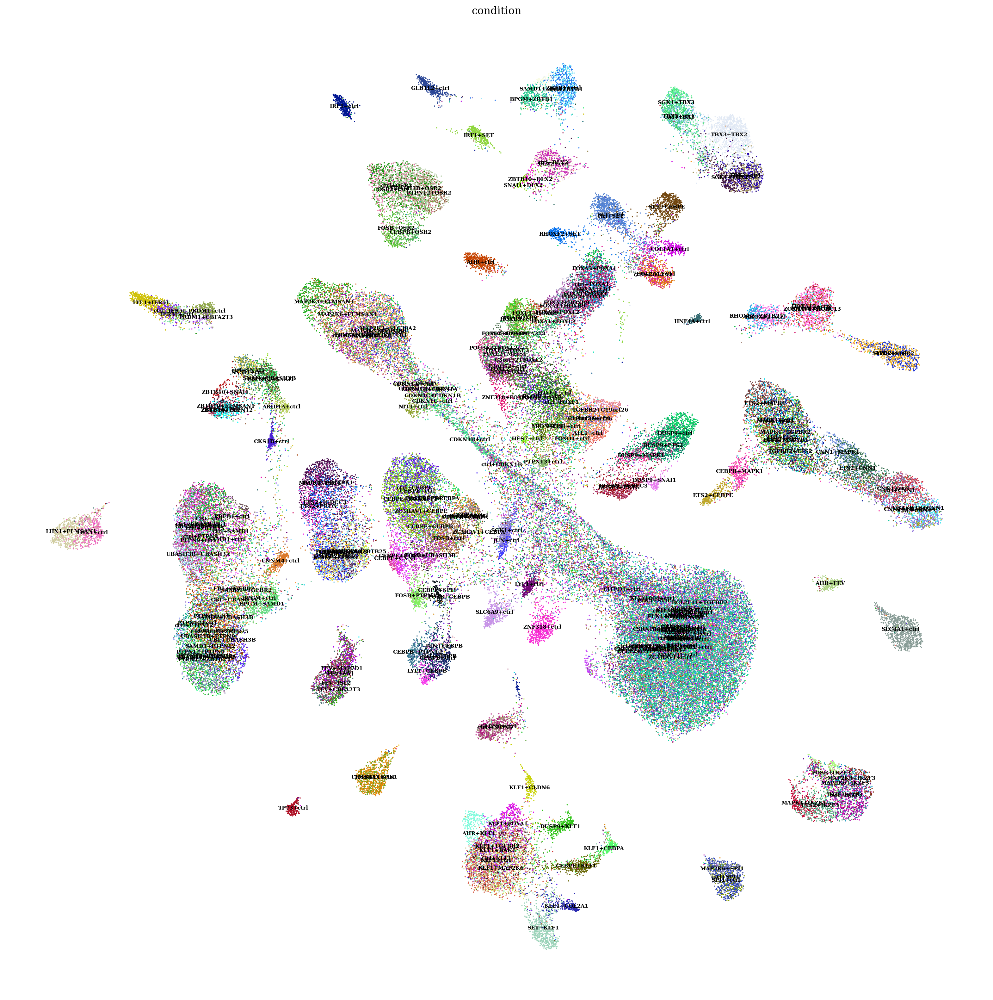

In [12]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()

In [13]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

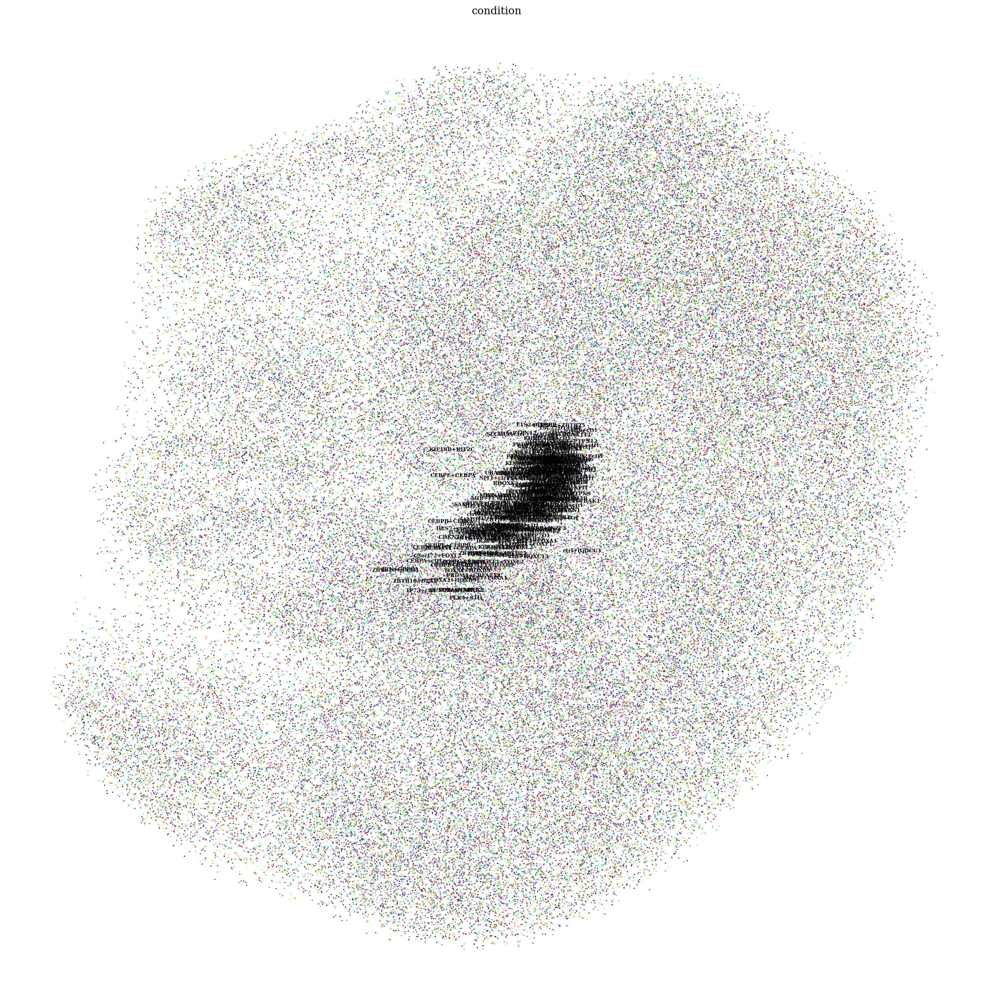

In [14]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()